In [1]:
import json
from pathlib import Path
import pickle

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.interpolate import interp1d
from config import MainConfig


sns.set_theme(style="whitegrid")

RESULTS_DIR = Path("/home/chris/Desktop/bayesian-security-games/games/ADS_merging/code/experiment_results")

result_files = sorted(RESULTS_DIR.glob("*.json"))
len(result_files)

def load_result(path):
    with open(path, "r") as f:
        return json.load(f)

results = [load_result(p) for p in result_files]

# Constants (use the same ones as analysis)
L1 = 0
L2 = 4
L3 = 8
W1 = 20
W2 = 80

LEFT_CENTER  = 0.5 * (L1 + L2)  # = 2
RIGHT_CENTER = 0.5 * (L2 + L3)  # = 6


def right_bound(y):
    mp = np.clip((y - W1) / (W2 - W1), 0.0, 1.0)
    return (1 - mp) * L3 + mp * L2

def perfect_run(y):
    mp = np.clip((y - W1) / (W2 - W1), 0.0, 1.0)
    optimal_x = mp * LEFT_CENTER + (1-mp)*RIGHT_CENTER
    return optimal_x



In [2]:
#Timestep-level dataframe

rows = []

for r in results:
    meta = r["meta"]
    model_name = r["model"]
    instance = r["instance"]

    for step in r["results"]["step_logs"]:
        rows.append({
            # Identifiers
            "model": model_name,
            "instance": instance,

            # Architecture
            "depth": meta["depth"],
            "width": meta["width"],
            "activation": meta["activation"],
            "learning_rate": meta["learning_rate"],

            # Time
            "t": step["t"],

            # Actions
            "defender_action": step["defender_action"],
            "attacker_action": step["attacker_action"],

            # Utility
            "defender_utility": step["defender_utility"],

            # True defender state
            "def_x": step["def_x"],
            "def_y": step["def_y"],
            "def_heading": step["def_heading"],
            "def_speed": step["def_speed"],

            # True attacker state
            "att_x": step["att_x"],
            "att_y": step["att_y"],
            "att_heading": step["att_heading"],
            "att_speed": step["att_speed"],

            # Filter means (defender)
            "f_def_x": step["filter_def_x"],
            "f_def_y": step["filter_def_y"],
            "f_def_heading": step["filter_def_heading"],
            "f_def_speed": step["filter_def_speed"],

            # Filter means (attacker)
            "f_att_x": step["filter_att_x"],
            "f_att_y": step["filter_att_y"],
            "f_att_heading": step["filter_att_heading"],
            "f_att_speed": step["filter_att_speed"],
        })

df = pd.DataFrame(rows)
df.head()

,model,instance,depth,width,activation,learning_rate,t,defender_action,attacker_action,defender_utility,...,att_heading,att_speed,f_def_x,f_def_y,f_def_heading,f_def_speed,f_att_x,f_att_y,f_att_heading,f_att_speed
0,d2_w128_actrelu_lr1e-02_seed148110,i0.pkl,2,128,relu,0.01,0,6,2,-3.219814,...,1.350137,26.75,5.786701,2.595546,-0.744437,22.866085,1.777526,3.215982,1.339677,26.625044
1,d2_w128_actrelu_lr1e-02_seed148110,i0.pkl,2,128,relu,0.01,1,0,3,-5.070002,...,0.012501,26.75,5.730886,5.005378,-1.682399,22.528896,1.822476,5.734569,0.106161,26.809271
2,d2_w128_actrelu_lr1e-02_seed148110,i0.pkl,2,128,relu,0.01,2,2,3,-3.236482,...,-1.325135,26.75,5.675903,7.112216,-0.792194,22.495787,1.638991,8.364359,-1.431089,26.605989
3,d2_w128_actrelu_lr1e-02_seed148110,i0.pkl,2,128,relu,0.01,3,0,1,-5.053334,...,-1.325135,26.50,5.600892,9.359962,-1.917525,22.294106,1.572975,11.023679,-1.432291,26.355112
4,d2_w128_actrelu_lr1e-02_seed148110,i0.pkl,2,128,relu,0.01,4,0,0,-6.853516,...,-2.650269,26.25,5.491702,11.584050,-3.011358,22.046513,1.470482,13.662048,-2.746459,26.107292


In [3]:
# Constants (use the same ones as analysis)
L1 = 0
L2 = 4
L3 = 8
W1 = 20
W2 = 80

LEFT_CENTER  = 0.5 * (L1 + L2)  # = 2
RIGHT_CENTER = 0.5 * (L2 + L3)  # = 6


def right_bound(y):
    mp = np.clip((y - W1) / (W2 - W1), 0.0, 1.0)
    return (1 - mp) * L3 + mp * L2

def perfect_run(y):
    mp = np.clip((y - W1) / (W2 - W1), 0.0, 1.0)
    optimal_x = mp * LEFT_CENTER + (1-mp)*RIGHT_CENTER
    return optimal_x

#Optimality Error
df["dist_from_optimal"] = abs(df["def_x"] - perfect_run(df["def_y"]))

# Belief errors (defender)
df["be_def_x"] = df["def_x"] - df["f_def_x"]
df["be_def_y"] = df["def_y"] - df["f_def_y"]
df["be_def_heading"] = df["def_heading"] - df["f_def_heading"]
df["be_def_speed"] = df["def_speed"] - df["f_def_speed"]

# Belief errors (attacker)
df["be_att_x"] = df["att_x"] - df["f_att_x"]
df["be_att_y"] = df["att_y"] - df["f_att_y"]
df["be_att_heading"] = df["att_heading"] - df["f_att_heading"]
df["be_att_speed"] = df["att_speed"] - df["f_att_speed"]

# Absolute errors
for c in [
    "be_def_x","be_def_y","be_def_heading","be_def_speed",
    "be_att_x","be_att_y","be_att_heading","be_att_speed"
]:
    df[f"abs_{c}"] = df[c].abs()

# ---------------- Road occupancy ----------------
# Pull constants from config (hard-code or load once)
SOFT_MERGE = W1
HARD_MERGE = W2

df["merge_progress"] = (
    (df["def_y"] - SOFT_MERGE) / (HARD_MERGE - SOFT_MERGE)
).clip(0.0, 1.0)

df["right_bound"] = (
    (1.0 - df["merge_progress"]) * L3
    + df["merge_progress"] * L2
)

df["left_bound"] = L1

STRAIGHT_HEADING = 0.0  # radians or degrees, consistent with your data
LEFT_CENTERLINE_X = (L1 + L2) / 2


df["on_road"] = (
    (df["def_x"] >= df["left_bound"]) &
    (df["def_x"] <= df["right_bound"])
)


# ---------------- Distance between cars ----------------
CAR_LENGTH = 4.0
CAR_WIDTH  = 2.0
HALF_L = CAR_LENGTH / 2
HALF_W = CAR_WIDTH  / 2


df["car_distance"] = np.sqrt(
    (df["def_x"] - df["att_x"])**2 +
    (df["def_y"] - df["att_y"])**2
)

df["collision"] = (
    (np.abs(df["def_x"] - df["att_x"]) <= 2 * HALF_W) &
    (np.abs(df["def_y"] - df["att_y"]) <= 2 * HALF_L)
)

# Episode-level dataframe

episode_df = (
    df.groupby(
        ["model", "instance", "depth", "width", "activation", "learning_rate"]
    )
    .agg(
        # ---------------- Utility ----------------
        total_utility=("defender_utility", "sum"),
        avg_utility=("defender_utility", "mean"),
        min_utility=("defender_utility", "min"),
        max_utility=("defender_utility", "max"),
        utility_std=("defender_utility", "std"),

        # -------- Optimal trajectory adherence --------
        mean_dist_from_optimal=("dist_from_optimal", "mean"),
        max_dist_from_optimal=("dist_from_optimal", "max"),
        final_dist_from_optimal=("dist_from_optimal", "last"),


        # ---------------- Final state ----------------
        final_def_x=("def_x", "last"),
        final_def_y=("def_y", "last"),
        final_def_heading=("def_heading", "last"),
        final_def_speed=("def_speed", "last"),

        final_att_x=("att_x", "last"),
        final_att_y=("att_y", "last"),

        dist_from_left_centerline=(
            "def_x", lambda x: abs(x.iloc[-1] - LEFT_CENTERLINE_X)
        ),

        heading_deviation_final=(
            "def_heading", lambda h: abs(h.iloc[-1] - STRAIGHT_HEADING)
        ),

        # ---------------- Motion dynamics ----------------
        mean_def_speed=("def_speed", "mean"),
        std_def_speed=("def_speed", "std"),
        max_def_speed=("def_speed", "max"),

        mean_def_heading=("def_heading", "mean"),
        std_def_heading=("def_heading", "std"),

        # ---------------- Belief quality (RMSE-style) ----------------
        rmse_def_x=("abs_be_def_x", lambda x: np.sqrt(np.mean(x**2))),
        rmse_def_y=("abs_be_def_y", lambda x: np.sqrt(np.mean(x**2))),
        rmse_def_heading=("abs_be_def_heading", lambda x: np.sqrt(np.mean(x**2))),
        rmse_def_speed=("abs_be_def_speed", lambda x: np.sqrt(np.mean(x**2))),

        rmse_att_x=("abs_be_att_x", lambda x: np.sqrt(np.mean(x**2))),
        rmse_att_y=("abs_be_att_y", lambda x: np.sqrt(np.mean(x**2))),

        # ---------------- Safety: proximity ----------------
        min_car_distance=("car_distance", "min"),
        mean_car_distance=("car_distance", "mean"),

        collision_occurred=("collision", "any"),
        collision_steps=("collision", "sum"),


        # -------- Road adherence --------
        time_on_road=("on_road", "mean"),
        steps_on_road=("on_road", "sum"),

    )
    .reset_index()
)

episode_df["perfect_episode"] = (
    (episode_df["time_on_road"] == 1.0) &
    (episode_df["collision_occurred"] == False) &
    (episode_df["heading_deviation_final"] < 5.0)
)

perfect_rate = (
    episode_df
    .groupby(["activation", "depth"], as_index=False)
    .agg(
        perfect_rate=("perfect_episode", "mean"),
        n=("perfect_episode", "size")
    )
)

episode_df["merge_success"] = (
    episode_df["dist_from_left_centerline"] <= 2.0
).astype(int)



episode_df.head()


,model,instance,depth,width,activation,learning_rate,total_utility,avg_utility,min_utility,max_utility,...,rmse_att_x,rmse_att_y,min_car_distance,mean_car_distance,collision_occurred,collision_steps,time_on_road,steps_on_road,perfect_episode,merge_success
0,d2_w128_actrelu_lr1e-02_seed148110,i0.pkl,2,128,relu,0.01,-413.407379,-10.335184,-19.588146,-3.219814,...,0.290318,1.812895,3.926068,7.342494,False,0,0.675,27,False,0
1,d2_w128_actrelu_lr1e-02_seed148110,i1.pkl,2,128,relu,0.01,-161.632354,-4.040809,-6.803512,-1.386294,...,0.142702,0.275495,3.926068,13.273470,False,0,0.725,29,False,0
2,d2_w128_actrelu_lr1e-02_seed148110,i10.pkl,2,128,relu,0.01,-184.193574,-4.604839,-10.761640,-1.402963,...,1.213904,1.348429,3.926068,12.455814,False,0,1.000,40,True,1
3,d2_w128_actrelu_lr1e-02_seed148110,i11.pkl,2,128,relu,0.01,-313.726308,-7.843158,-16.237804,-1.386294,...,1.022130,1.420448,4.052301,8.966241,False,0,1.000,40,True,1
4,d2_w128_actrelu_lr1e-02_seed148110,i12.pkl,2,128,relu,0.01,-184.098251,-4.602456,-8.837052,-1.402963,...,0.218652,0.207454,4.052301,14.732309,False,0,1.000,40,True,1


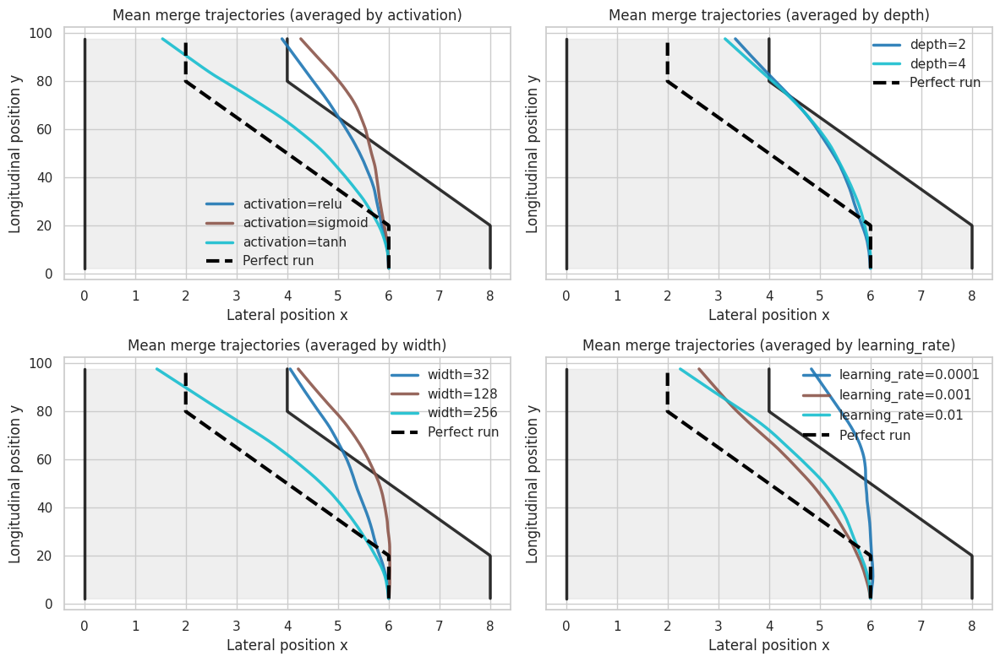

In [4]:
def compute_mean_trajectory(df, design_point, y_grid, group_cols=("model", "instance")):
    """
    Compute mean x(y) trajectory for a given design point.
    """
    subdf = df.copy()
    for k, v in design_point.items():
        subdf = subdf[subdf[k] == v]

    trajs = []

    for _, sub in subdf.groupby(list(group_cols)):
        sub = sub.sort_values("def_y")
        if len(sub) < 5:
            continue

        f = interp1d(
            sub["def_y"],
            sub["def_x"],
            bounds_error=False,
            fill_value="extrapolate"
        )
        trajs.append(f(y_grid))

    if not trajs:
        return None

    return np.vstack(trajs).mean(axis=0)

def plot_road(ax, y_grid, L1, right_bound_fn):
    rb = np.array([right_bound_fn(y) for y in y_grid])

    ax.fill_betweenx(
        y_grid, L1, rb,
        color="lightgray", alpha=0.35, zorder=0
    )

    ax.plot(
        np.full_like(y_grid, L1), y_grid,
        color="black", lw=2.5, alpha=0.8, zorder=1
    )
    ax.plot(
        rb, y_grid,
        color="black", lw=2.5, alpha=0.8, zorder=1
    )

def plot_mean_merge_trajectories(
    df,
    episode_df,
    y_grid,
    color_by,
    factors=("depth", "width", "activation", "learning_rate"),
    cmap="tab10",
    show_optimal=True,
    ax=None,
):
    """
    Plot mean merge trajectories averaged over all factors except `color_by`.
    One curve per level of `color_by`.
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(6.5, 8))

    linestyles = {
        lvl: ls for lvl, ls in zip(
            sorted(episode_df["depth"].unique()),
            ["-", "--", ":"]
        )
    }


    # Factor levels to plot
    levels = sorted(episode_df[color_by].unique())

    # Color mapping
    cmap = plt.get_cmap(cmap)
    color_map = {
        lvl: cmap(i / max(len(levels) - 1, 1))
        for i, lvl in enumerate(levels)
    }

    # Draw road
    plot_road(ax, y_grid, L1, right_bound)

    # Plot ONE trajectory per factor level
    for lvl in levels:
        design_point = {color_by: lvl}

        mean_x = compute_mean_trajectory(df, design_point, y_grid)
        if mean_x is None:
            continue

        ax.plot(
            mean_x,
            y_grid,
            lw=2.5,
            alpha=0.9,
            color=color_map[lvl],
            zorder=3,
            label=f"{color_by}={lvl}"
        )

    # Optional: perfect run
    if show_optimal:
        ax.plot(
            perfect_run(y_grid),
            y_grid,
            color="black",
            lw=3,
            linestyle="--",
            label="Perfect run",
            zorder=4
        )

    ax.legend(frameon=False)
    ax.set_xlabel("Lateral position x")
    ax.set_ylabel("Longitudinal position y")
    ax.set_title(f"Mean merge trajectories (averaged by {color_by})")

    return ax


y_grid = np.linspace(
    df["def_y"].min(),
    df["def_y"].max(),
    250
)


fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharey=True)

plot_mean_merge_trajectories(df, episode_df, y_grid, color_by="activation",     ax=axes[0, 0])
plot_mean_merge_trajectories(df, episode_df, y_grid, color_by="depth",          ax=axes[0, 1])
plot_mean_merge_trajectories(df, episode_df, y_grid, color_by="width",          ax=axes[1, 0])
plot_mean_merge_trajectories(df, episode_df, y_grid, color_by="learning_rate",  ax=axes[1, 1])


plt.tight_layout()
plt.show()



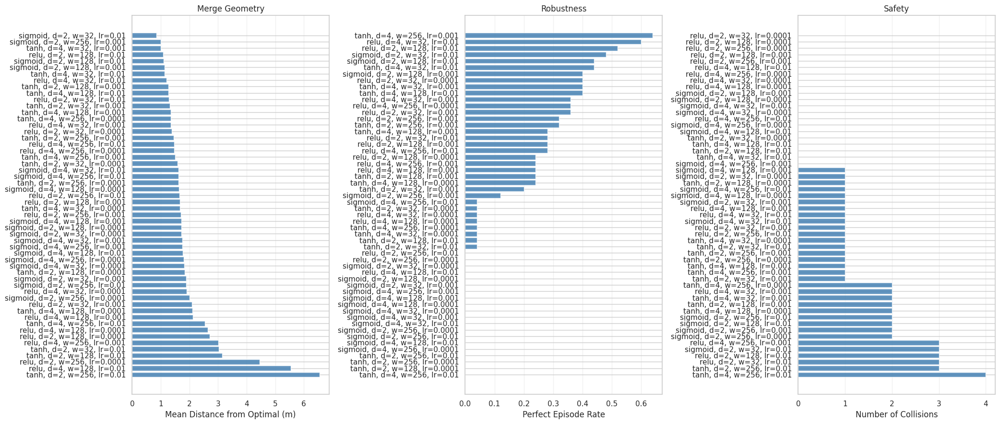

In [5]:
# Metric Plots

k=54 #Number of models to plot

model_df = (
    episode_df
    .groupby(
        ["activation", "depth", "width", "learning_rate"],
        as_index=False
    )
    .agg(
        mean_dist_from_optimal=("mean_dist_from_optimal", "mean"),
        perfect_rate=("perfect_episode", "mean"),
        collision_rate=("collision_occurred", "sum"),
        n_episodes=("collision_occurred", "size"),
    )
)
topk_geometry = (
    model_df
    .sort_values("mean_dist_from_optimal", ascending=True)
    .head(k)
)

topk_robustness = (
    model_df
    .sort_values("perfect_rate", ascending=False)
    .head(k)
)

topk_safety = (
    model_df
    .sort_values("collision_rate", ascending=True)
    .head(k)
)

def model_label(row):
    return (
        f"{row['activation']}, d={row['depth']}, "
        f"w={row['width']}, lr={row['learning_rate']}"
    )

for df_ in [topk_geometry, topk_robustness, topk_safety]:
    df_["label"] = df_.apply(model_label, axis=1)

def plot_top10_bar(
    df,
    value_col,
    title,
    xlabel,
    higher_is_better,
    ax=None,
    annotate_zero=False,
):
    if ax is None:
        fig, ax = plt.subplots(figsize=(7, 4))

    df_plot = df.sort_values(value_col, ascending=not higher_is_better)

    ax.barh(
        df_plot["label"],
        df_plot[value_col],
        color="steelblue",
        alpha=0.85
    )

    # Explicit x-limits so zero bars are visible
    if df_plot[value_col].max() == 0:
        ax.set_xlim(0, 1.0)

        if annotate_zero:
            for i, lbl in enumerate(df_plot["label"]):
                ax.text(
                    0.02,
                    i,
                    "0",
                    va="center",
                    ha="left",
                    fontsize=9,
                    color="black"
                )

    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.invert_yaxis()
    ax.grid(axis="x", alpha=0.3)

    return ax



fig, axes = plt.subplots(1, 3, figsize=(21, 9), sharey=False)

plot_top10_bar(
    topk_geometry,
    value_col="mean_dist_from_optimal",
    title=f"Merge Geometry",
    xlabel="Mean Distance from Optimal (m)",
    higher_is_better=False,
    ax=axes[0],
)

plot_top10_bar(
    topk_robustness,
    value_col="perfect_rate",
    title=f"Robustness",
    xlabel="Perfect Episode Rate",
    higher_is_better=True,
    ax=axes[1],
)

plot_top10_bar(
    topk_safety,
    value_col="collision_rate",
    title=f"Safety",
    xlabel="Number of Collisions",
    higher_is_better=False,
    ax=axes[2],
    annotate_zero=True,
)


plt.tight_layout()
plt.show()


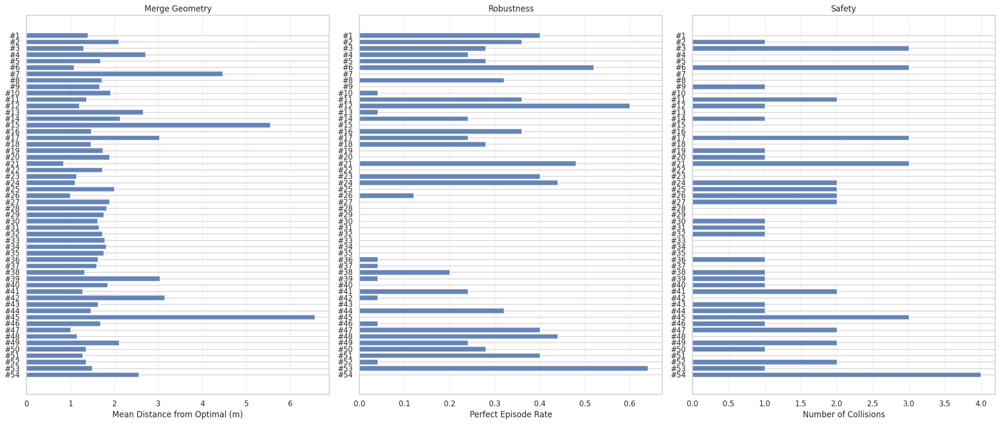

In [6]:
# Create a canonical design table
design_cols = ["activation", "depth", "width", "learning_rate"]

design_table = (
    model_df[design_cols]
    .drop_duplicates()
    .sort_values(design_cols)
    .reset_index(drop=True)
)

design_table["design_id"] = design_table.index + 1


def attach_design_id(df):
    return df.merge(design_table, on=design_cols, how="left")

topk_geometry   = attach_design_id(topk_geometry)
topk_robustness = attach_design_id(topk_robustness)
topk_safety     = attach_design_id(topk_safety)

def index_label(row):
    return f"#{int(row['design_id'])}"

for df_ in [topk_geometry, topk_robustness, topk_safety]:
    df_["label"] = df_.apply(index_label, axis=1)

def plot_indexed_bar(
    df,
    value_col,
    title,
    xlabel,
    ax=None,
):
    if ax is None:
        fig, ax = plt.subplots(figsize=(7, 4))

    # Sort by design index
    df_plot = df.sort_values("design_id")

    ax.barh(
        df_plot["label"],
        df_plot[value_col],
        alpha=0.85
    )

    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.invert_yaxis()
    ax.grid(axis="x", alpha=0.3)

    return ax

fig, axes = plt.subplots(1, 3, figsize=(21, 9), sharey=False)

plot_indexed_bar(
    topk_geometry,
    value_col="mean_dist_from_optimal",
    title=f"Merge Geometry",
    xlabel="Mean Distance from Optimal (m)",
    ax=axes[0],
)

plot_indexed_bar(
    topk_robustness,
    value_col="perfect_rate",
    title=f"Robustness",
    xlabel="Perfect Episode Rate",
    ax=axes[1],
)

plot_indexed_bar(
    topk_safety,
    value_col="collision_rate",
    title=f"Safety",
    xlabel="Number of Collisions",
    ax=axes[2],
)

plt.tight_layout()
plt.show()

design_lookup = design_table.sort_values("design_id")



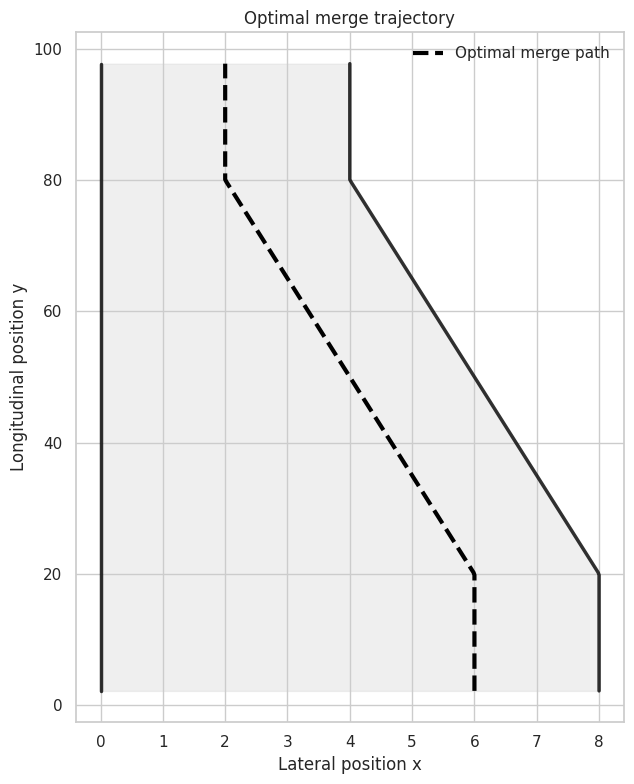

In [ ]:
def plot_optimal_route(y_grid):
    fig, ax = plt.subplots(figsize=(6.5, 8))

    # Road geometry
    plot_road(ax, y_grid, L1, right_bound)

    # Optimal route
    ax.plot(
        perfect_run(y_grid),
        y_grid,
        color="black",
        lw=3,
        linestyle="--",
        label="Optimal merge path",
        zorder=5
    )

    ax.set_xlabel("Lateral Position x")
    ax.set_ylabel("Longitudinal Position y")
    ax.set_title("Optimal Merge Trajectory")

    ax.legend(frameon=False)
    plt.tight_layout()
    plt.show()

plot_optimal_route(y_grid)

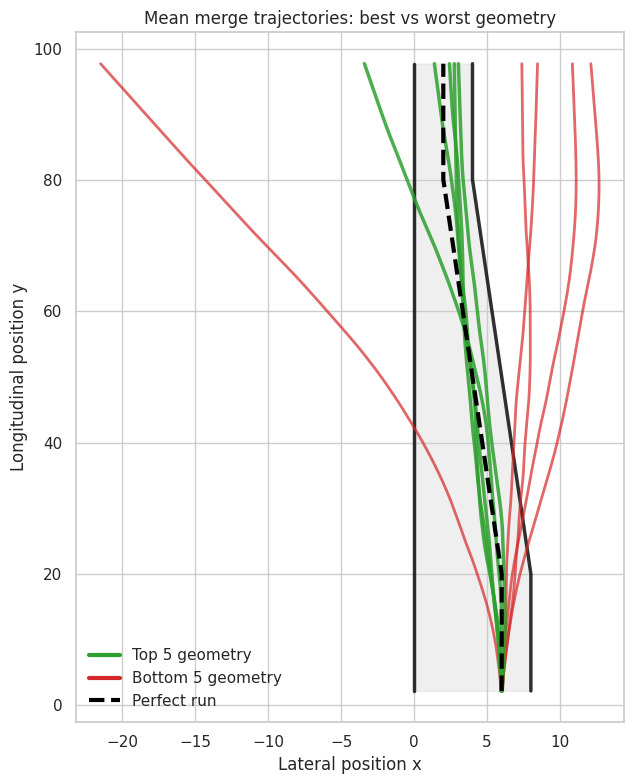

In [ ]:
# Sort by geometry metric
model_df_sorted = model_df.sort_values("mean_dist_from_optimal")

top5_models = model_df_sorted.head(5)
bottom5_models = model_df_sorted.tail(5)

def mean_traj_for_model(df, row, y_grid):
    design_point = {
        "activation": row["activation"],
        "depth": row["depth"],
        "width": row["width"],
        "learning_rate": row["learning_rate"],
    }
    return compute_mean_trajectory(df, design_point, y_grid)

def plot_top_bottom_geometry_trajectories(
    df,
    top_models,
    bottom_models,
    y_grid,
):
    fig, ax = plt.subplots(figsize=(6.5, 8))

    # Road
    plot_road(ax, y_grid, L1, right_bound)

    # Perfect run
    ax.plot(
        perfect_run(y_grid),
        y_grid,
        color="black",
        lw=3,
        linestyle="--",
        label="Perfect run",
        zorder=5
    )

    # ---- Top 5 (best geometry) ----
    for _, row in top_models.iterrows():
        mean_x = mean_traj_for_model(df, row, y_grid)
        if mean_x is None:
            continue

        ax.plot(
            mean_x,
            y_grid,
            color="#2ca02c",   # green
            lw=2.5,
            alpha=0.85,
            zorder=4
        )

    # ---- Bottom 5 (worst geometry) ----
    for _, row in bottom_models.iterrows():
        mean_x = mean_traj_for_model(df, row, y_grid)
        if mean_x is None:
            continue

        ax.plot(
            mean_x,
            y_grid,
            color="#d62728",   # red
            lw=2.0,
            alpha=0.7,
            zorder=3
        )

    # Legend
    from matplotlib.lines import Line2D
    legend_handles = [
        Line2D([0], [0], color="#2ca02c", lw=3, label="Top 5 geometry"),
        Line2D([0], [0], color="#d62728", lw=3, label="Bottom 5 geometry"),
        Line2D([0], [0], color="black", lw=3, linestyle="--", label="Perfect run"),
    ]
    ax.legend(handles=legend_handles, frameon=False)

    ax.set_xlabel("Lateral position x")
    ax.set_ylabel("Longitudinal position y")
    ax.set_title("Mean merge trajectories: best vs worst geometry")

    plt.tight_layout()
    plt.show()


plot_top_bottom_geometry_trajectories(
    df,
    top5_models,
    bottom5_models,
    y_grid
)


In [ ]:
slice = episode_df[
    (episode_df["depth"] == 4) &
    (episode_df["width"] == 256) &
    (episode_df["activation"] == "relu") &
    (episode_df["learning_rate"] == 1e-3) &
    (episode_df["dist_from_left_centerline"] <= 2.0 )
]

slice.head()

,model,instance,depth,width,activation,learning_rate,total_utility,avg_utility,min_utility,max_utility,...,rmse_att_x,rmse_att_y,min_car_distance,mean_car_distance,collision_occurred,collision_steps,time_on_road,steps_on_road,perfect_episode,merge_success
928,d4_w256_actrelu_lr1e-03_seed296120,i11.pkl,4,256,relu,0.001,-209.959687,-5.248992,-12.763479,-1.552979,...,0.070021,0.537160,3.831855,7.531198,True,1,1.0,40,True,1
931,d4_w256_actrelu_lr1e-03_seed296120,i14.pkl,4,256,relu,0.001,-262.824855,-6.570621,-14.236557,-1.652989,...,0.211319,0.374445,4.052301,10.619145,False,0,1.0,40,True,1
935,d4_w256_actrelu_lr1e-03_seed296120,i18.pkl,4,256,relu,0.001,-295.055442,-7.376386,-14.304275,-1.419631,...,0.148025,0.202204,3.791943,10.780648,False,0,1.0,40,True,1
938,d4_w256_actrelu_lr1e-03_seed296120,i20.pkl,4,256,relu,0.001,-282.451587,-7.061290,-15.976975,-1.386296,...,0.805930,0.532624,3.989271,10.912166,False,0,1.0,40,True,1
940,d4_w256_actrelu_lr1e-03_seed296120,i22.pkl,4,256,relu,0.001,-260.756032,-6.518901,-12.570766,-1.652987,...,0.338944,1.532136,3.989271,10.686434,False,0,1.0,40,True,1


In [ ]:
instance_summary = (
    episode_df
    .groupby("instance")
    .agg(
        success_rate=("merge_success", "mean"),
        n_models=("merge_success", "size")
    )
    .reset_index()
    .sort_values("success_rate")
)

instance_summary


,instance,success_rate,n_models
3,i11.pkl,0.148148,54
16,i23.pkl,0.203704,54
7,i15.pkl,0.222222,54
4,i12.pkl,0.222222,54
18,i3.pkl,0.222222,54
12,i2.pkl,0.222222,54
6,i14.pkl,0.240741,54
1,i1.pkl,0.240741,54
11,i19.pkl,0.240741,54
22,i7.pkl,0.240741,54


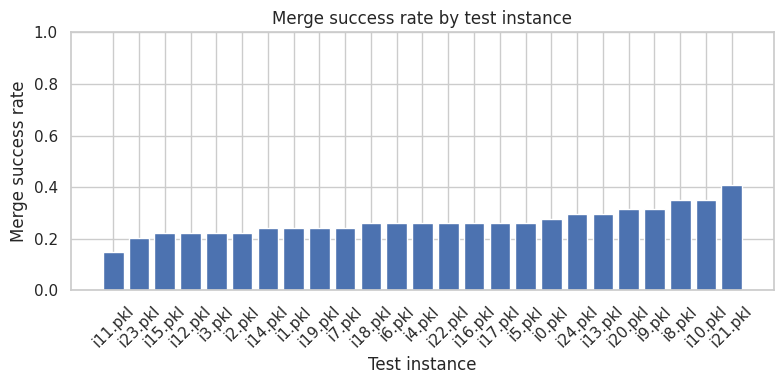

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))
plt.bar(
    instance_summary["instance"],
    instance_summary["success_rate"]
)
plt.ylabel("Merge success rate")
plt.xlabel("Test instance")
plt.title("Merge success rate by test instance")
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


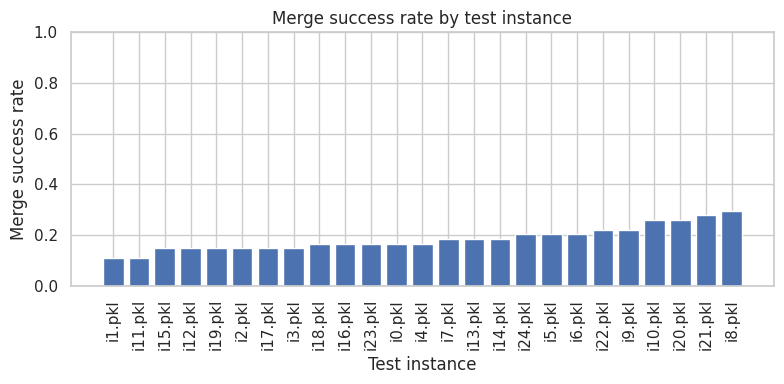

In [ ]:
import matplotlib.pyplot as plt

instance_summary = (
    episode_df
    .groupby("instance")
    .agg(
        success_rate=("perfect_episode", "mean"),
        n_models=("perfect_episode", "size")
    )
    .reset_index()
    .sort_values("success_rate")
)

instance_summary

plt.figure(figsize=(8, 4))
plt.bar(
    instance_summary["instance"],
    instance_summary["success_rate"]
)
plt.ylabel("Merge success rate")
plt.xlabel("Test instance")
plt.title("Merge success rate by test instance")
plt.ylim(0, 1)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [ ]:
var_by_instance = (
    instance_summary["success_rate"].var()
)

model_summary = (
    episode_df
    .groupby("model")
    .agg(success_rate=("merge_success", "mean"))
)

var_by_model = model_summary["success_rate"].var()

print("Variance by instance:", var_by_instance)
print("Variance by model:", var_by_model)


Variance by instance: 0.0023571101966163694
Variance by model: 0.048742417889587705


In [ ]:
overall_mean = episode_df["merge_success"].mean()

# Instance effects
instance_effects = (
    episode_df.groupby("instance")["merge_success"].mean()
    - overall_mean
)

# Model effects
model_effects = (
    episode_df.groupby("model")["merge_success"].mean()
    - overall_mean
)

print("Std dev of instance effects:", instance_effects.std())
print("Std dev of model effects:", model_effects.std())


Std dev of instance effects: 0.0539161400698954
Std dev of model effects: 0.22077685089154547


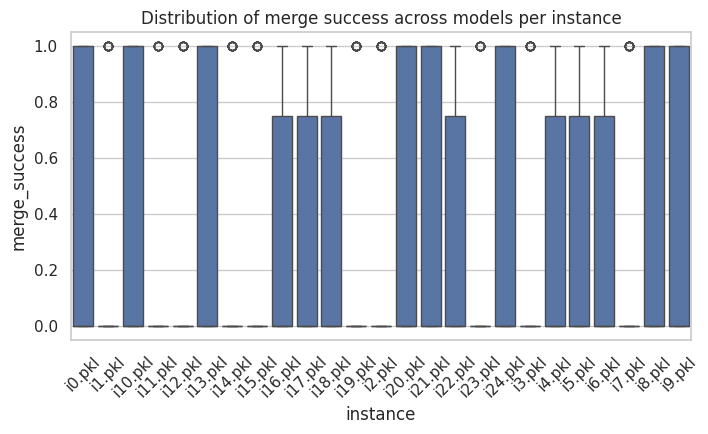

In [ ]:
plt.figure(figsize=(8,4))
sns.boxplot(
    data=episode_df,
    x="instance",
    y="merge_success"
)
plt.xticks(rotation=45)
plt.title("Distribution of merge success across models per instance")
plt.show()


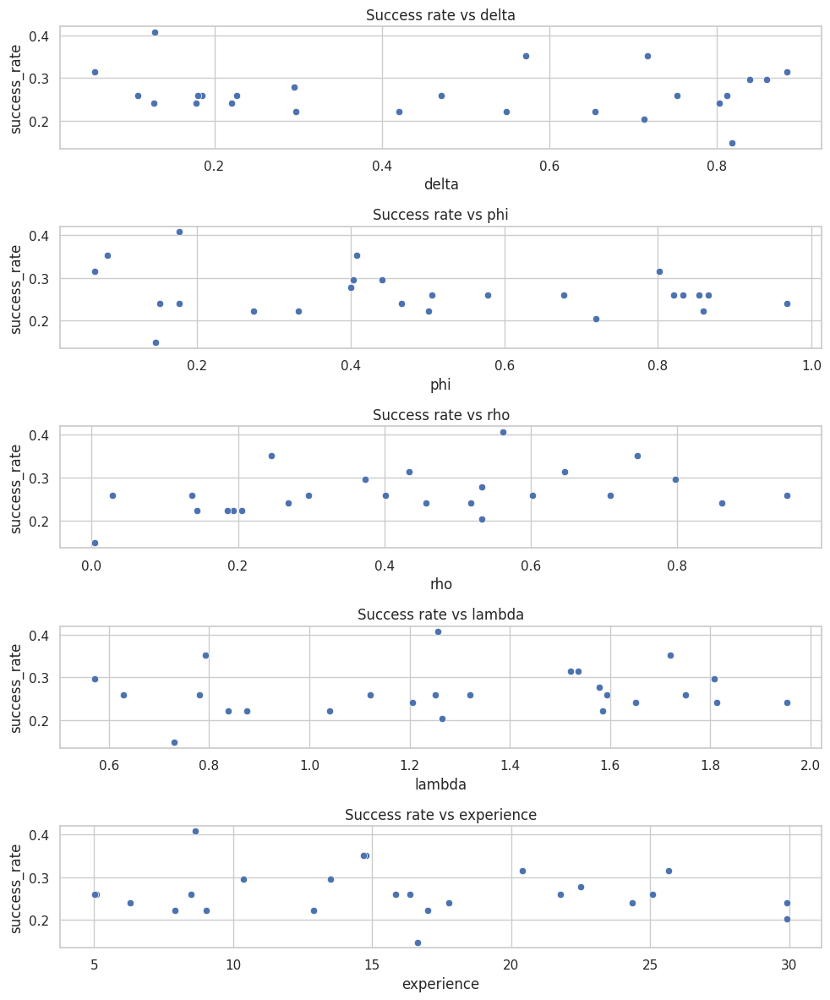

In [ ]:
ewa_rows = []


INSTANCES_DIR = Path(
    "/home/chris/Desktop/bayesian-security-games/games/ADS_merging/code/experiment_instances"
)

def load_instance(path):
    with open(path, "rb") as f:
        return pickle.load(f)

for inst_path in INSTANCES_DIR.glob("i*.pkl"):
    cfg = load_instance(inst_path)

    ewa_rows.append({
        "instance": inst_path.name,
        "delta": float(cfg.model.delta),
        "phi": float(cfg.model.phi),
        "rho": float(cfg.model.rho),
        "lambda": float(cfg.model.Lambda),
        "experience": float(cfg.model.experience),
        "beta_1": float(cfg.model.beta_A1),
        "beta_2": float(cfg.model.beta_A2),
        "beta_3": float(cfg.model.beta_A3),
        "beta_4": float(cfg.model.beta_A4),
        "beta_5": float(cfg.model.beta_A5),
        "beta_6": float(cfg.model.beta_A6),
        "attractions_init": cfg.model.initial_attractions
        # include others if relevant
    })

ewa_df = pd.DataFrame(ewa_rows)

instance_summary = (
    episode_df
    .groupby("instance")
    .agg(success_rate=("merge_success", "mean"))
    .reset_index()
)

inst_ewa_df = instance_summary.merge(
    ewa_df,
    on="instance",
    how="left"
)

import seaborn as sns
import matplotlib.pyplot as plt

fig, axes = plt.subplots(5, 1, figsize=(10, 12))
axes = axes.flatten()

for ax, param in zip(axes, ["delta", "phi", "rho", "lambda", "experience"]):
    sns.scatterplot(
        data=inst_ewa_df,
        x=param,
        y="success_rate",
        ax=ax
    )
    ax.set_title(f"Success rate vs {param}")

plt.tight_layout()
plt.show()

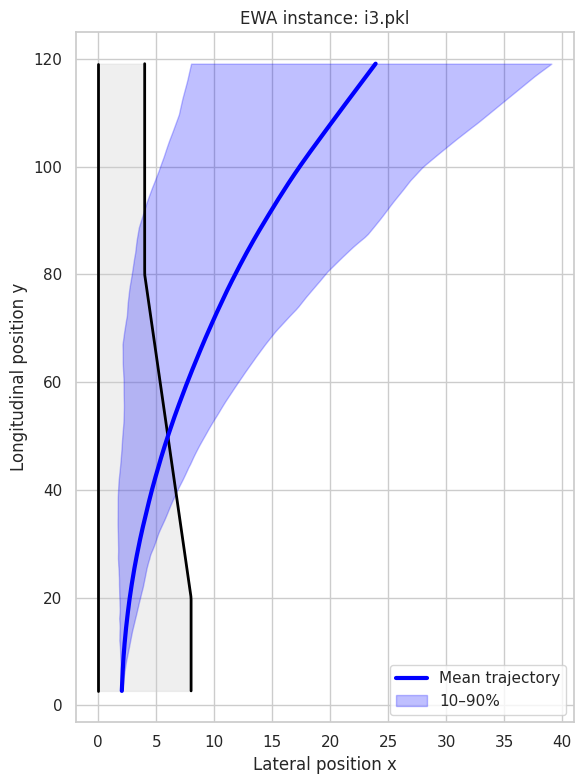

In [ ]:
import numpy as np
from scipy.interpolate import interp1d

def mean_EWA_trajectory_for_instance(
    df,
    instance,
    y_grid=None,
    min_points=5,
):
    """
    Compute the mean defender trajectory x(y) for a single EWA instance,
    averaged over all trained models.

    Returns:
        y_grid, mean_x, q10_x, q90_x
    """

    subdf = df[df["instance"] == instance]

    if y_grid is None:
        y_grid = np.linspace(
            subdf["att_y"].min(),
            subdf["att_y"].max(),
            200
        )

    trajs = []

    for model, sub in subdf.groupby("model"):
        sub = sub.sort_values("def_y")

        if len(sub) < min_points:
            continue

        # Ensure monotonic y for interpolation
        y = sub["att_y"].values
        x = sub["att_x"].values

        # Remove duplicate y values (important!)
        y_unique, idx = np.unique(y, return_index=True)
        x_unique = x[idx]

        if len(y_unique) < min_points:
            continue

        f = interp1d(
            y_unique,
            x_unique,
            bounds_error=False,
            fill_value="extrapolate",
        )

        trajs.append(f(y_grid))

    if len(trajs) == 0:
        raise ValueError(f"No valid trajectories for instance {instance}")

    trajs = np.vstack(trajs)

    mean_x = trajs.mean(axis=0)
    q10_x, q90_x = np.percentile(trajs, [10, 90], axis=0)

    return y_grid, mean_x, q10_x, q90_x

ewa_mean_trajs = {}

instances = df["instance"].unique()

for inst in instances:
    y_grid, mean_x, q10_x, q90_x = mean_EWA_trajectory_for_instance(
        df, inst
    )

    ewa_mean_trajs[inst] = {
        "y": y_grid,
        "mean_x": mean_x,
        "q10_x": q10_x,
        "q90_x": q90_x,
    }

def plot_ewa_mean_trajectory(inst, traj, show_band=True):
    y = traj["y"]
    mean_x = traj["mean_x"]

    plt.figure(figsize=(6, 8))

    # Road
    rb = np.array([right_bound(y_) for y_ in y])
    plt.fill_betweenx(
        y, L1, rb,
        color="lightgray", alpha=0.35, zorder=0
    )
    plt.plot(np.full_like(y, L1), y, color="black", lw=2)
    plt.plot(rb, y, color="black", lw=2)

    # Mean trajectory
    plt.plot(mean_x, y, color="blue", lw=3, label="Mean trajectory")

    if show_band:
        plt.fill_betweenx(
            y,
            traj["q10_x"],
            traj["q90_x"],
            color="blue",
            alpha=0.25,
            label="10–90%"
        )

    plt.xlabel("Lateral position x")
    plt.ylabel("Longitudinal position y")
    plt.title(f"EWA instance: {inst}")
    plt.legend()
    plt.tight_layout()
    plt.show()

plot_ewa_mean_trajectory(
    inst="i3.pkl",
    traj=ewa_mean_trajs["i3.pkl"]
)


Plotting instance i0.pkl


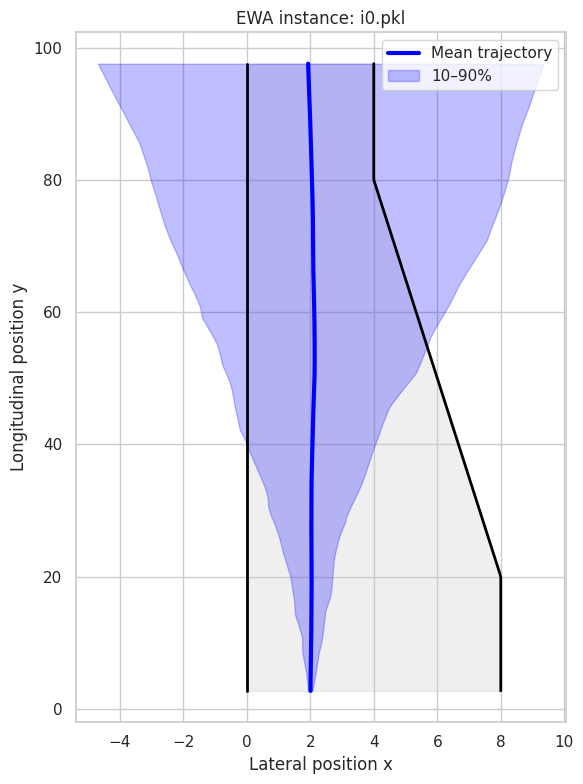

Plotting instance i1.pkl


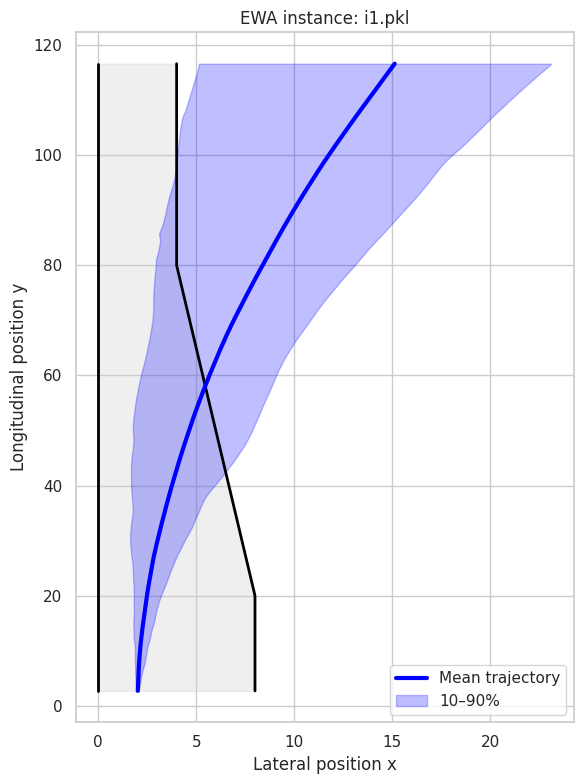

Plotting instance i10.pkl


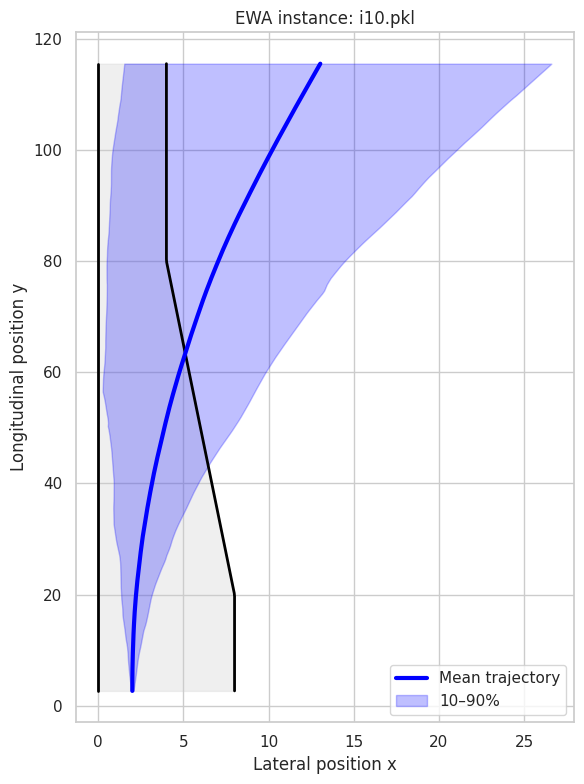

Plotting instance i11.pkl


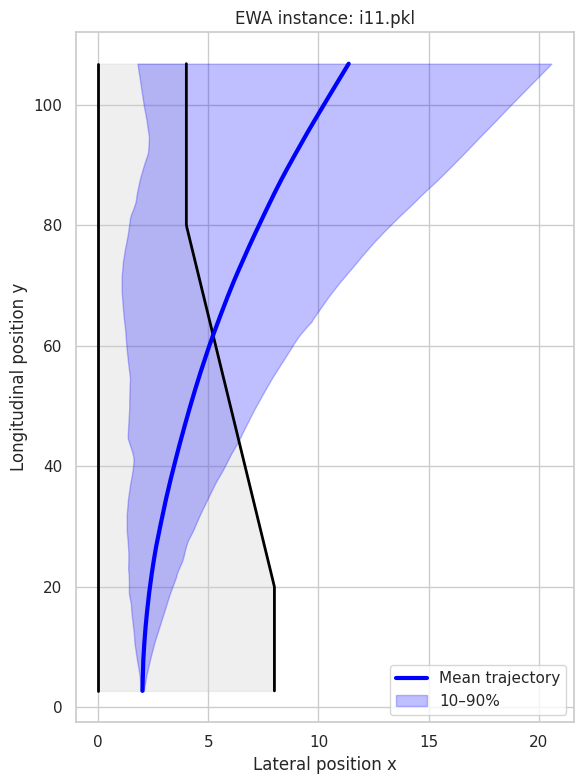

Plotting instance i12.pkl


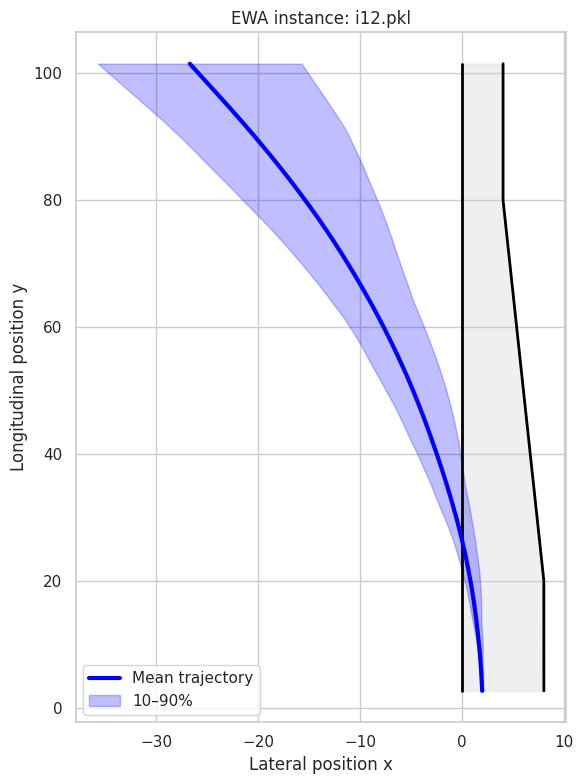

Plotting instance i13.pkl


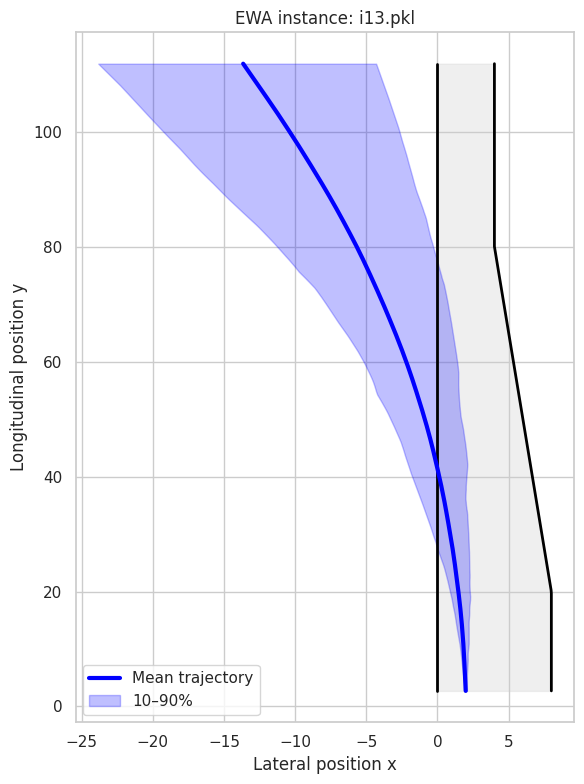

Plotting instance i14.pkl


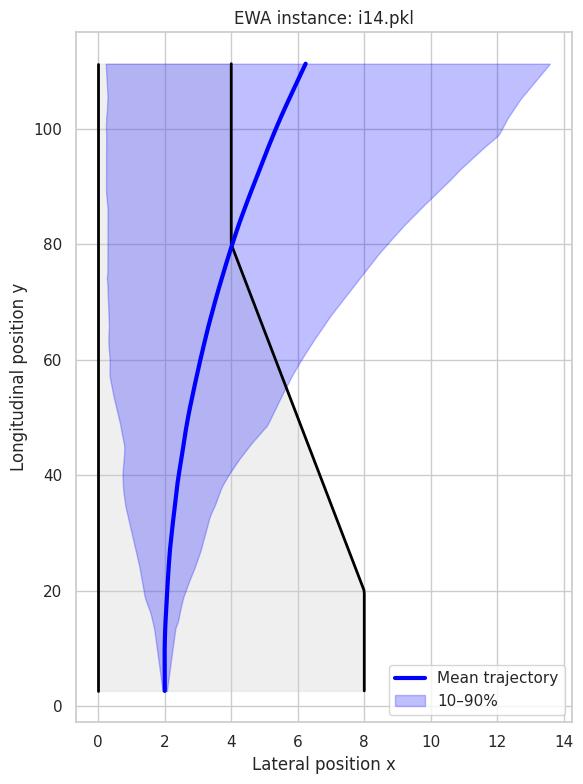

Plotting instance i15.pkl


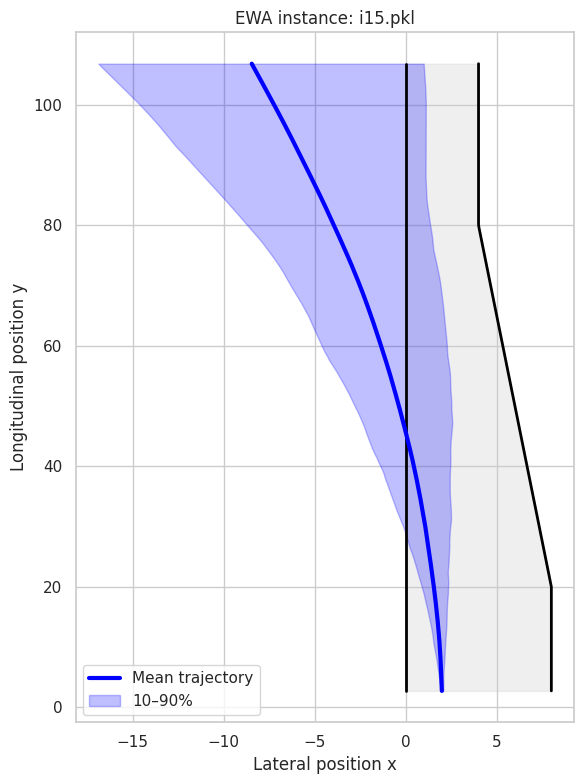

Plotting instance i16.pkl


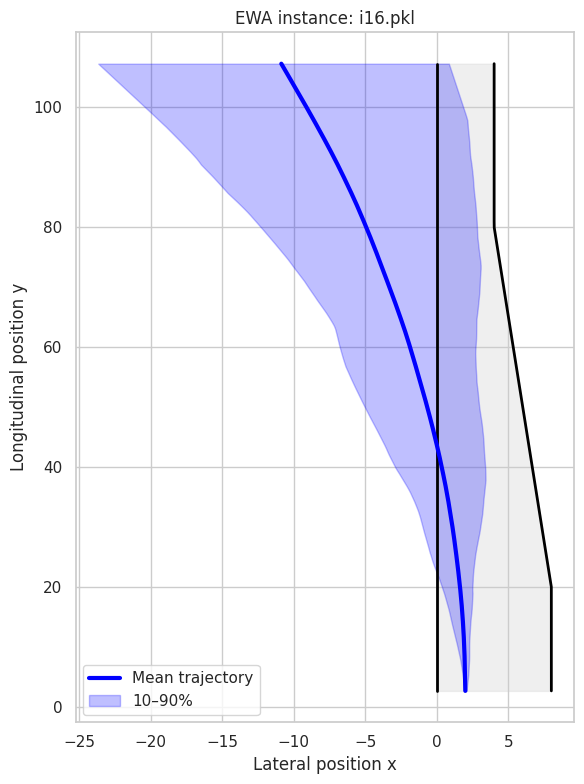

Plotting instance i17.pkl


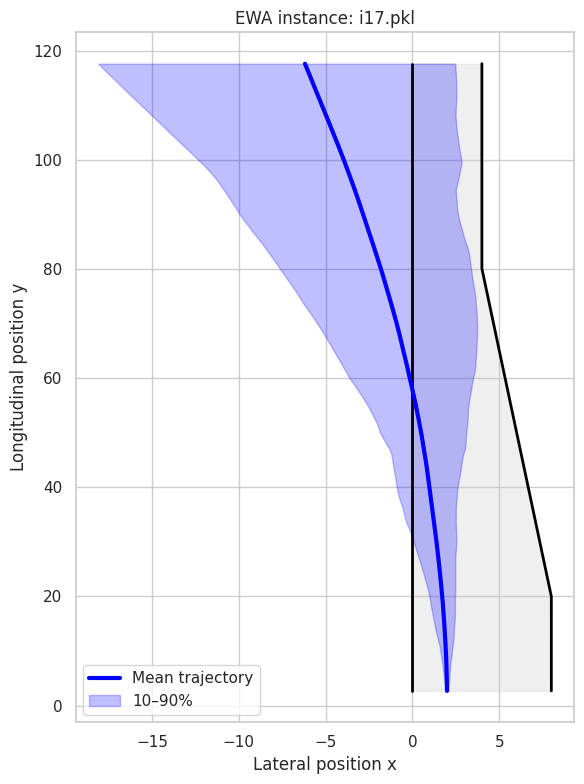

Plotting instance i18.pkl


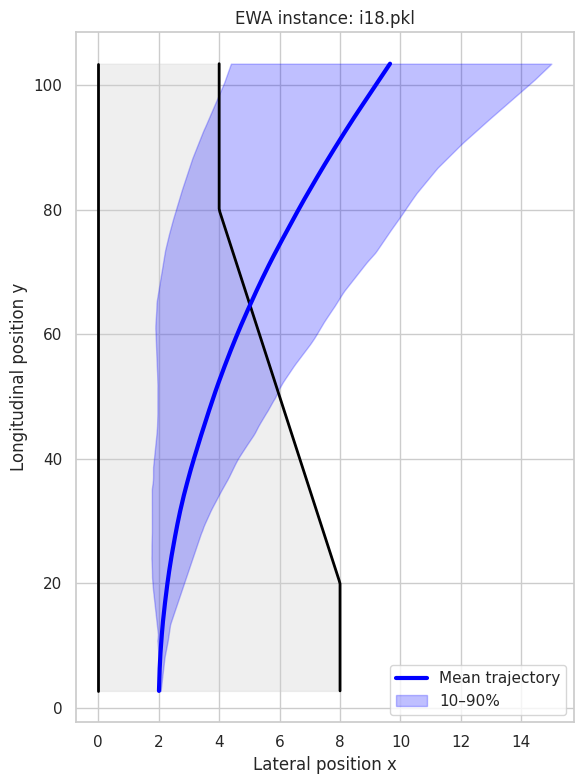

Plotting instance i19.pkl


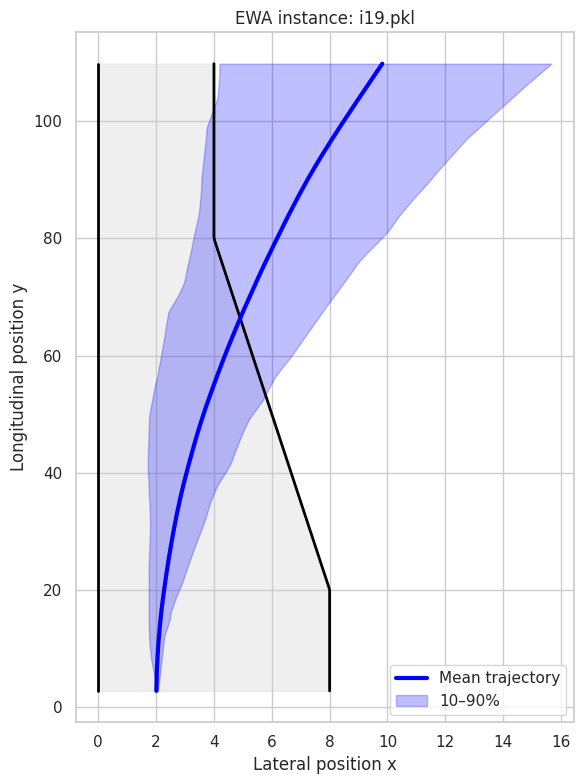

Plotting instance i2.pkl


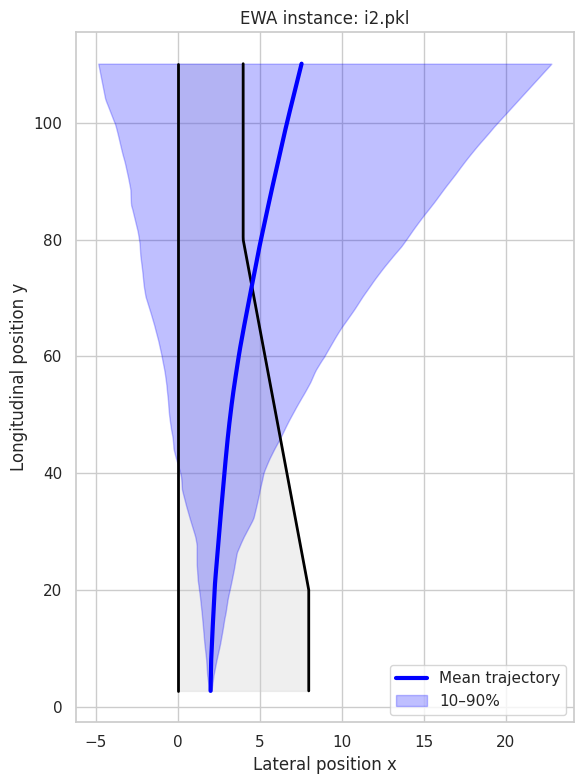

Plotting instance i20.pkl


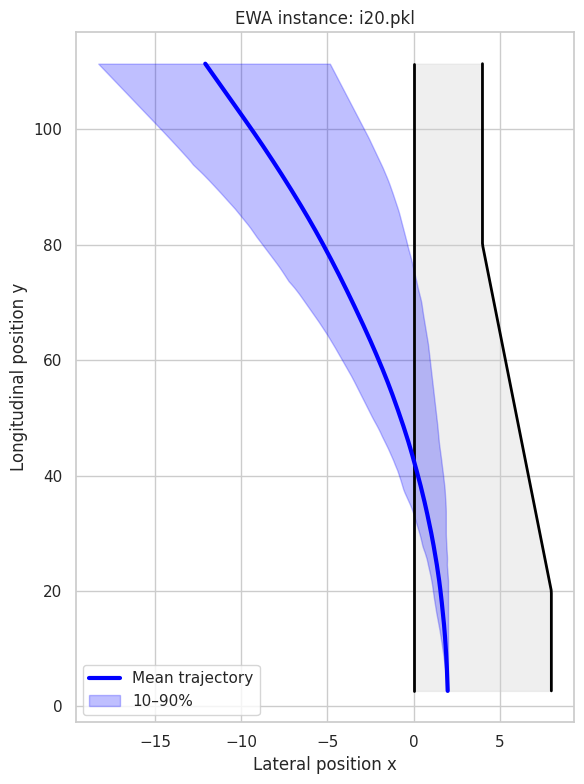

Plotting instance i21.pkl


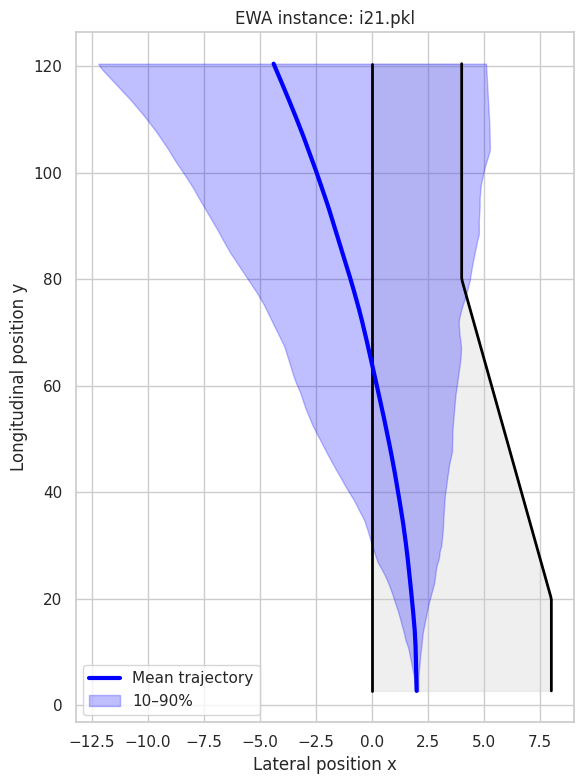

Plotting instance i22.pkl


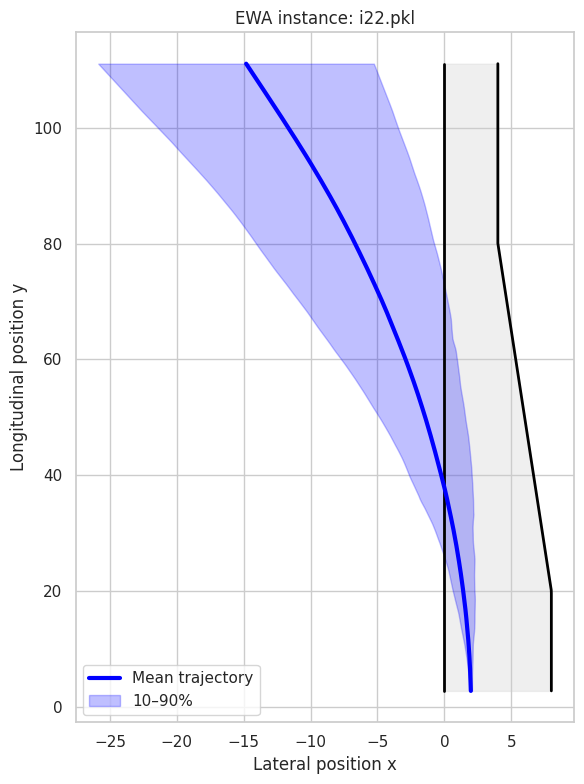

Plotting instance i23.pkl


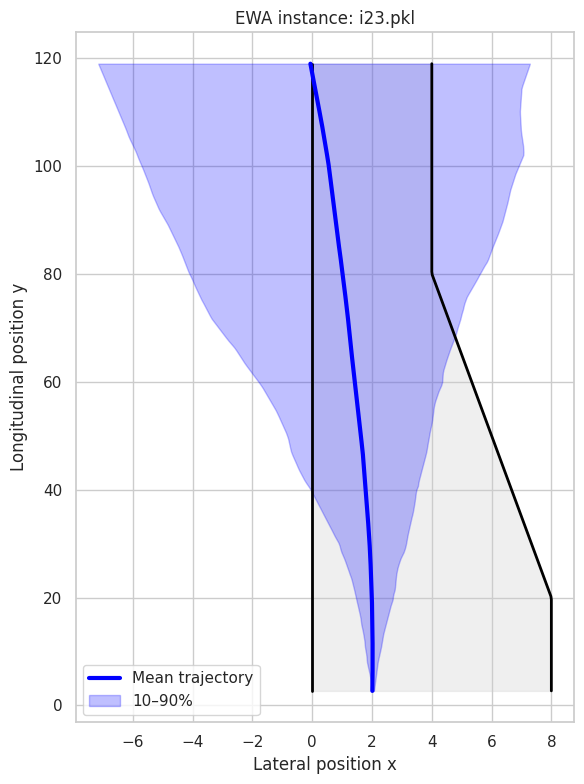

Plotting instance i24.pkl


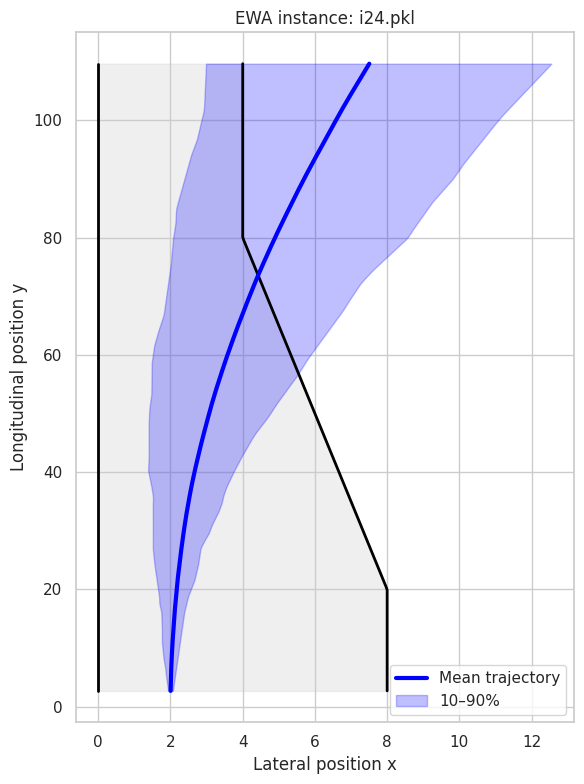

Plotting instance i3.pkl


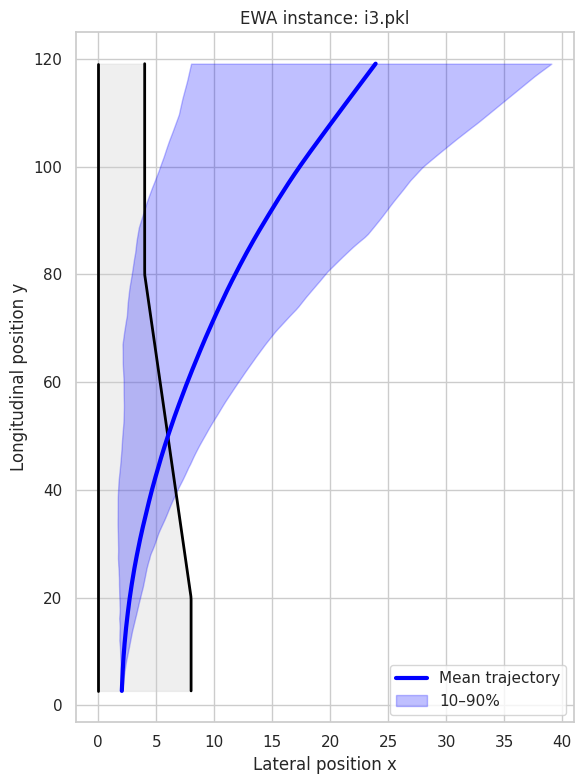

Plotting instance i4.pkl


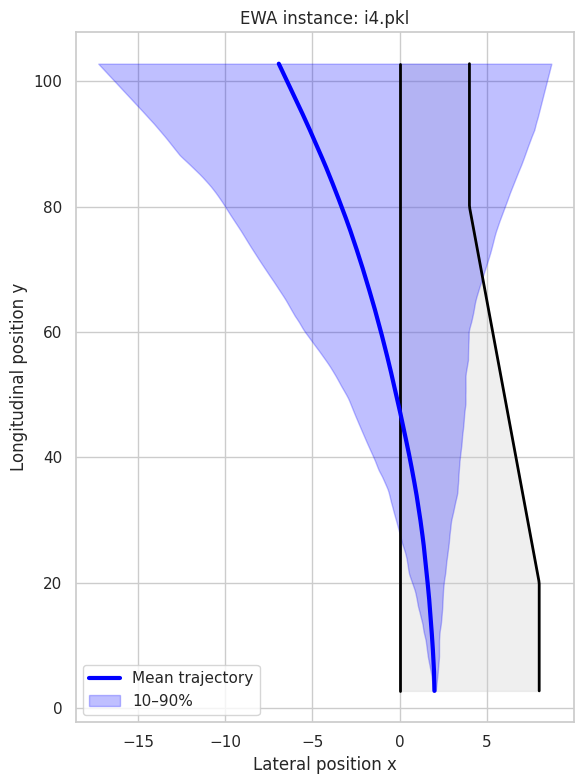

Plotting instance i5.pkl


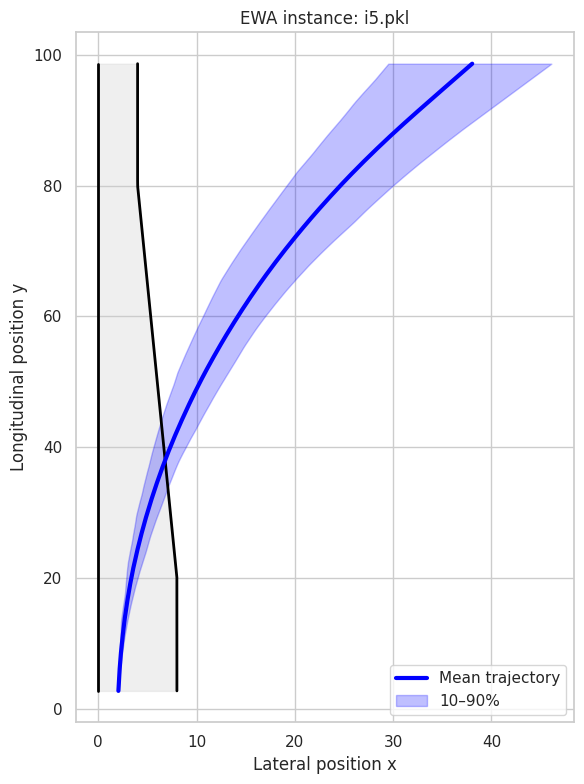

Plotting instance i6.pkl


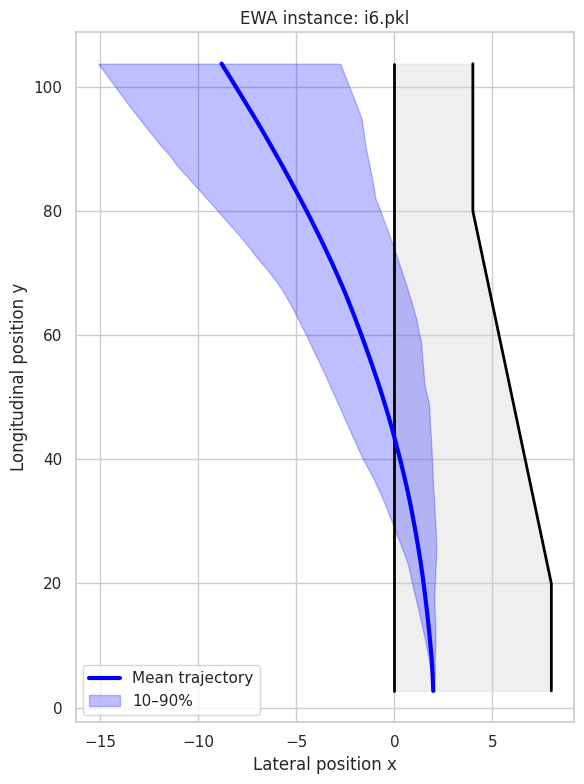

Plotting instance i7.pkl


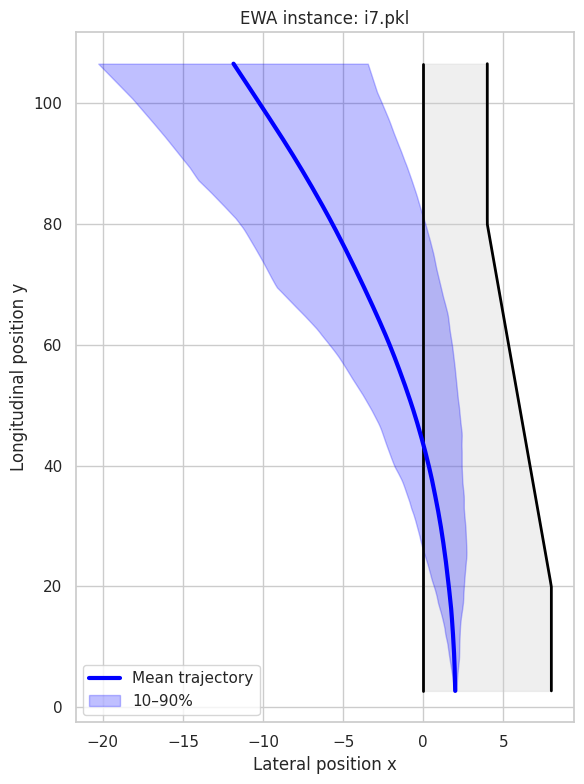

Plotting instance i8.pkl


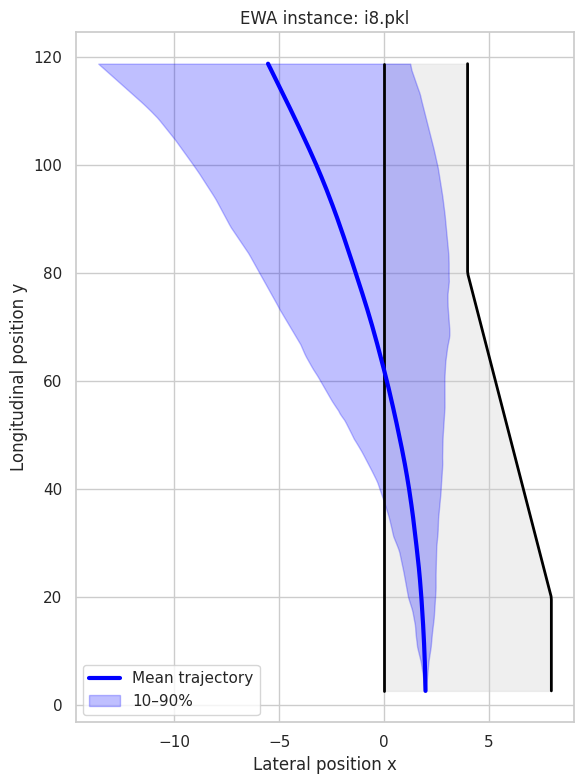

Plotting instance i9.pkl


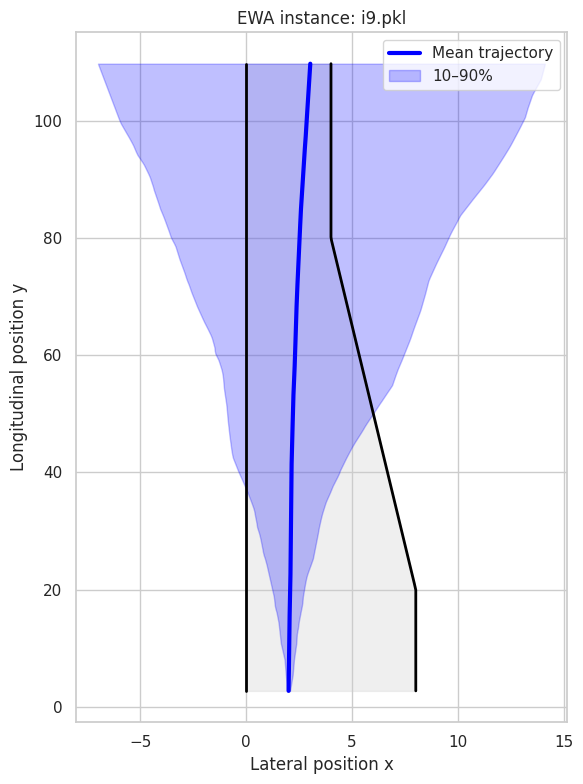

In [ ]:
for inst, traj in ewa_mean_trajs.items():
    print(f"Plotting instance {inst}")
    plot_ewa_mean_trajectory(inst, traj)


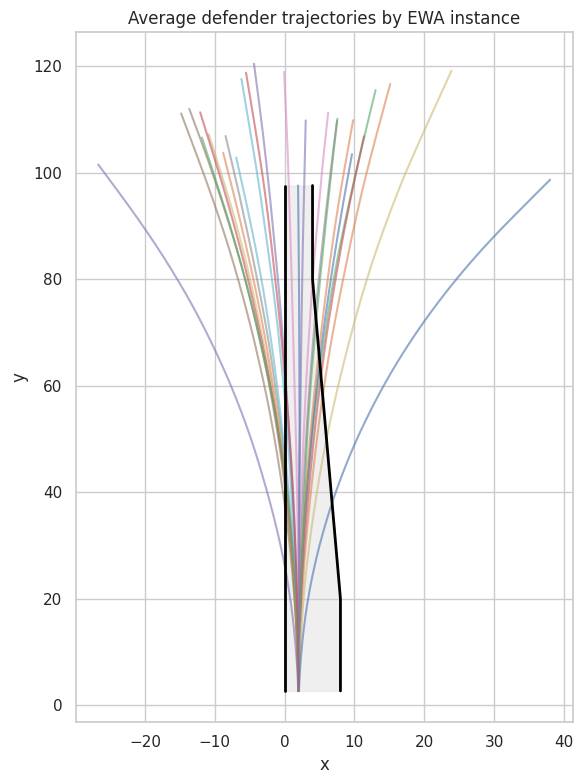

In [ ]:
plt.figure(figsize=(6, 8))

for inst, traj in ewa_mean_trajs.items():
    plt.plot(
        traj["mean_x"],
        traj["y"],
        lw=1.5,
        alpha=0.6
    )

# Road
y = next(iter(ewa_mean_trajs.values()))["y"]
rb = np.array([right_bound(y_) for y_ in y])
plt.fill_betweenx(y, L1, rb, color="lightgray", alpha=0.35)
plt.plot(np.full_like(y, L1), y, color="black", lw=2)
plt.plot(rb, y, color="black", lw=2)

plt.xlabel("x")
plt.ylabel("y")
plt.title("Average defender trajectories by EWA instance")
plt.tight_layout()
plt.show()


<Figure size 650x400 with 0 Axes>

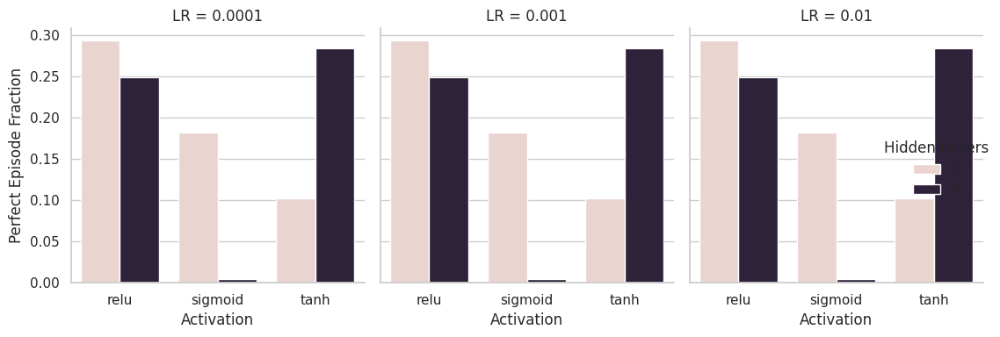

<function matplotlib.pyplot.show(close=None, block=None)>

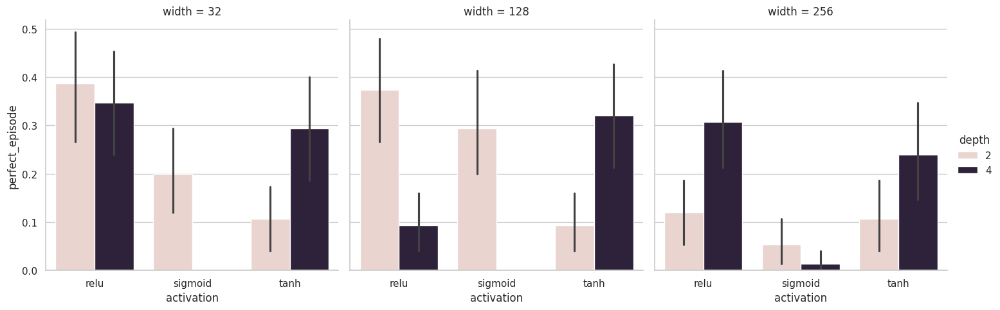

In [ ]:
plt.figure(figsize=(6.5, 4))

g = sns.catplot(
    data=perfect_rate.merge(episode_df[["activation","depth","learning_rate"]].drop_duplicates()),
    x="activation",
    y="perfect_rate",
    hue="depth",
    col="learning_rate",
    kind="bar",
    height=4,
    aspect=0.9,
)

g.set_axis_labels("Activation", "Perfect Episode Fraction")
g.set_titles("LR = {col_name}")
g._legend.set_title("Hidden Layers")
plt.tight_layout()
plt.show()

g = sns.catplot(
    data=episode_df,
    x="activation",
    y="perfect_episode",
    hue="depth",
    col="width",
    kind="bar",
)

plt.show


In [ ]:
def plot_metric_by_factors(
    df,
    metric,
    ylabel,
    facet_col,
    ylim=None,
    palette="colorblind",   # <- light colors by default
):
    """
    Boxplot of a metric by activation × depth, faceted by facet_col.
    """

    g = sns.catplot(
        data=df,
        x="activation",
        y=metric,
        hue="depth",
        col=facet_col,
        kind="box",
        height=4,
        aspect=0.9,
        palette=palette,
        showfliers=True,
        linewidth=1,
    )

    g.set_axis_labels("Activation Function", ylabel)
    g.set_titles(f"{facet_col} = {{col_name}}")
    g._legend.set_title("Hidden Layers")

    if ylim is not None:
        for ax in g.axes.flatten():
            ax.set_ylim(*ylim)

    plt.tight_layout()
    plt.show()


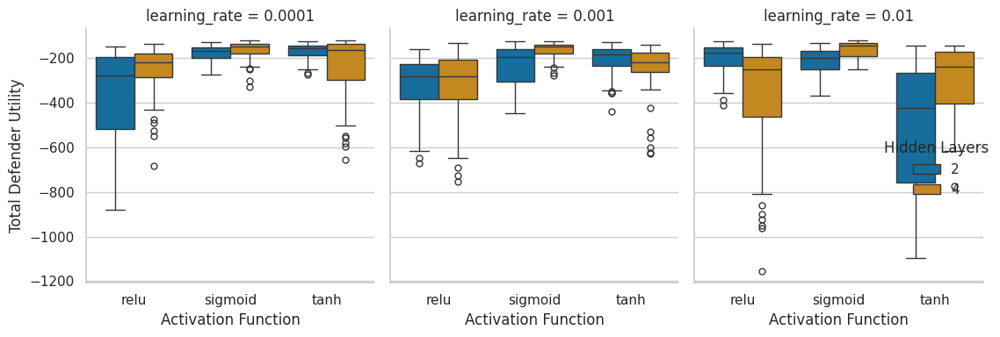

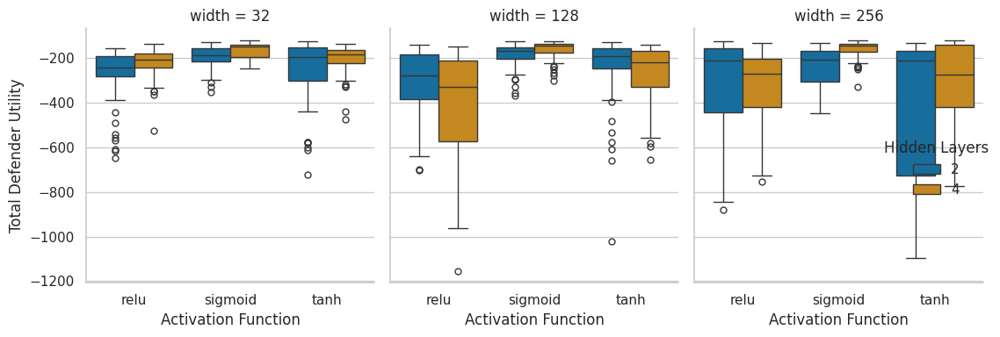

In [ ]:
plot_metric_by_factors(
    episode_df,
    metric="total_utility",
    ylabel="Total Defender Utility",
    facet_col="learning_rate",
)

plot_metric_by_factors(
    episode_df,
    metric="total_utility",
    ylabel="Total Defender Utility",
    facet_col="width",
)



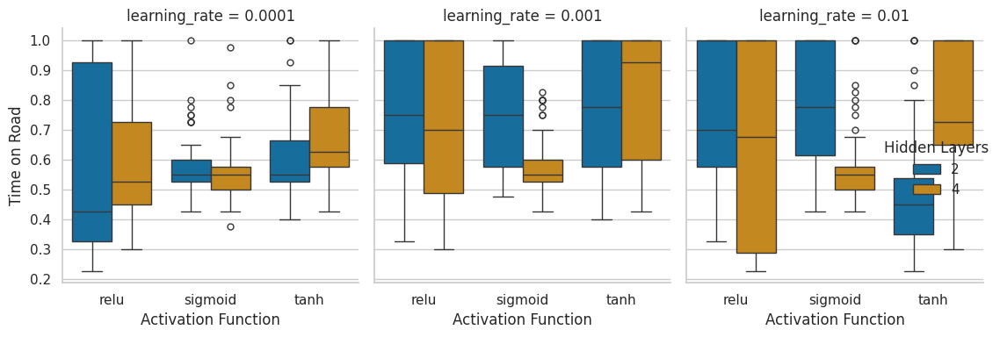

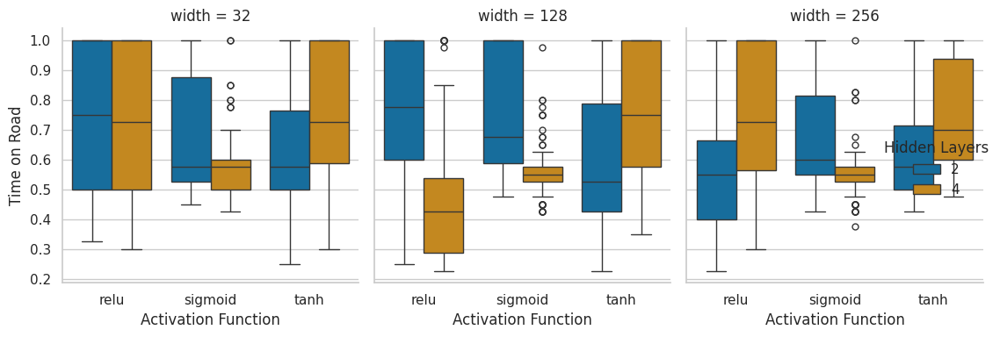

In [ ]:
plot_metric_by_factors(
    episode_df,
    metric="time_on_road",
    ylabel="Time on Road",
    facet_col="learning_rate",
)

plot_metric_by_factors(
    episode_df,
    metric="time_on_road",
    ylabel="Time on Road",
    facet_col="width",
)

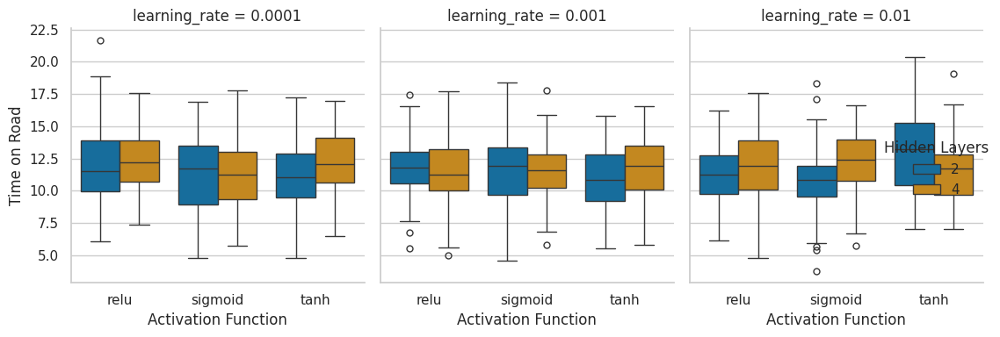

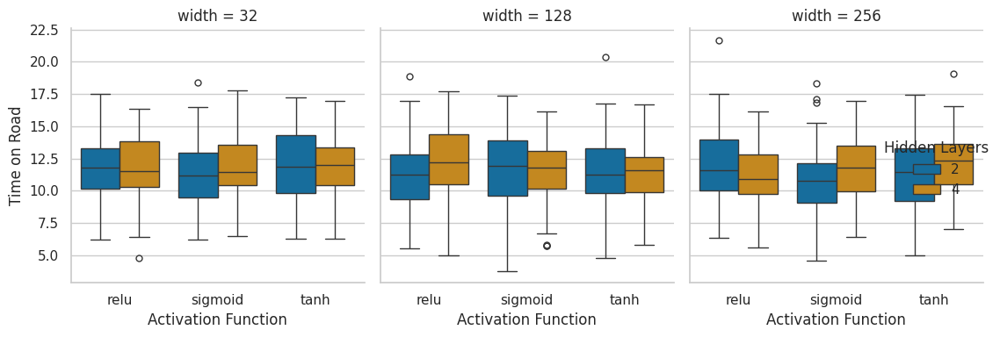

In [ ]:
plot_metric_by_factors(
    episode_df,
    metric="mean_car_distance",
    ylabel="Time on Road",
    facet_col="learning_rate",
)

plot_metric_by_factors(
    episode_df,
    metric="mean_car_distance",
    ylabel="Time on Road",
    facet_col="width",
)

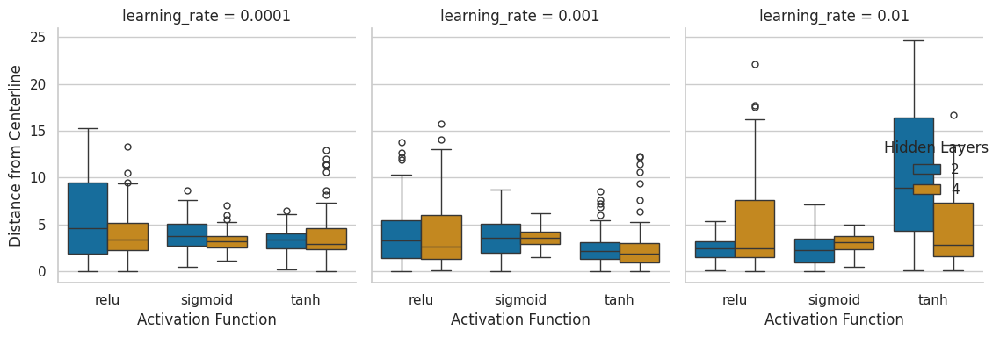

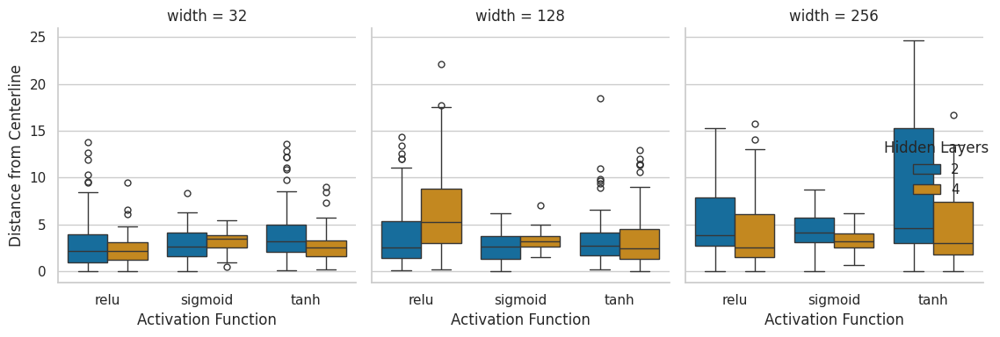

In [ ]:
plot_metric_by_factors(
    episode_df,
    metric="dist_from_left_centerline",
    ylabel="Distance from Centerline",
    facet_col="learning_rate",
)

plot_metric_by_factors(
    episode_df,
    metric="dist_from_left_centerline",
    ylabel="Distance from Centerline",
    facet_col="width",
)

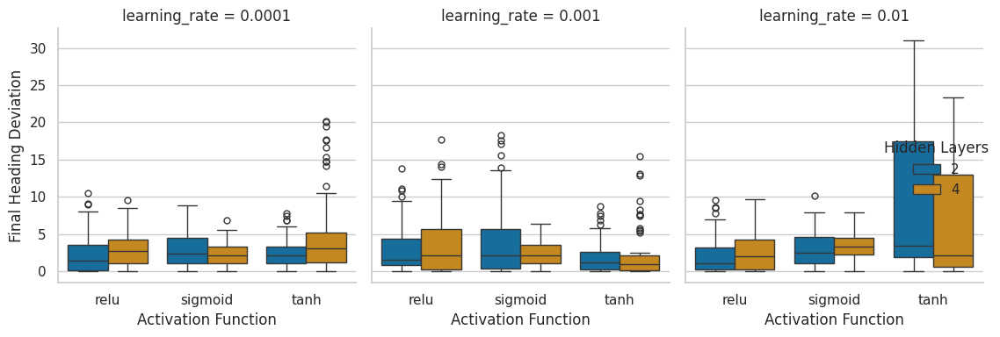

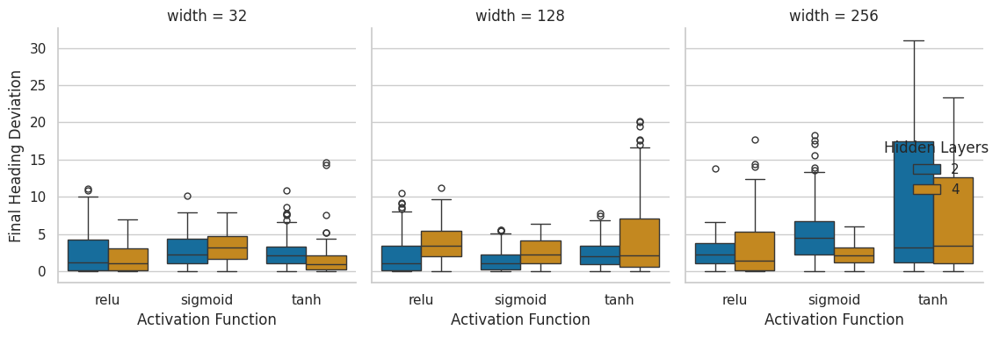

In [ ]:
plot_metric_by_factors(
    episode_df,
    metric="heading_deviation_final",
    ylabel="Final Heading Deviation",
    facet_col="learning_rate",
)

plot_metric_by_factors(
    episode_df,
    metric="heading_deviation_final",
    ylabel="Final Heading Deviation",
    facet_col="width",
)

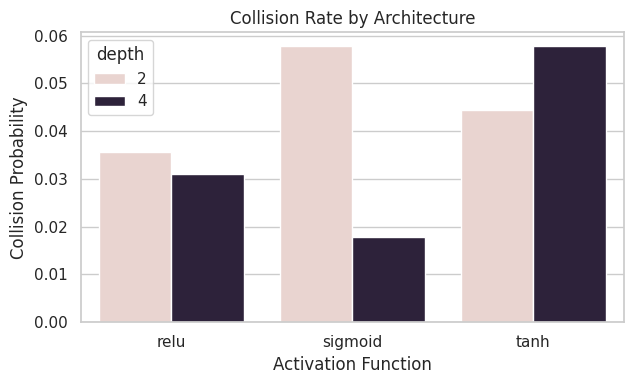

In [ ]:
collision_rate = (
    episode_df.groupby(["activation", "depth"])["collision_occurred"]
      .mean()
      .reset_index()
)

plt.figure(figsize=(6.5, 4))

sns.barplot(
    data=collision_rate,
    x="activation",
    y="collision_occurred",
    hue="depth",
)

plt.ylabel("Collision Probability")
plt.xlabel("Activation Function")
plt.title("Collision Rate by Architecture")
plt.tight_layout()
plt.show()


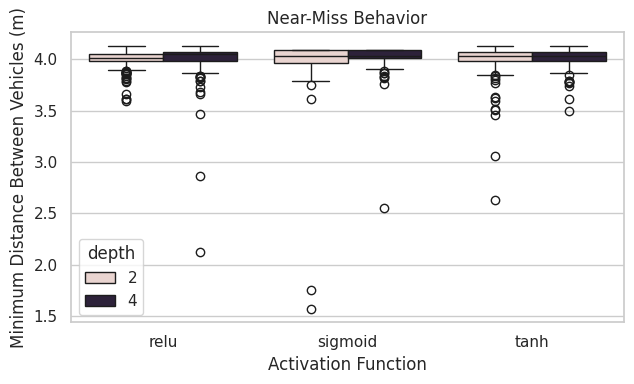

In [ ]:
plt.figure(figsize=(6.5, 4))

sns.boxplot(
    data=episode_df,
    x="activation",
    y="min_car_distance",
    hue="depth",
    showfliers=True,
)

plt.ylabel("Minimum Distance Between Vehicles (m)")
plt.xlabel("Activation Function")
plt.title("Near-Miss Behavior")
plt.tight_layout()
plt.show()


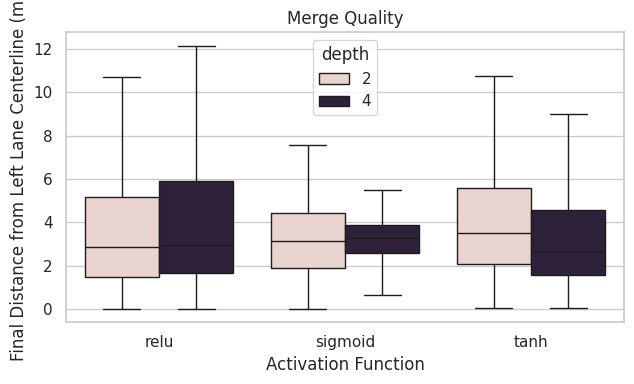

In [ ]:
plt.figure(figsize=(6.5, 4))

sns.boxplot(
    data=episode_df,
    x="activation",
    y="dist_from_left_centerline",
    hue="depth",
    showfliers=False,
)

plt.ylabel("Final Distance from Left Lane Centerline (m)")
plt.xlabel("Activation Function")
plt.title("Merge Quality")
plt.tight_layout()
plt.show()


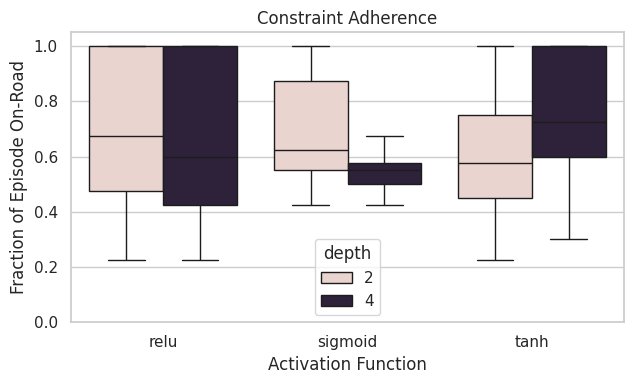

In [ ]:
plt.figure(figsize=(6.5, 4))

sns.boxplot(
    data=episode_df,
    x="activation",
    y="time_on_road",
    hue="depth",
    showfliers=False
)

plt.ylabel("Fraction of Episode On-Road")
plt.xlabel("Activation Function")
plt.title("Constraint Adherence")
plt.ylim(0, 1.05)
plt.tight_layout()
plt.show()


In [ ]:
# df_sig4 = df[
#     (df["activation"] == "sigmoid") &
#     (df["depth"] == 4)
# ].copy()

# df_sig4["model"].unique()

# sig4_eps = (
#     episode_df[
#         (episode_df["activation"] == "sigmoid") &
#         (episode_df["depth"] == 4)
#     ]
#     .sort_values("total_utility", ascending=False)
# )

# sig4_eps[["model", "total_utility", "time_on_road"]]
# models_to_plot = sig4_eps["model"].iloc[[0, len(sig4_eps)//2]].tolist()





def plot_merge_trajectory(df, model_name, instance):
    """
    Plot a single (model, instance) merge trajectory.
    This prevents mixing timesteps across episodes.
    """
    sub = (
        df[(df["model"] == model_name) & (df["instance"] == instance)]
        .sort_values("t")
    )

    if sub.empty:
        raise ValueError(f"No data for model={model_name}, instance={instance}")

    y_vals = sub["def_y"].values
    rb = np.array([right_bound(y) for y in y_vals])

    plt.figure(figsize=(6, 8))

    # ---- Road geometry ----
    plt.fill_betweenx(
        y_vals,
        L1,
        rb,
        color="lightgray",
        alpha=0.5,
        label="Drivable region"
    )

    # ---- Defender trajectory ----
    plt.plot(
        sub["def_x"],
        sub["def_y"],
        color="blue",
        lw=2,
        label="Defender"
    )

    # ---- Off-road points ----
    off = ~sub["on_road"].values
    plt.scatter(
        sub.loc[off, "def_x"],
        sub.loc[off, "def_y"],
        color="red",
        s=20,
        label="Off-road"
    )

    plt.xlabel("Lateral position x")
    plt.ylabel("Longitudinal position y")
    plt.title(f"Merge trajectory\n{model_name} | {instance}")
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_merge_trajectories_overlay(df, model_name):
    """
    Overlay all merge trajectories for a given model in one figure.
    """
    grouped = df[df["model"] == model_name].groupby("instance")

    if grouped.ngroups == 0:
        raise ValueError(f"No data for model={model_name}")

    plt.figure(figsize=(6, 8))

    for instance, sub in grouped:
        sub = sub.sort_values("t")

        y_vals = sub["def_y"].values
        rb = np.array([right_bound(y) for y in y_vals])

        # Draw road only once (first instance)
        plt.fill_betweenx(
            y_vals,
            L1,
            rb,
            color="lightgray",
            alpha=0.2,
        )

        plt.plot(
            sub["def_x"],
            sub["def_y"],
            lw=1.5,
            alpha=0.7,
            label=instance
        )

        off = ~sub["on_road"].values
        plt.scatter(
            sub.loc[off, "def_x"],
            sub.loc[off, "def_y"],
            s=10,
            alpha=0.7
        )

    plt.xlabel("Lateral position x")
    plt.ylabel("Longitudinal position y")
    plt.title(f"All merge trajectories\n{model_name}")
    plt.tight_layout()
    plt.show()




# for m in models_to_plot:
#     plot_merge_trajectories_overlay(df_sig4, m)


Plotting: act=relu, depth=2, width=32, lr=0.0001


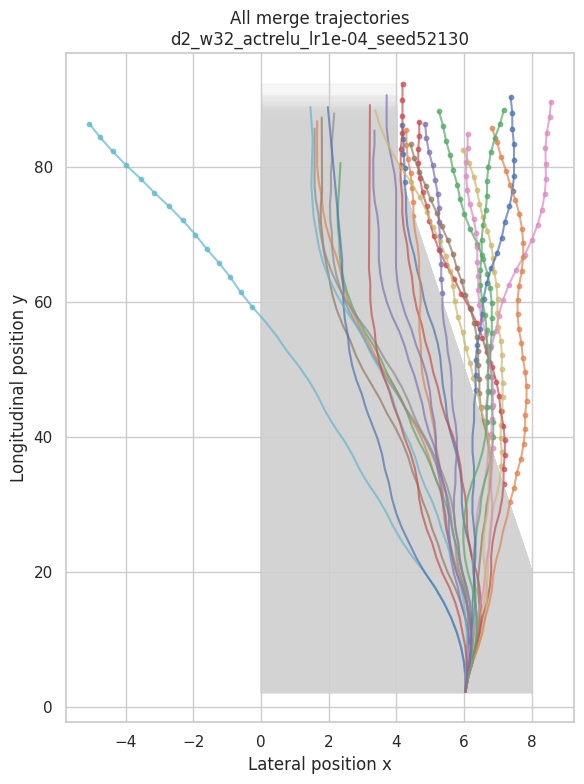

Plotting: act=relu, depth=2, width=32, lr=0.001


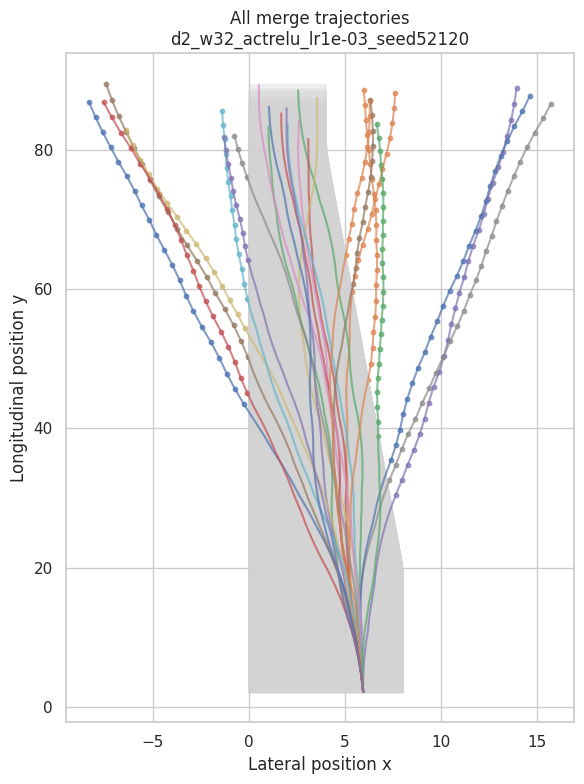

Plotting: act=relu, depth=2, width=32, lr=0.01


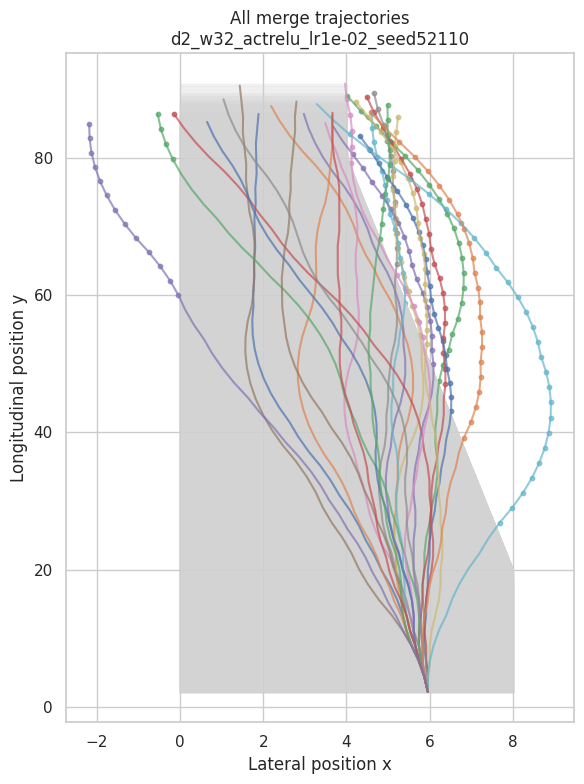

Plotting: act=relu, depth=2, width=128, lr=0.0001


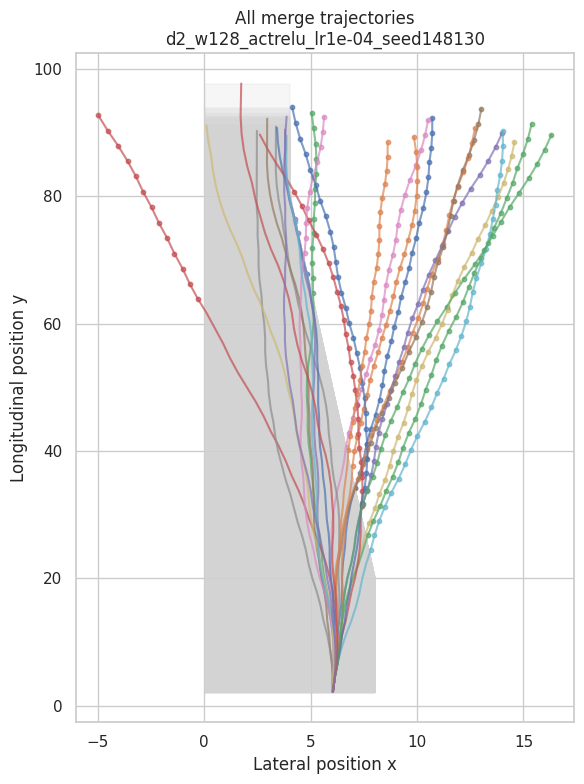

Plotting: act=relu, depth=2, width=128, lr=0.001


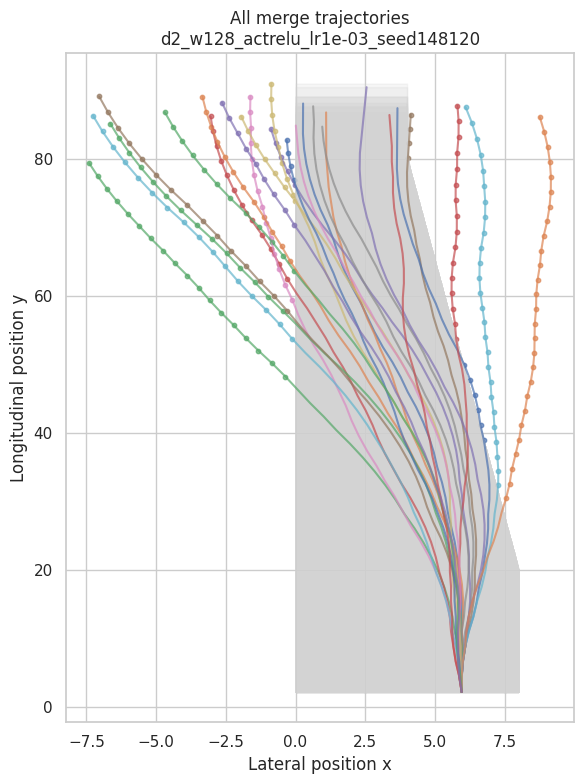

Plotting: act=relu, depth=2, width=128, lr=0.01


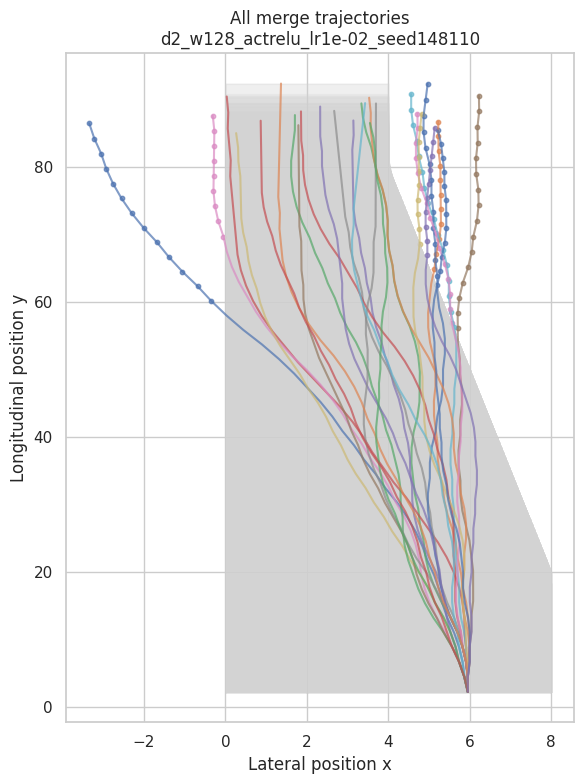

Plotting: act=relu, depth=2, width=256, lr=0.0001


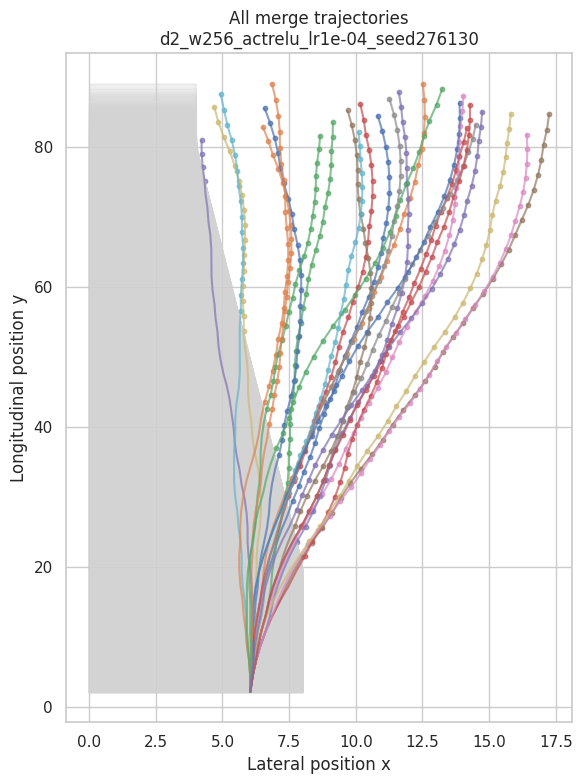

Plotting: act=relu, depth=2, width=256, lr=0.001


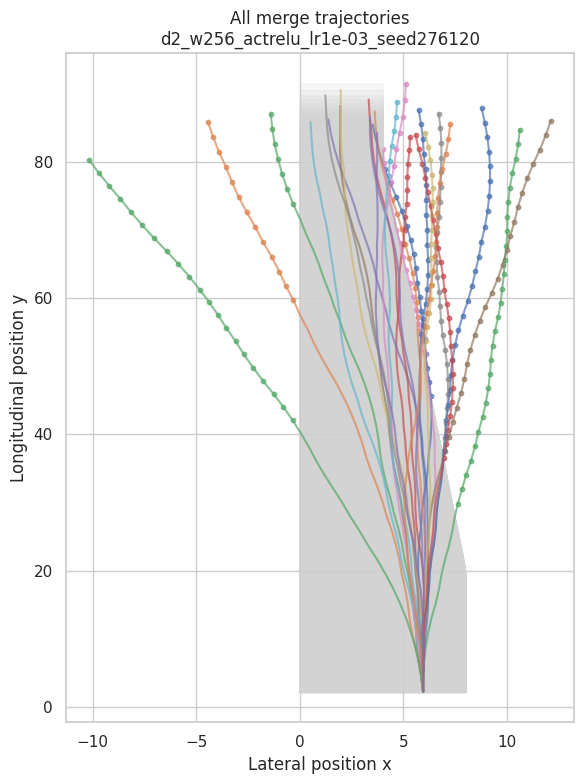

Plotting: act=relu, depth=2, width=256, lr=0.01


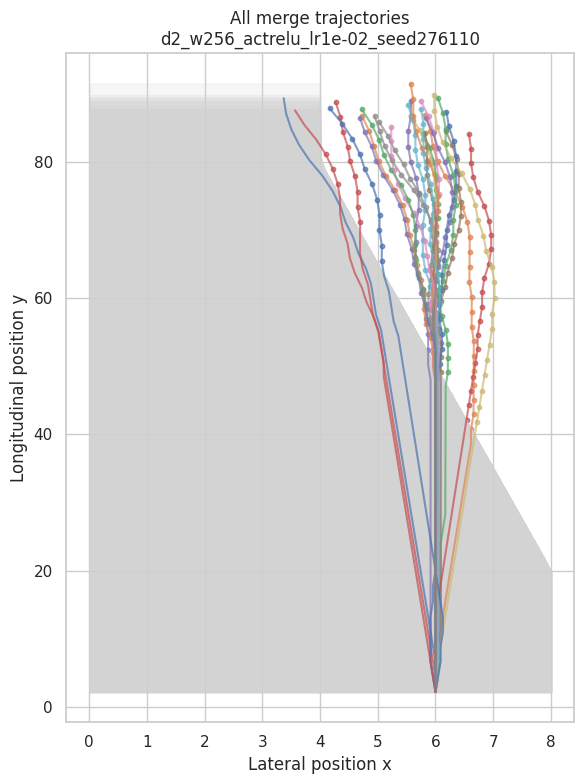

Plotting: act=relu, depth=4, width=32, lr=0.0001


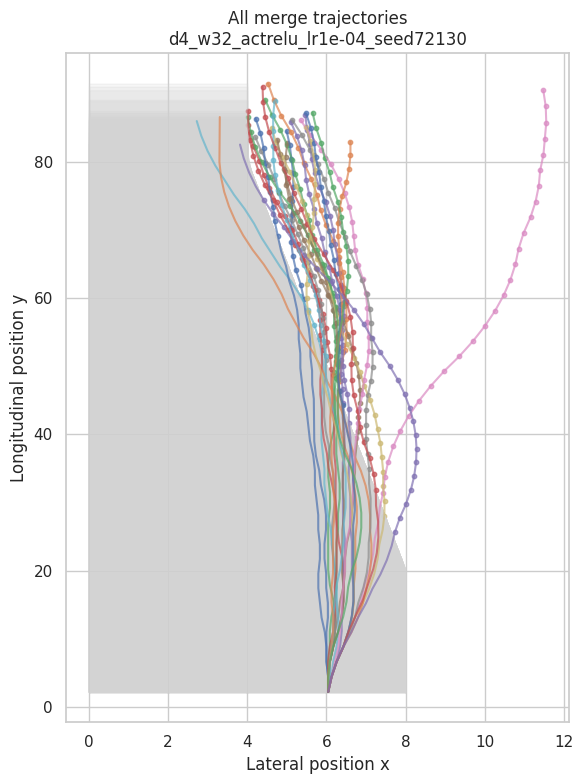

Plotting: act=relu, depth=4, width=32, lr=0.001


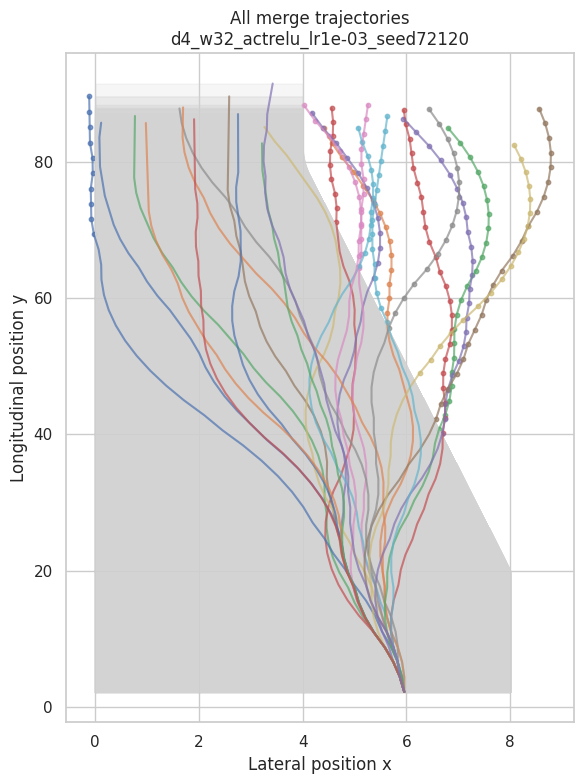

Plotting: act=relu, depth=4, width=32, lr=0.01


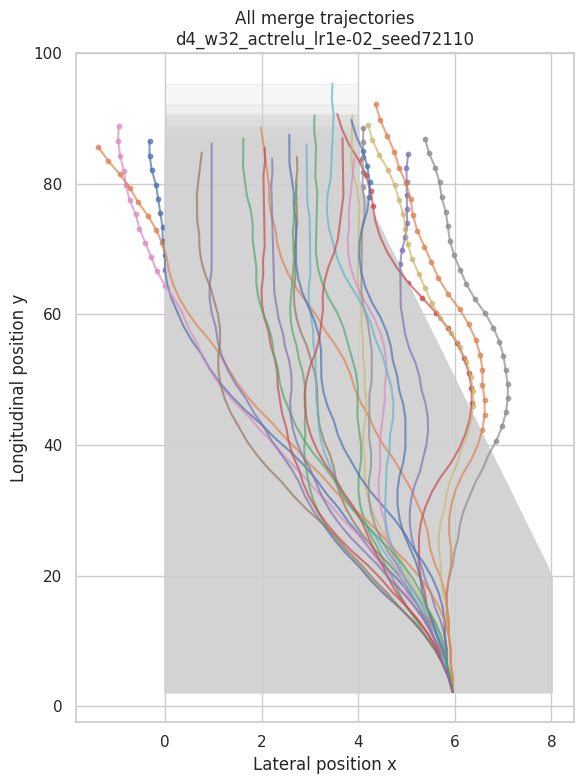

Plotting: act=relu, depth=4, width=128, lr=0.0001


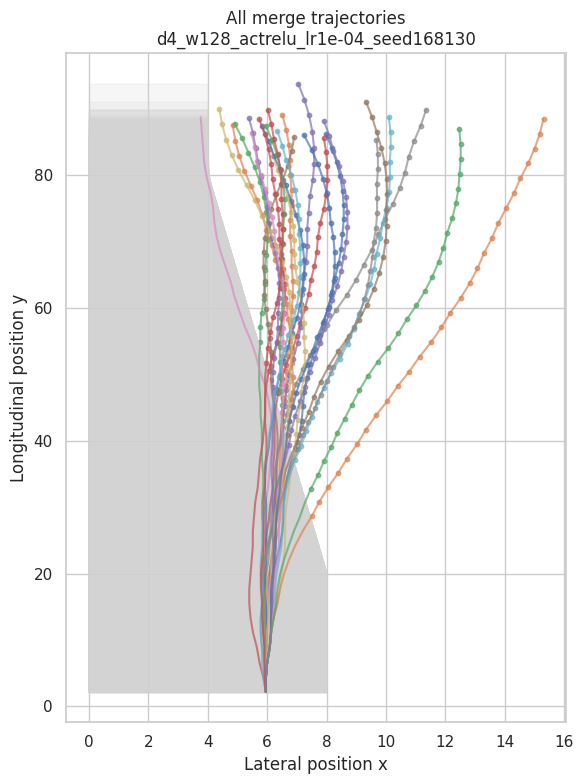

Plotting: act=relu, depth=4, width=128, lr=0.001


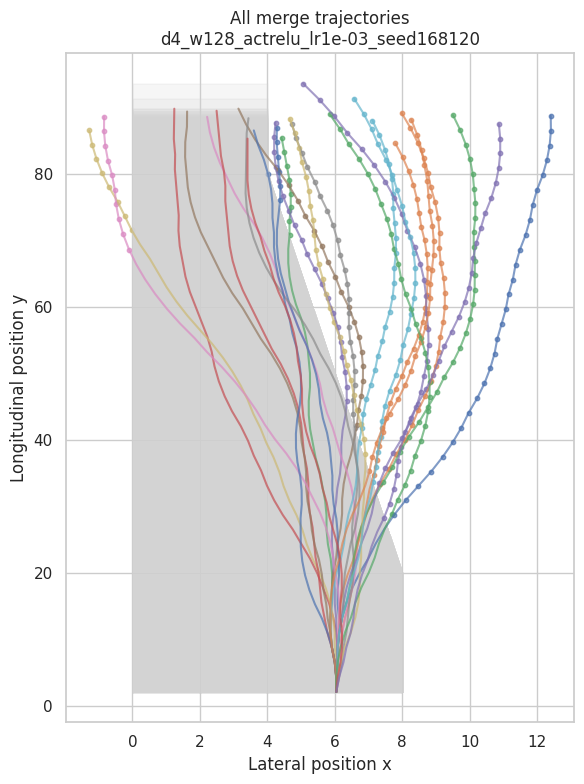

Plotting: act=relu, depth=4, width=128, lr=0.01


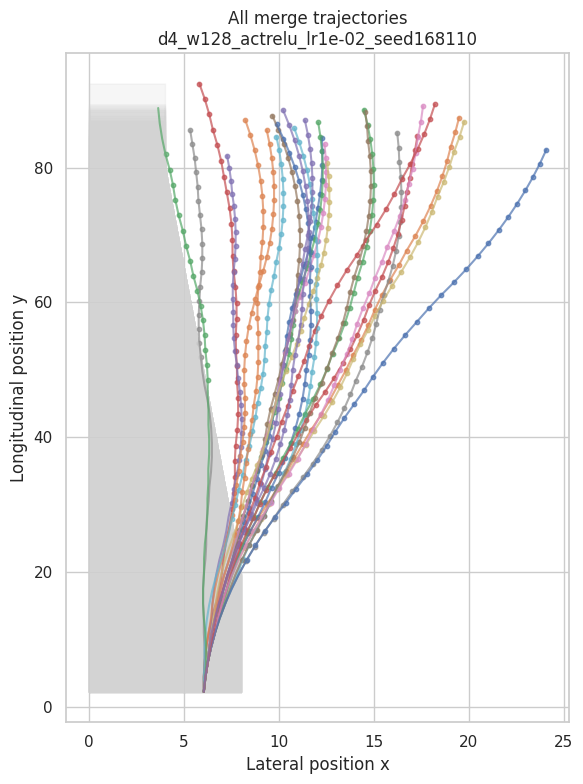

Plotting: act=relu, depth=4, width=256, lr=0.0001


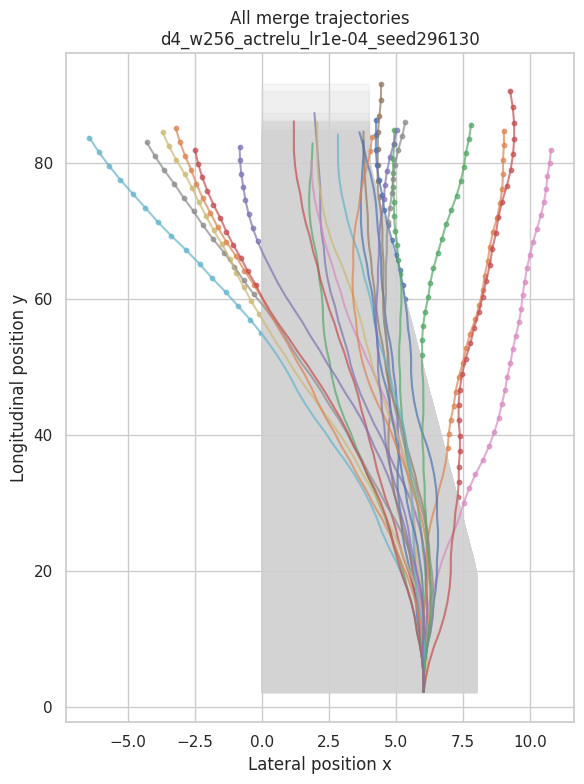

Plotting: act=relu, depth=4, width=256, lr=0.001


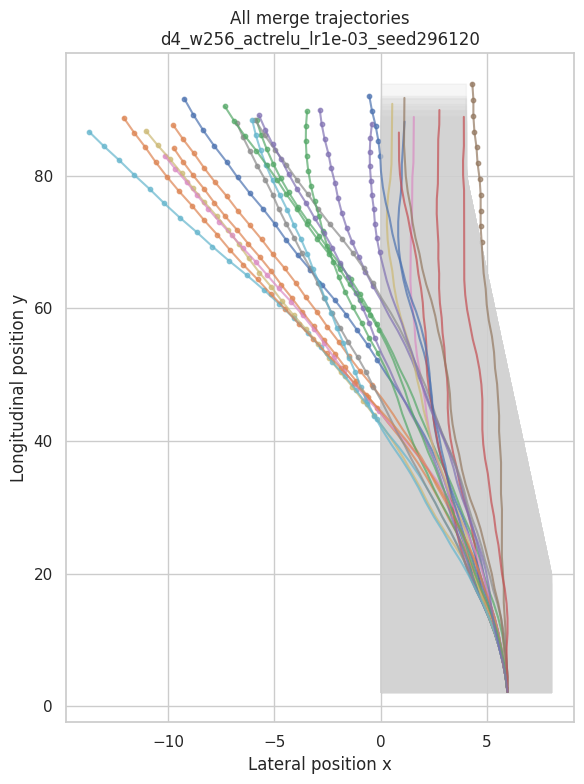

Plotting: act=relu, depth=4, width=256, lr=0.01


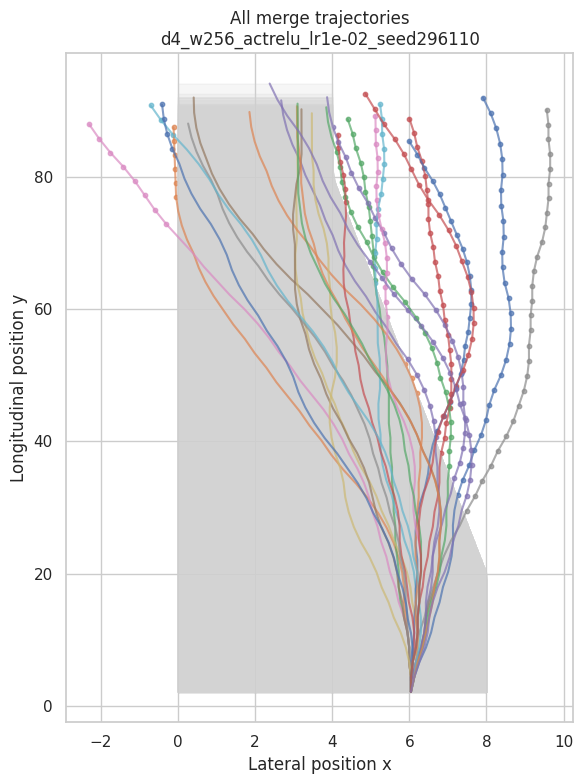

Plotting: act=sigmoid, depth=2, width=32, lr=0.0001


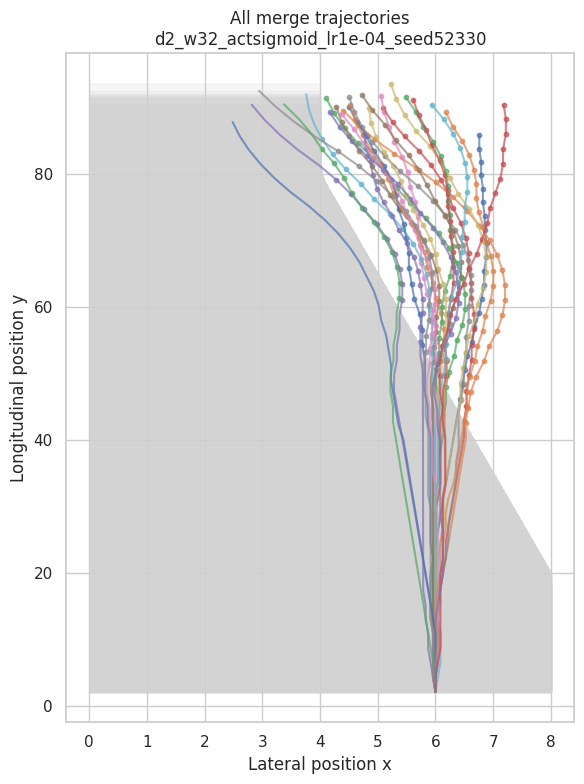

Plotting: act=sigmoid, depth=2, width=32, lr=0.001


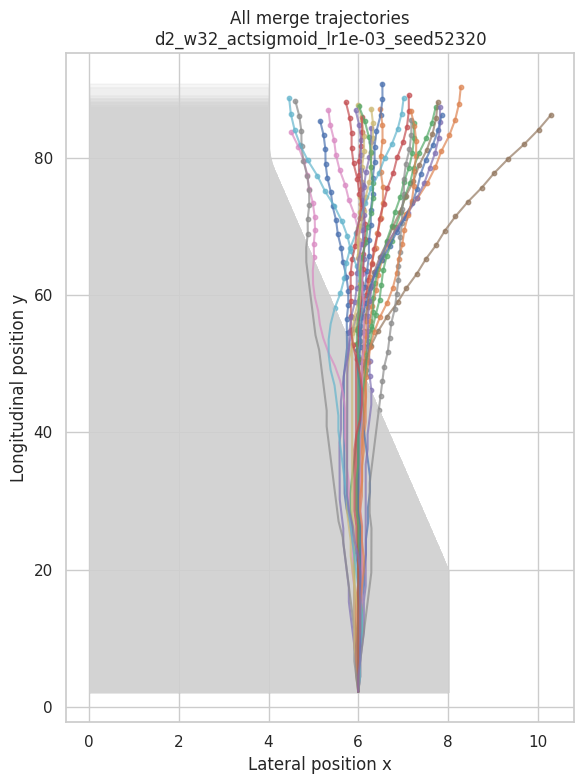

Plotting: act=sigmoid, depth=2, width=32, lr=0.01


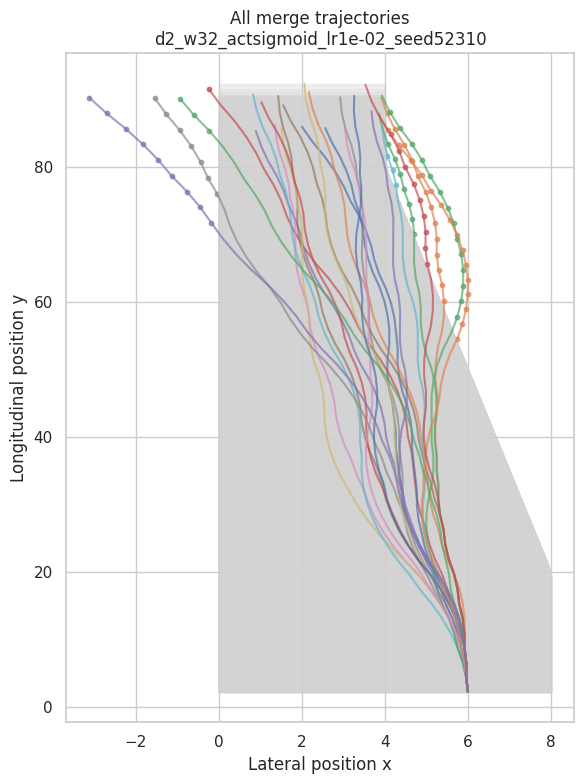

Plotting: act=sigmoid, depth=2, width=128, lr=0.0001


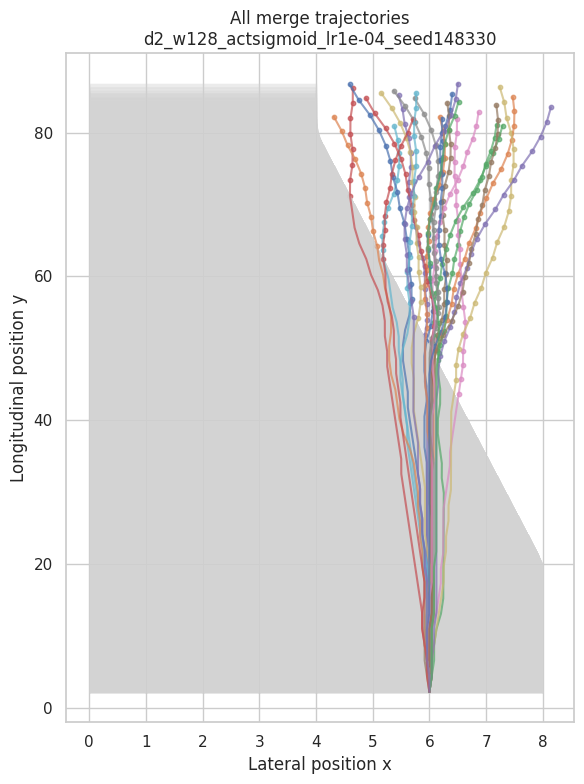

Plotting: act=sigmoid, depth=2, width=128, lr=0.001


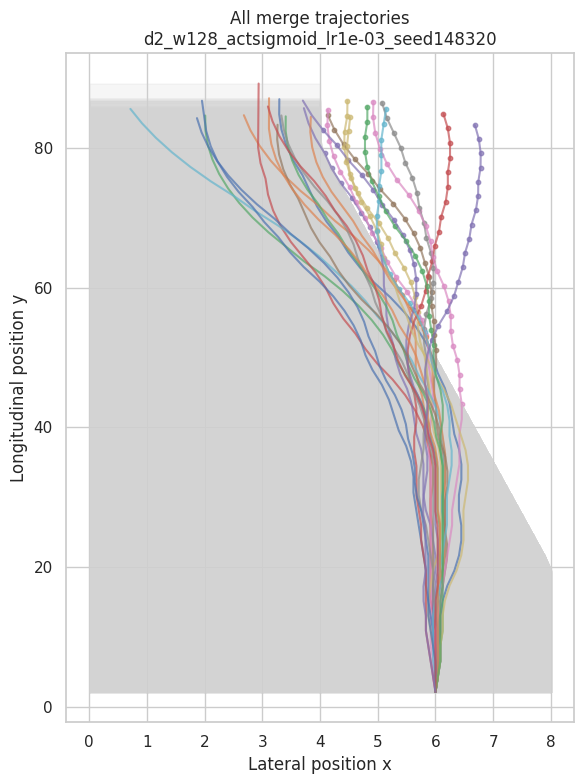

Plotting: act=sigmoid, depth=2, width=128, lr=0.01


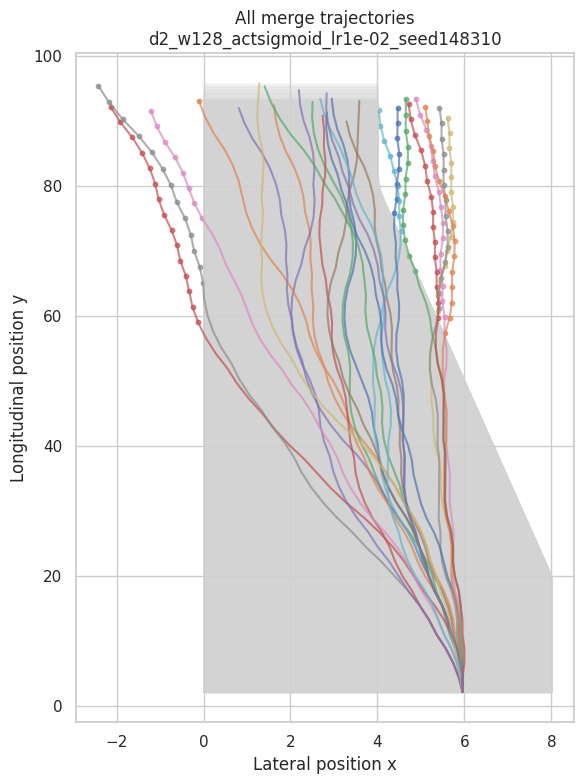

Plotting: act=sigmoid, depth=2, width=256, lr=0.0001


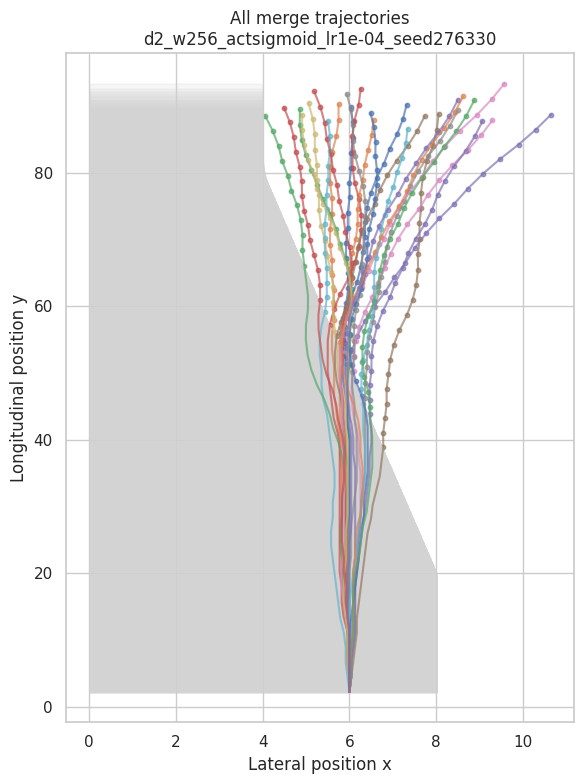

Plotting: act=sigmoid, depth=2, width=256, lr=0.001


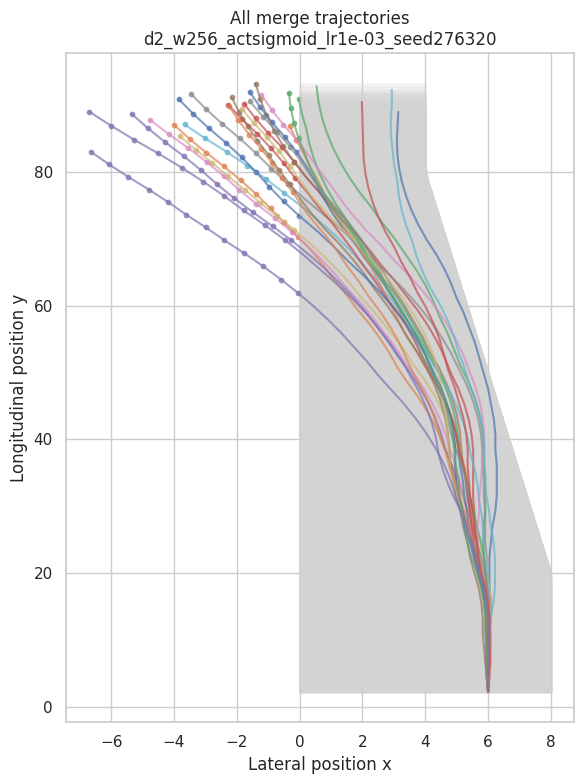

Plotting: act=sigmoid, depth=2, width=256, lr=0.01


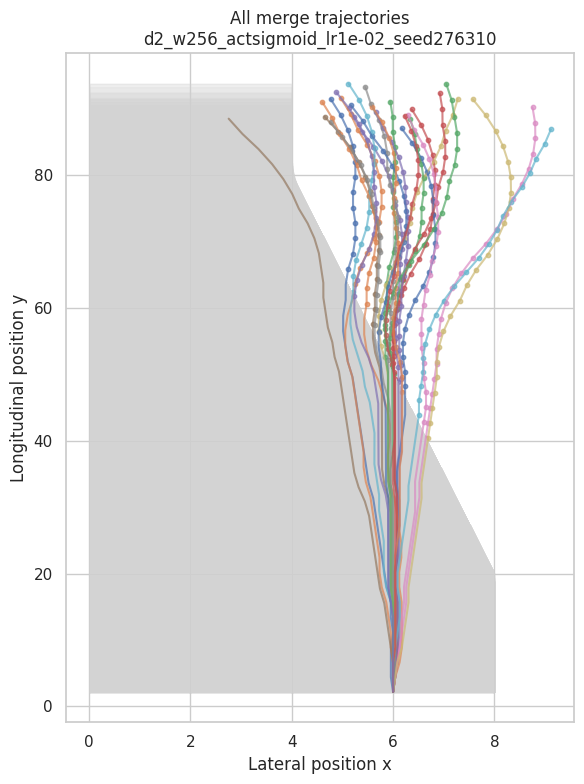

Plotting: act=sigmoid, depth=4, width=32, lr=0.0001


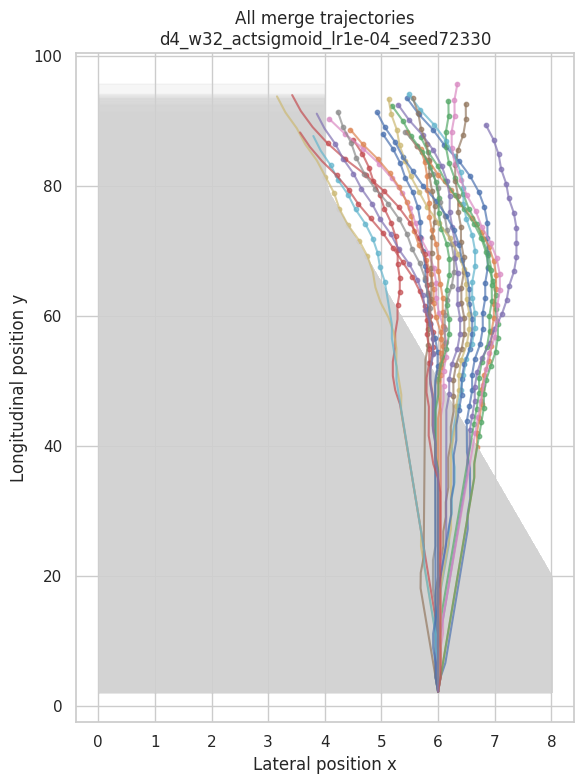

Plotting: act=sigmoid, depth=4, width=32, lr=0.001


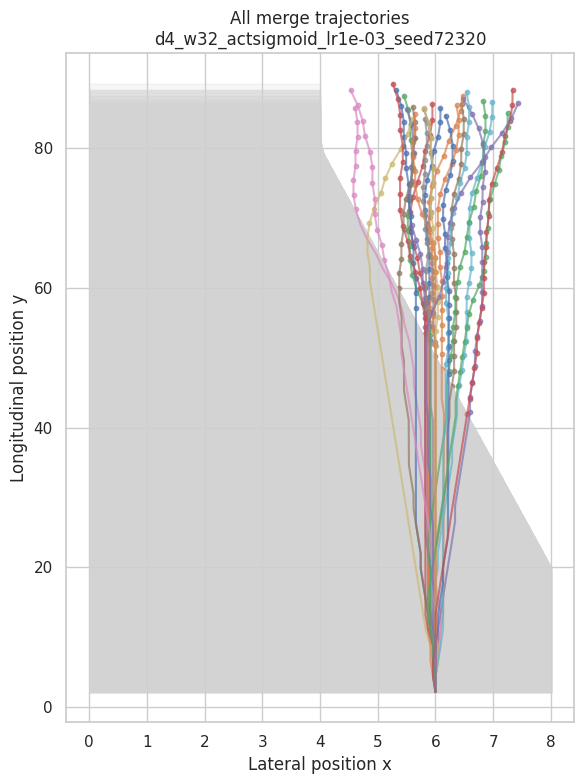

Plotting: act=sigmoid, depth=4, width=32, lr=0.01


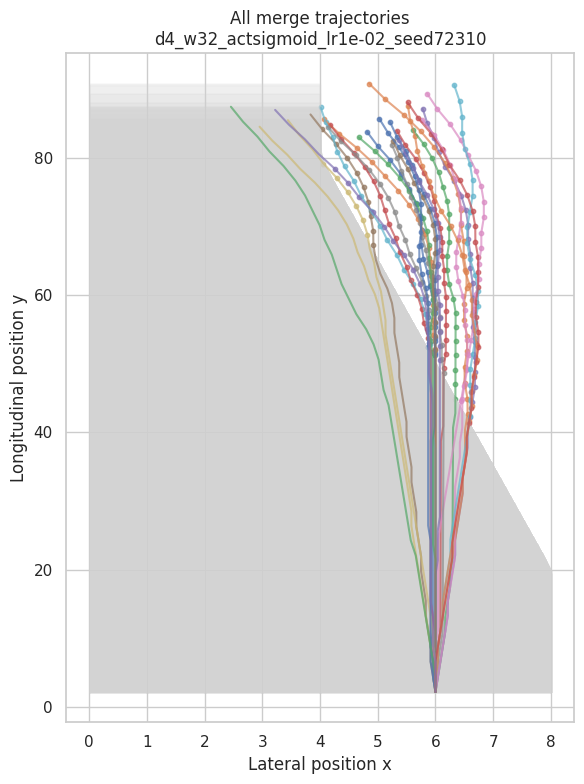

Plotting: act=sigmoid, depth=4, width=128, lr=0.0001


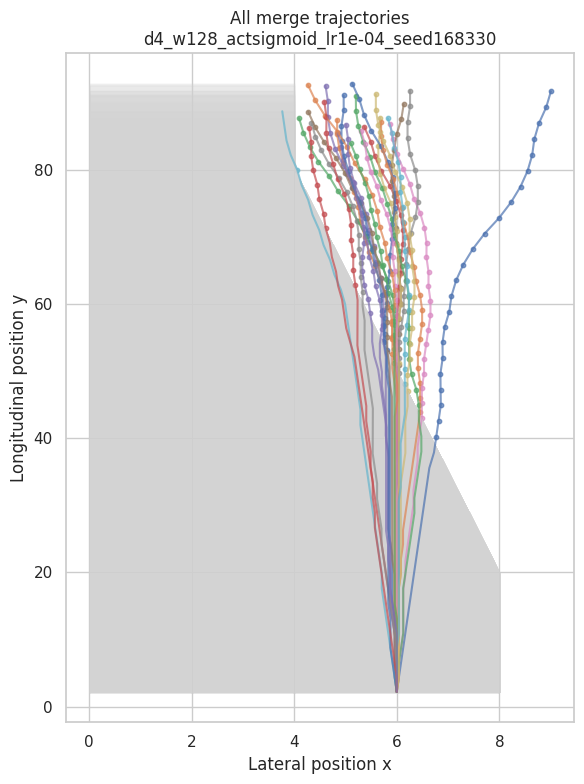

Plotting: act=sigmoid, depth=4, width=128, lr=0.001


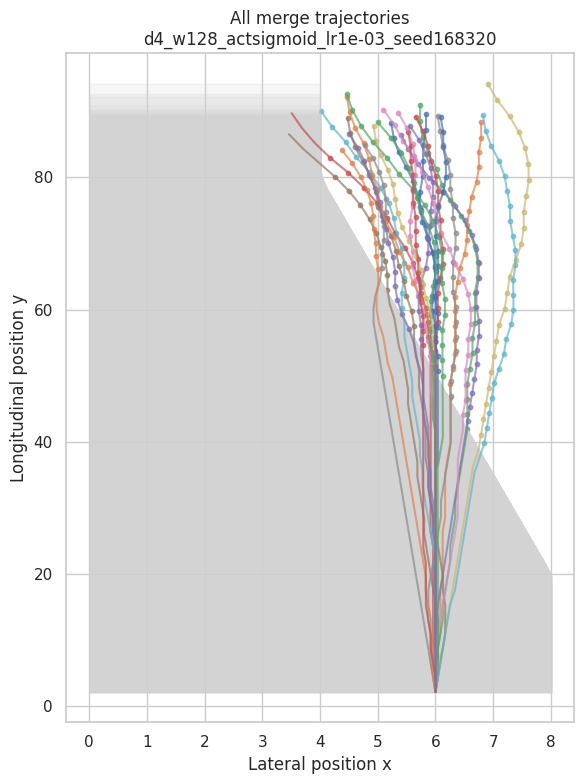

Plotting: act=sigmoid, depth=4, width=128, lr=0.01


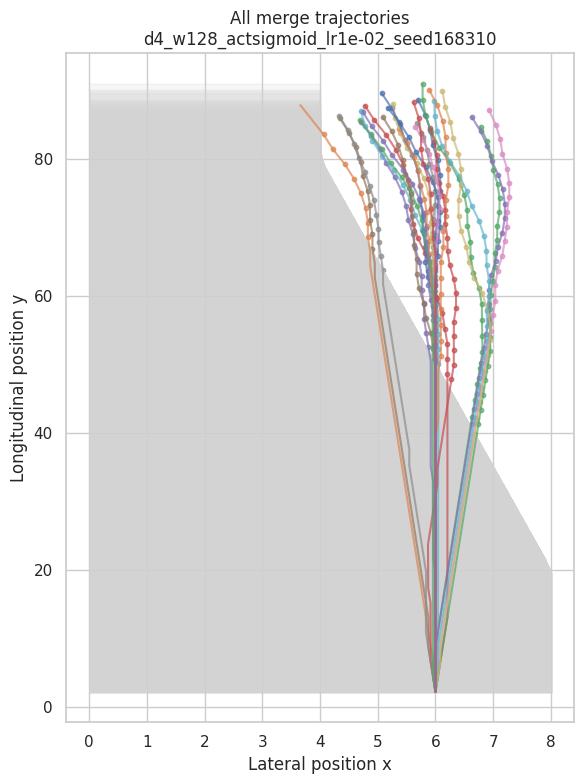

Plotting: act=sigmoid, depth=4, width=256, lr=0.0001


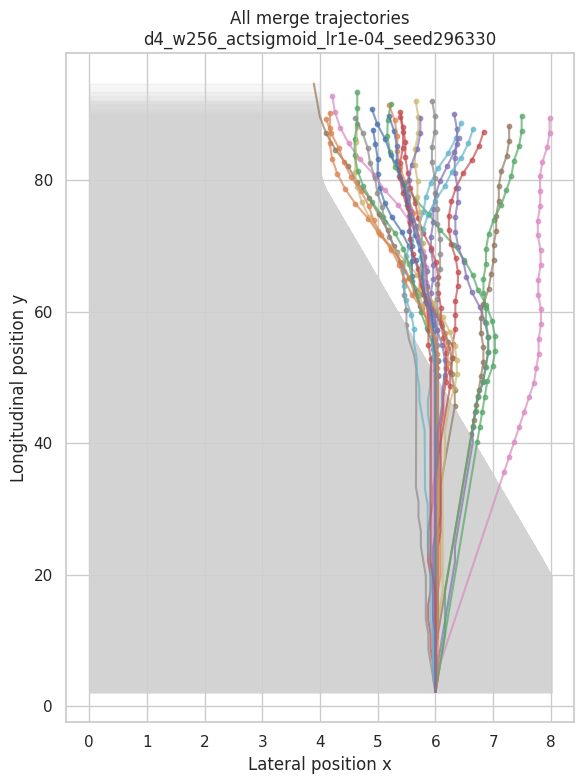

Plotting: act=sigmoid, depth=4, width=256, lr=0.001


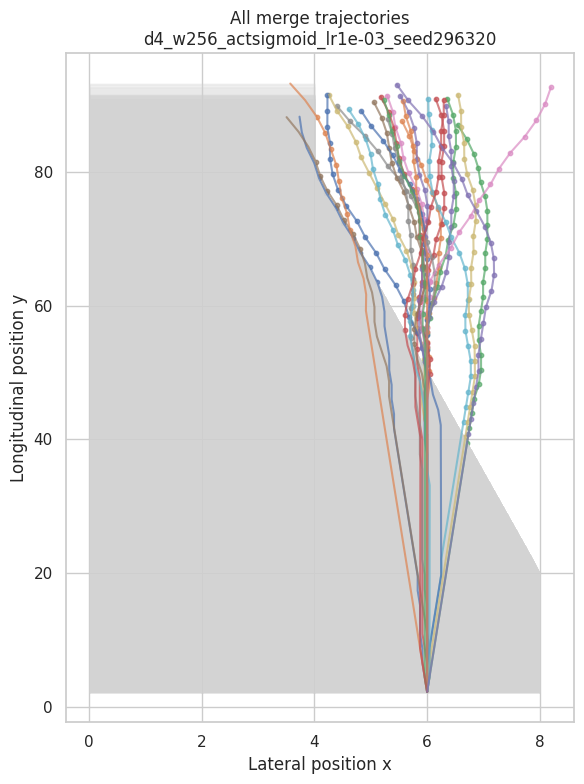

Plotting: act=sigmoid, depth=4, width=256, lr=0.01


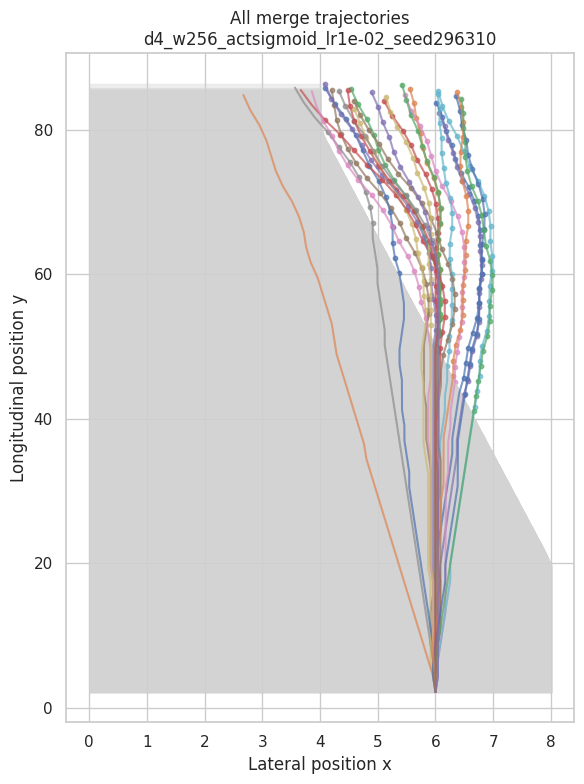

Plotting: act=tanh, depth=2, width=32, lr=0.0001


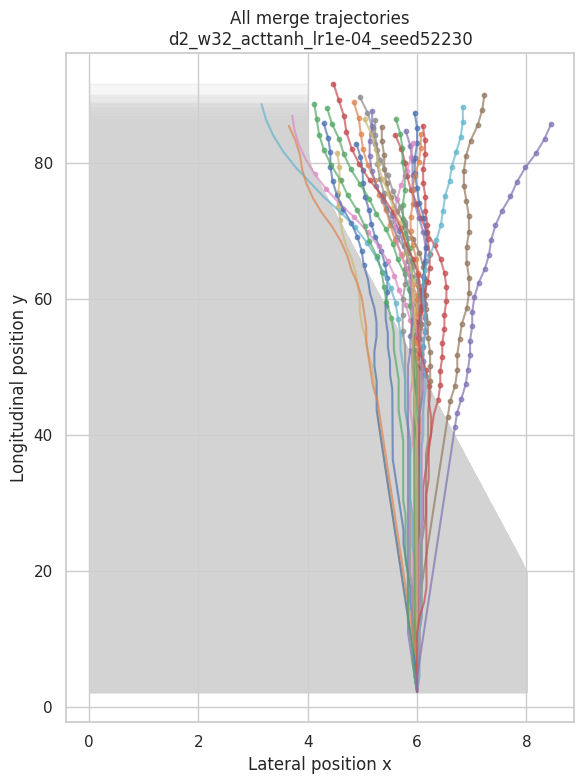

Plotting: act=tanh, depth=2, width=32, lr=0.001


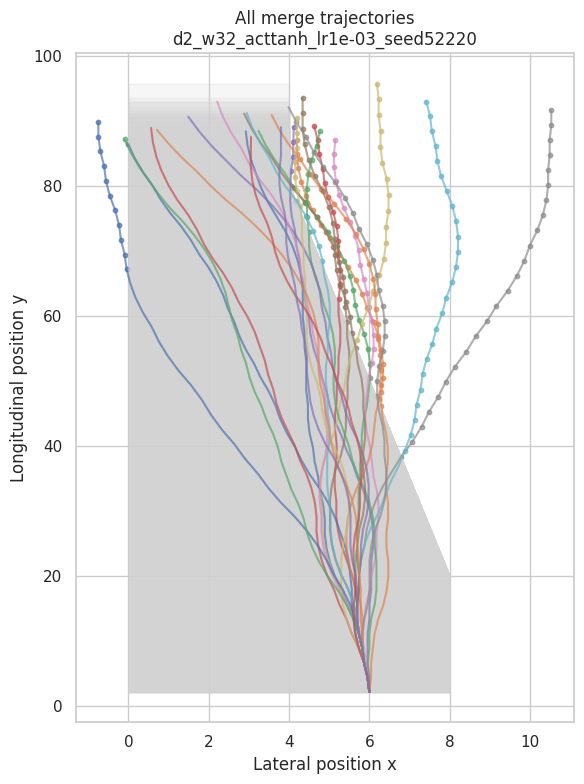

Plotting: act=tanh, depth=2, width=32, lr=0.01


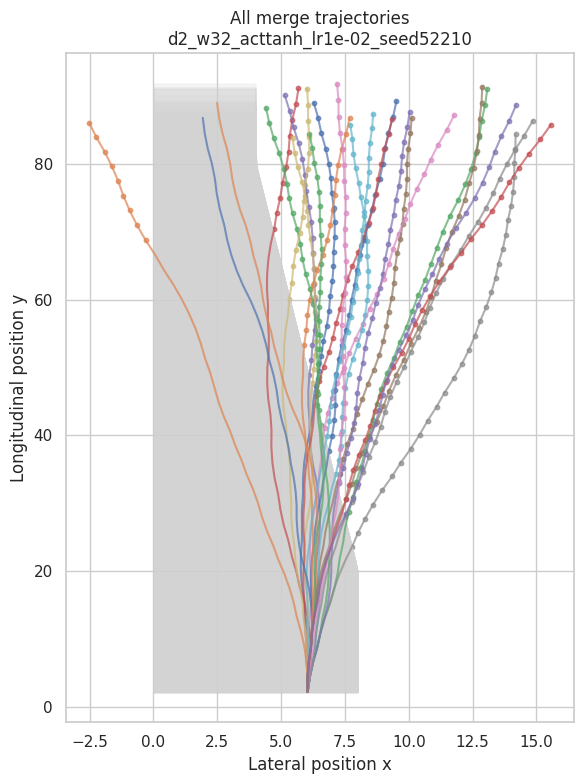

Plotting: act=tanh, depth=2, width=128, lr=0.0001


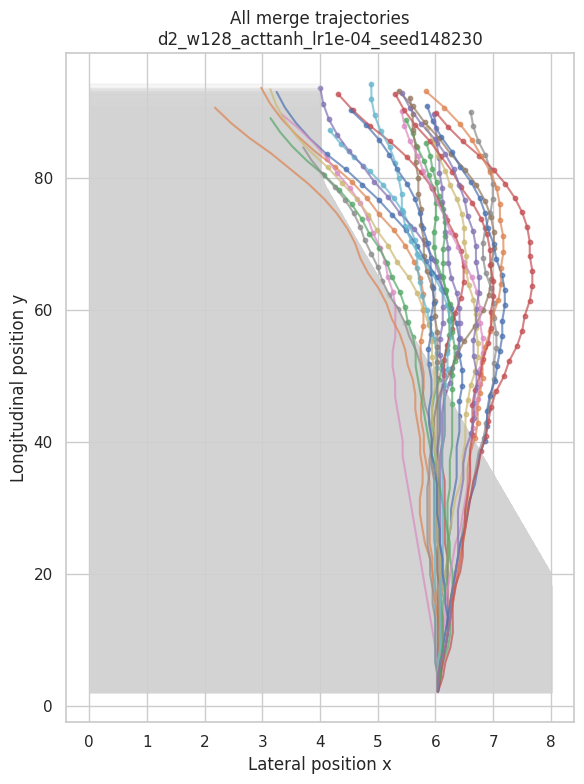

Plotting: act=tanh, depth=2, width=128, lr=0.001


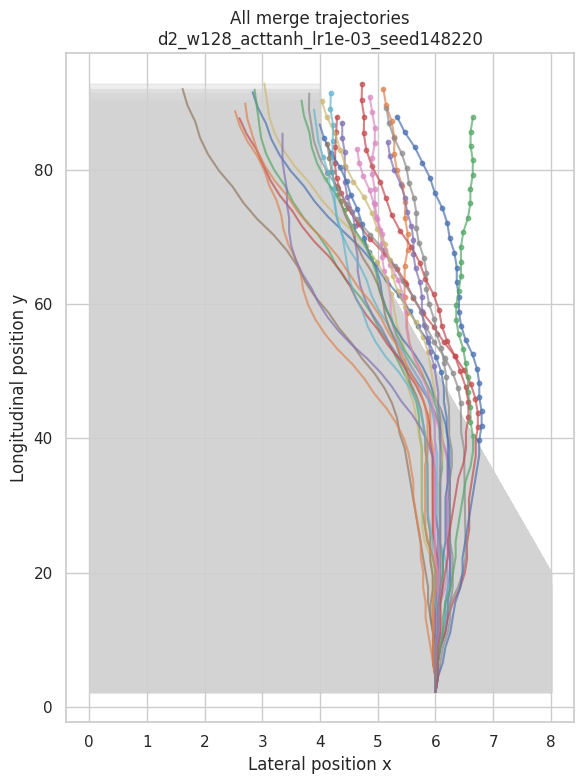

Plotting: act=tanh, depth=2, width=128, lr=0.01


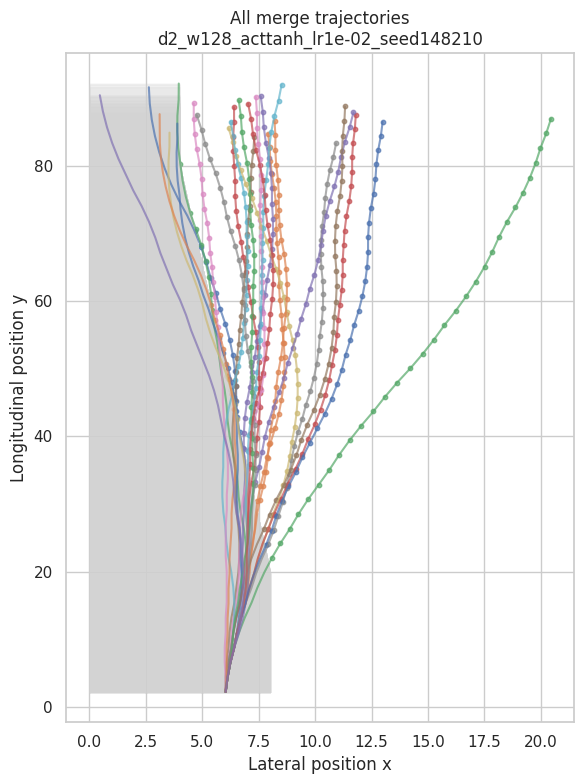

Plotting: act=tanh, depth=2, width=256, lr=0.0001


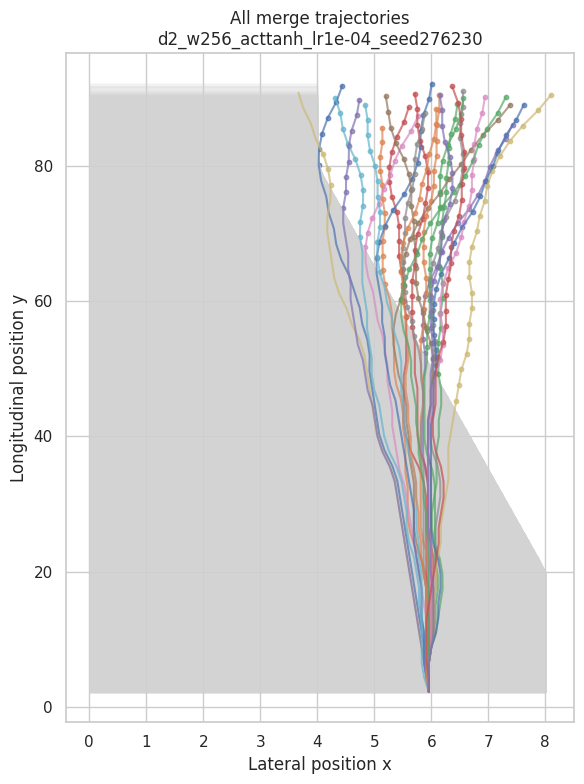

Plotting: act=tanh, depth=2, width=256, lr=0.001


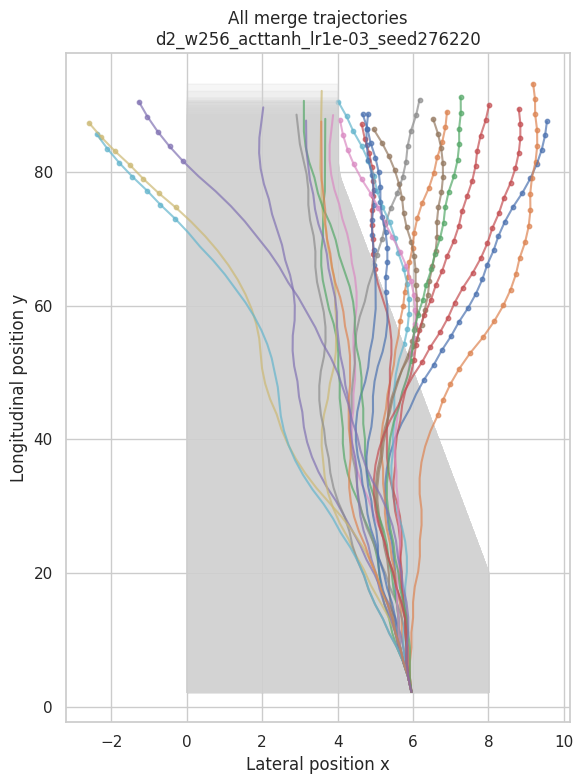

Plotting: act=tanh, depth=2, width=256, lr=0.01


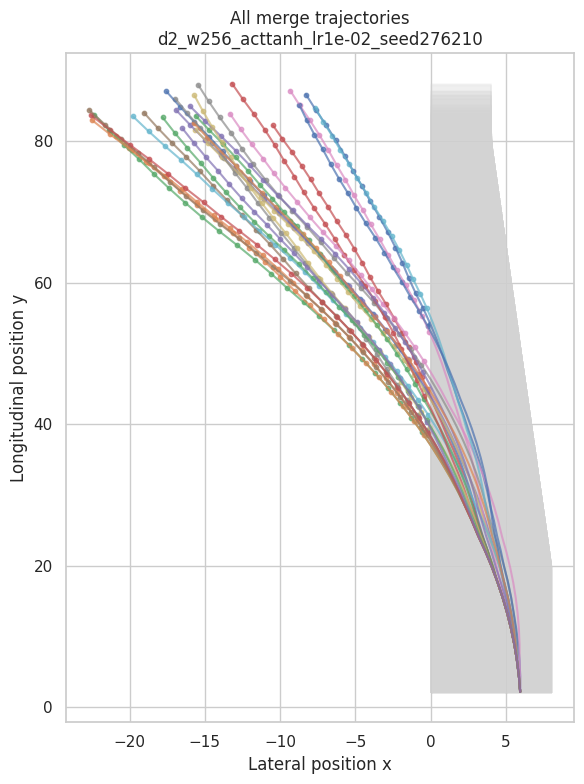

Plotting: act=tanh, depth=4, width=32, lr=0.0001


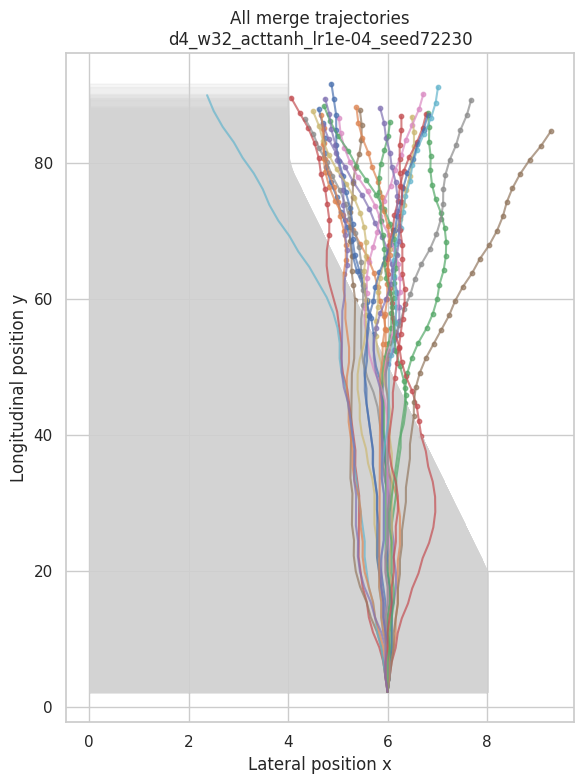

Plotting: act=tanh, depth=4, width=32, lr=0.001


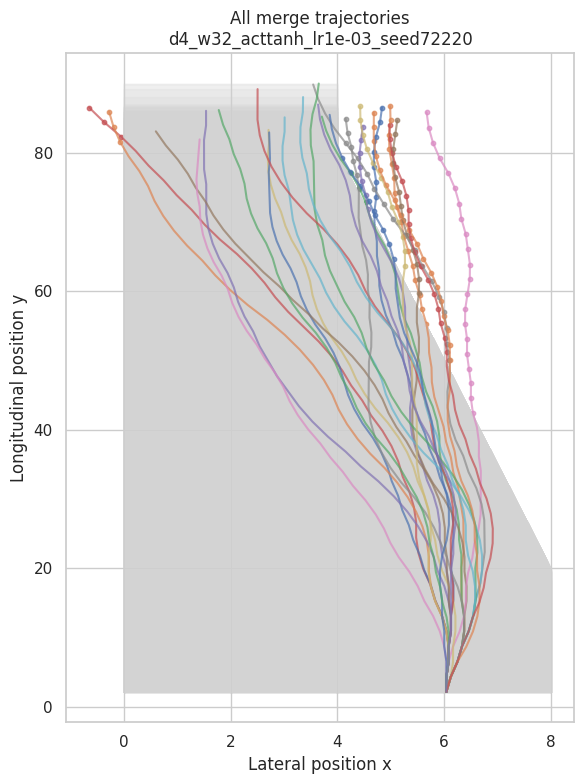

Plotting: act=tanh, depth=4, width=32, lr=0.01


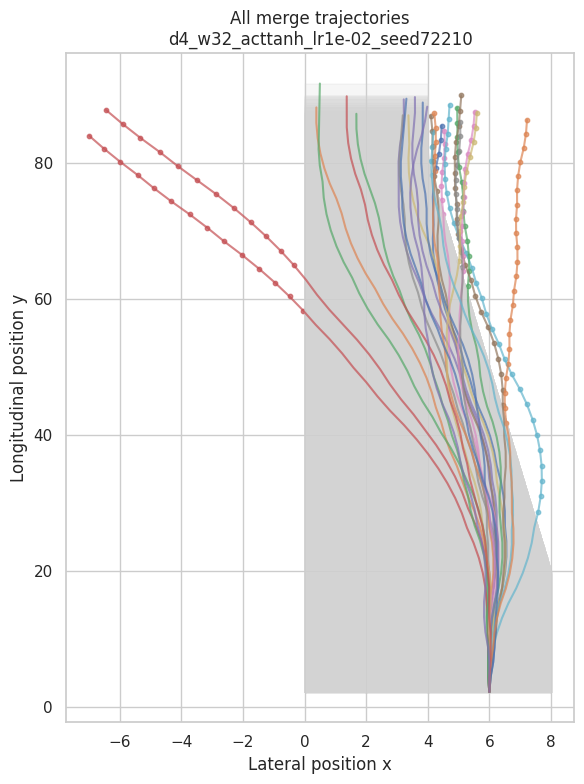

Plotting: act=tanh, depth=4, width=128, lr=0.0001


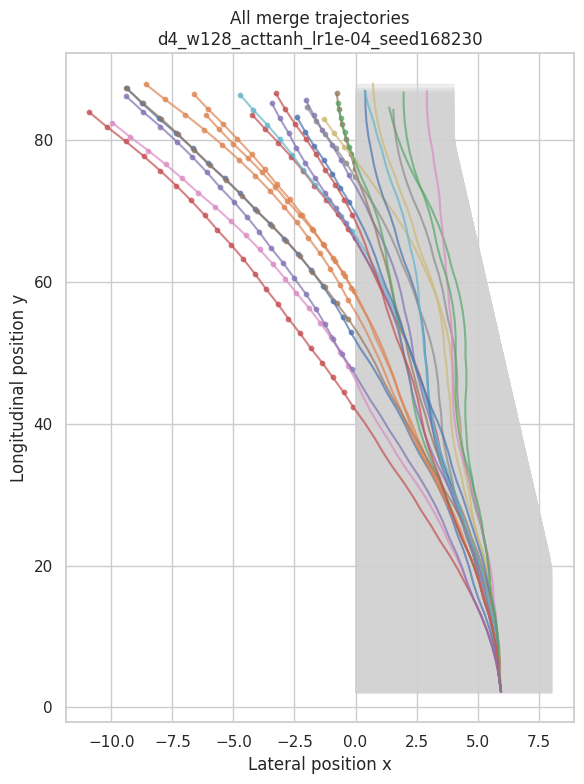

Plotting: act=tanh, depth=4, width=128, lr=0.001


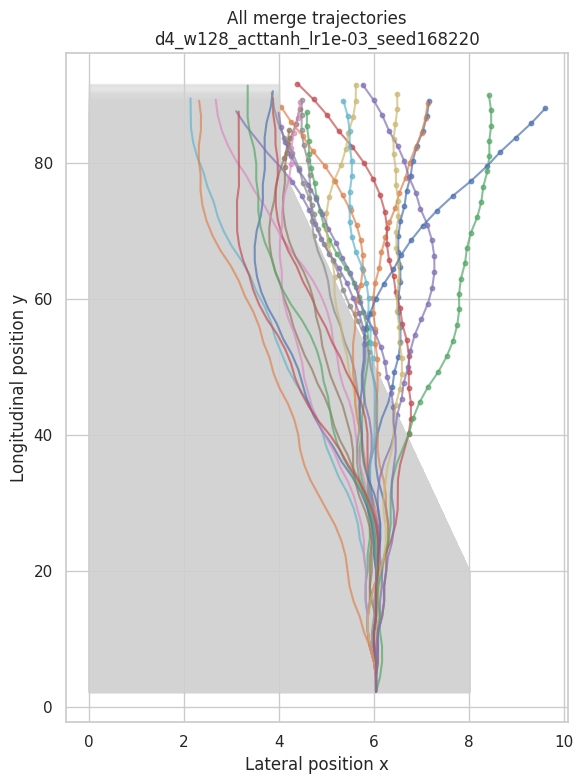

Plotting: act=tanh, depth=4, width=128, lr=0.01


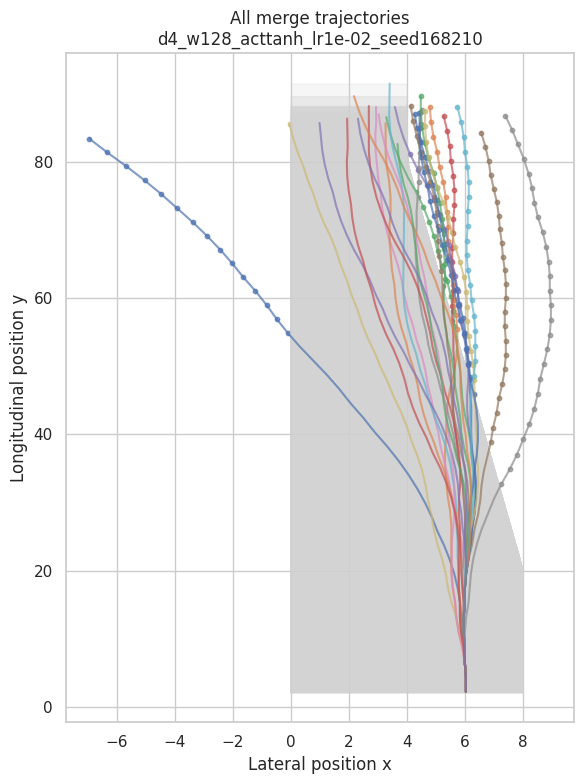

Plotting: act=tanh, depth=4, width=256, lr=0.0001


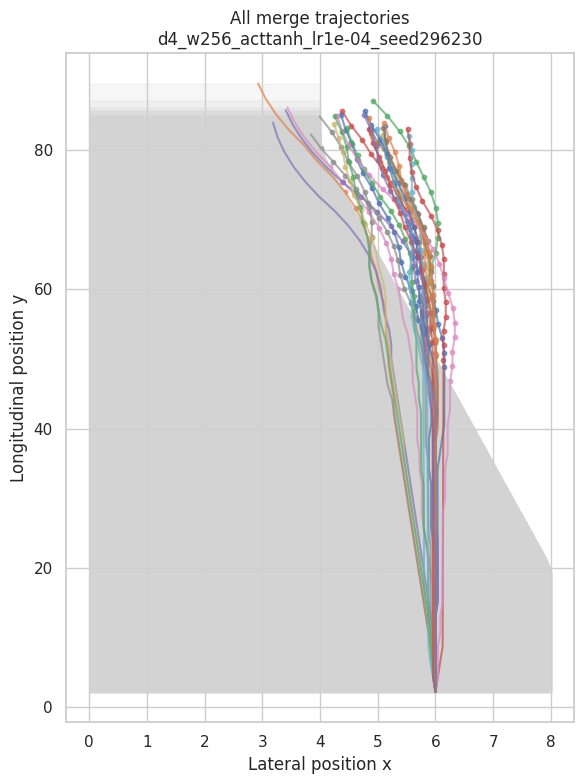

Plotting: act=tanh, depth=4, width=256, lr=0.001


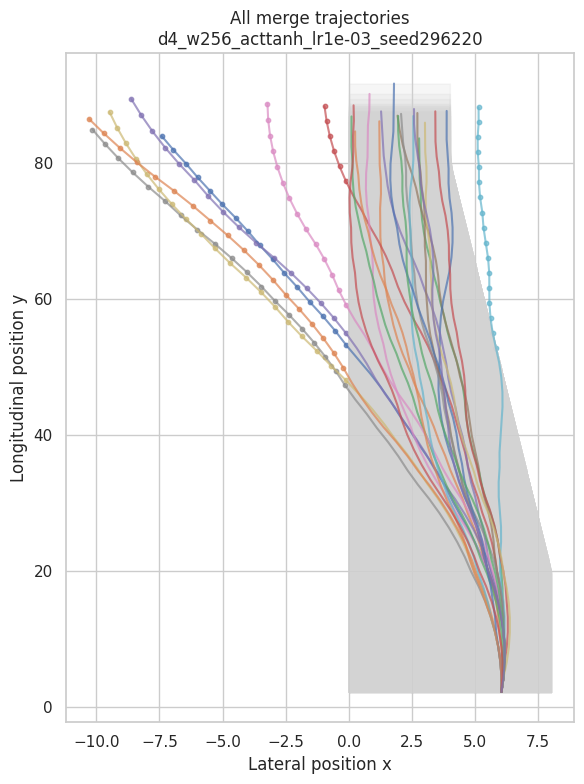

Plotting: act=tanh, depth=4, width=256, lr=0.01


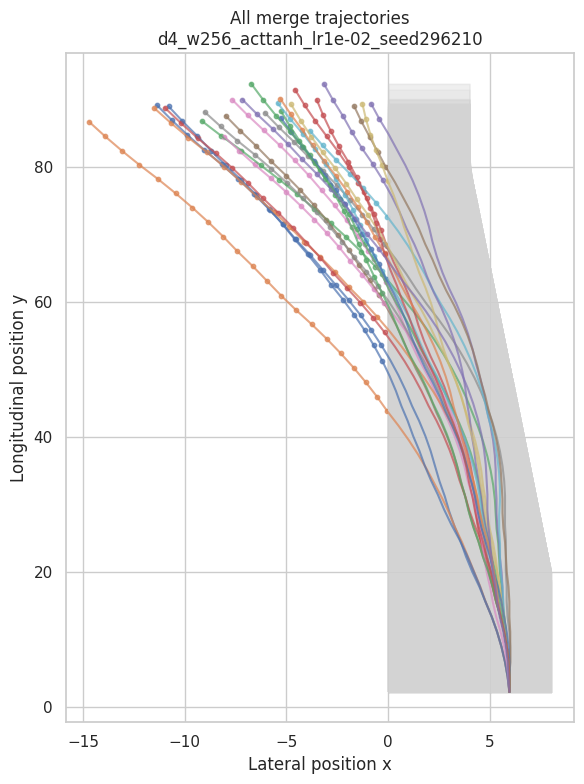

In [ ]:
design_points = (
    episode_df[
        ["model", "depth", "width", "activation", "learning_rate"]
    ]
    .drop_duplicates()
    .sort_values(["activation", "depth", "width", "learning_rate"])
)

for _, row in design_points.iterrows():
    model_name = row["model"]

    print(
        f"Plotting: act={row['activation']}, "
        f"depth={row['depth']}, "
        f"width={row['width']}, "
        f"lr={row['learning_rate']}"
    )

    plot_merge_trajectories_overlay(df, model_name)



Plotting: {'activation': 'relu', 'depth': 2, 'width': 32, 'learning_rate': 0.0001}


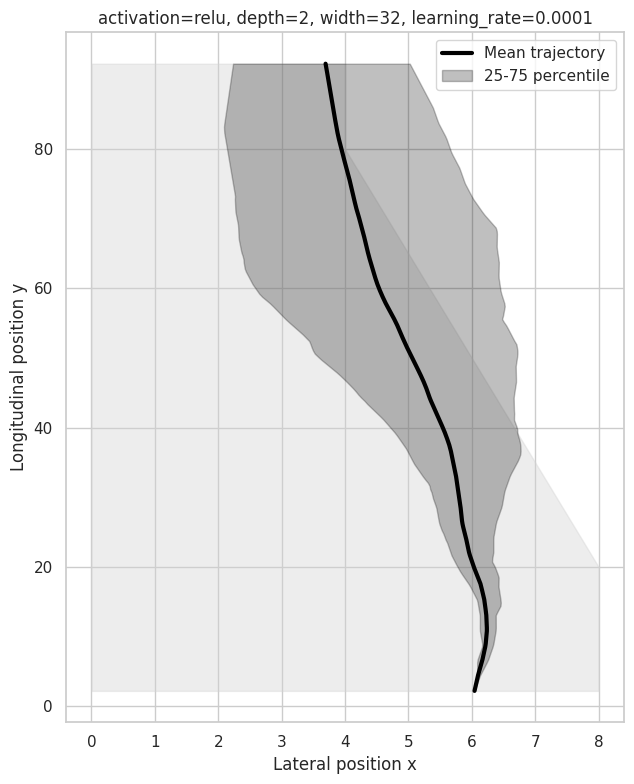

Plotting: {'activation': 'relu', 'depth': 2, 'width': 32, 'learning_rate': 0.001}


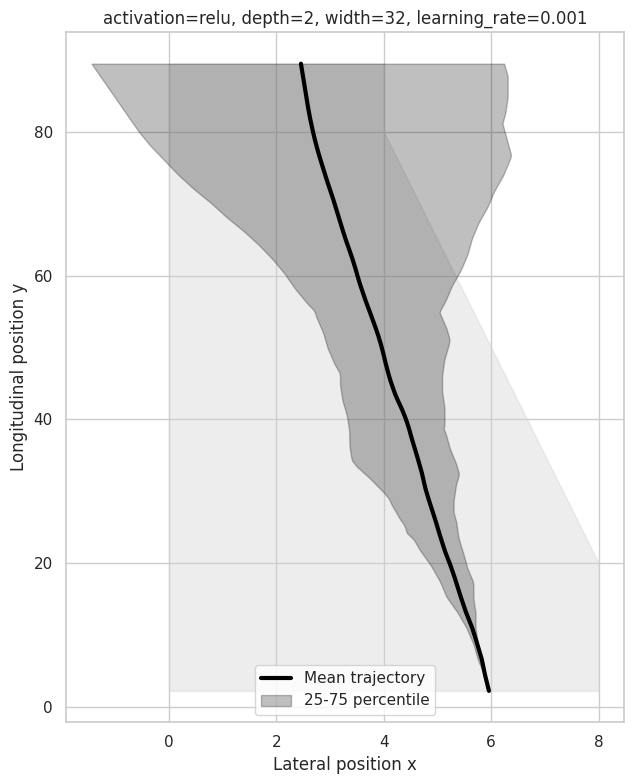

Plotting: {'activation': 'relu', 'depth': 2, 'width': 32, 'learning_rate': 0.01}


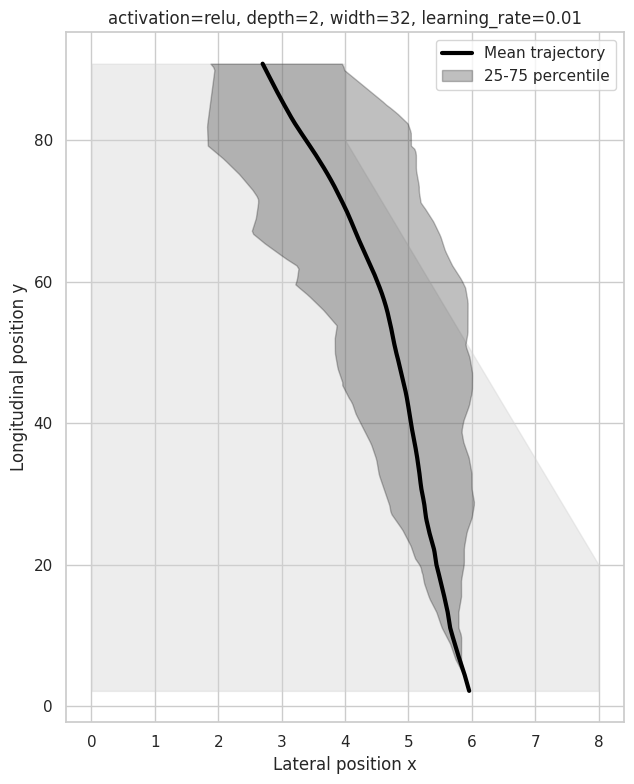

Plotting: {'activation': 'relu', 'depth': 2, 'width': 128, 'learning_rate': 0.0001}


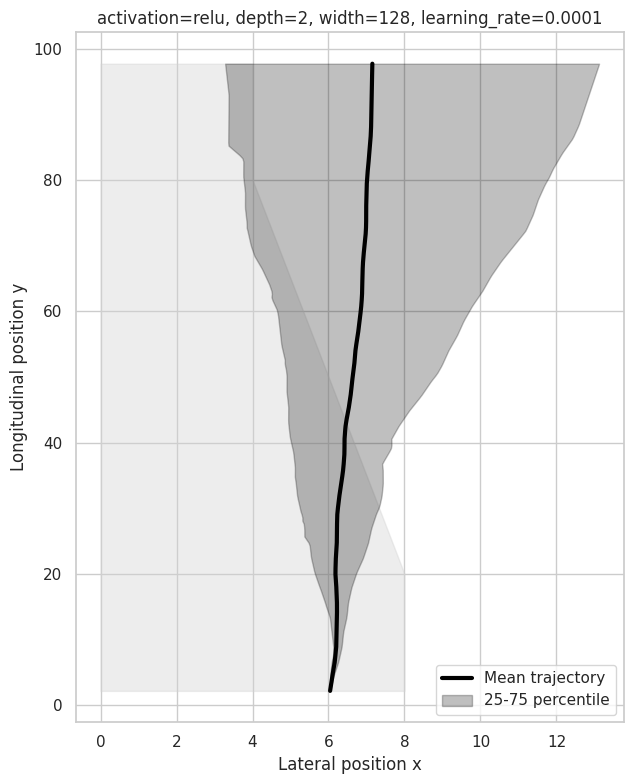

Plotting: {'activation': 'relu', 'depth': 2, 'width': 128, 'learning_rate': 0.001}


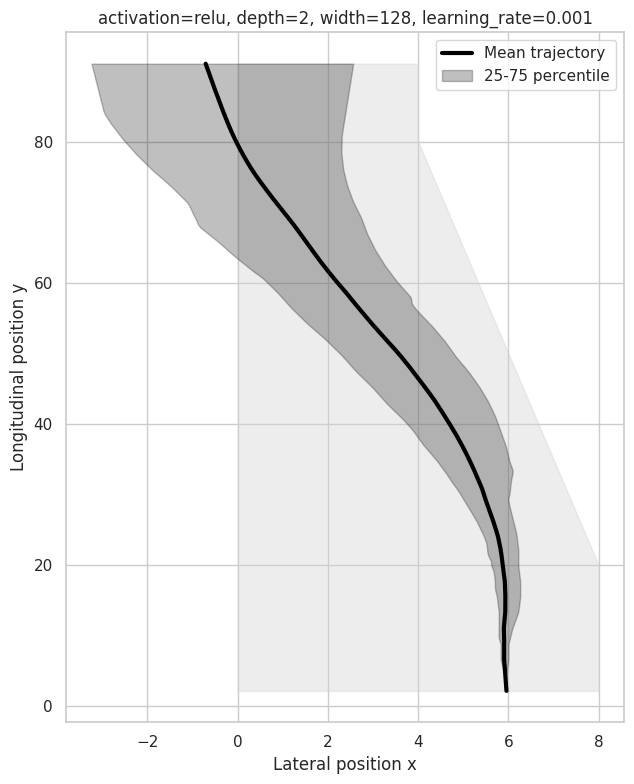

Plotting: {'activation': 'relu', 'depth': 2, 'width': 128, 'learning_rate': 0.01}


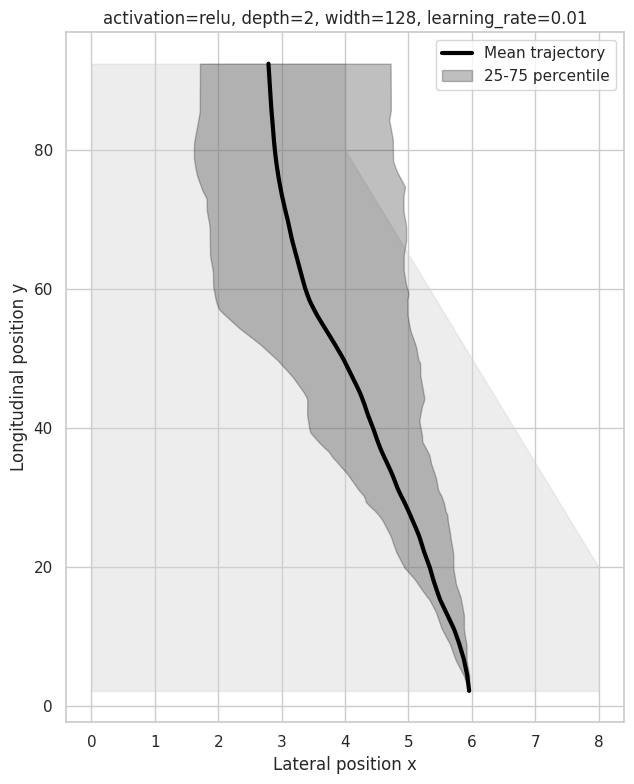

Plotting: {'activation': 'relu', 'depth': 2, 'width': 256, 'learning_rate': 0.0001}


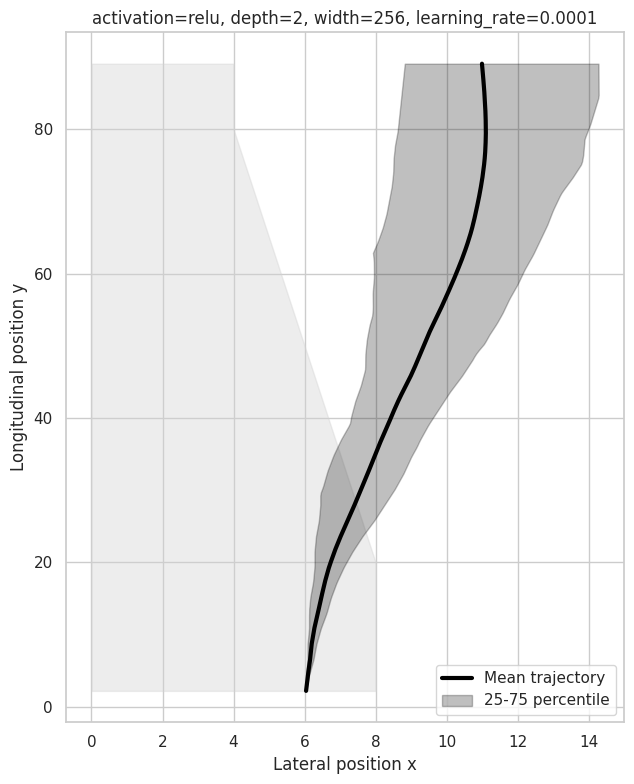

Plotting: {'activation': 'relu', 'depth': 2, 'width': 256, 'learning_rate': 0.001}


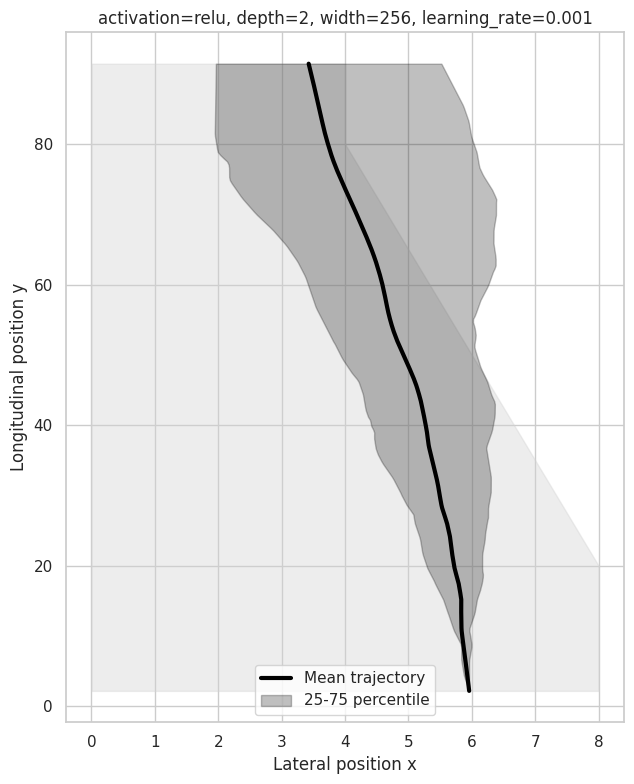

Plotting: {'activation': 'relu', 'depth': 2, 'width': 256, 'learning_rate': 0.01}


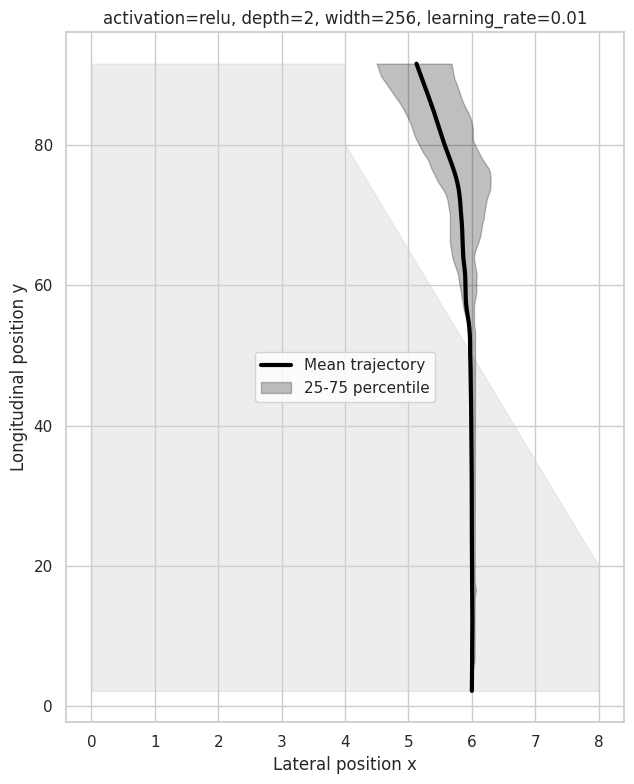

Plotting: {'activation': 'relu', 'depth': 4, 'width': 32, 'learning_rate': 0.0001}


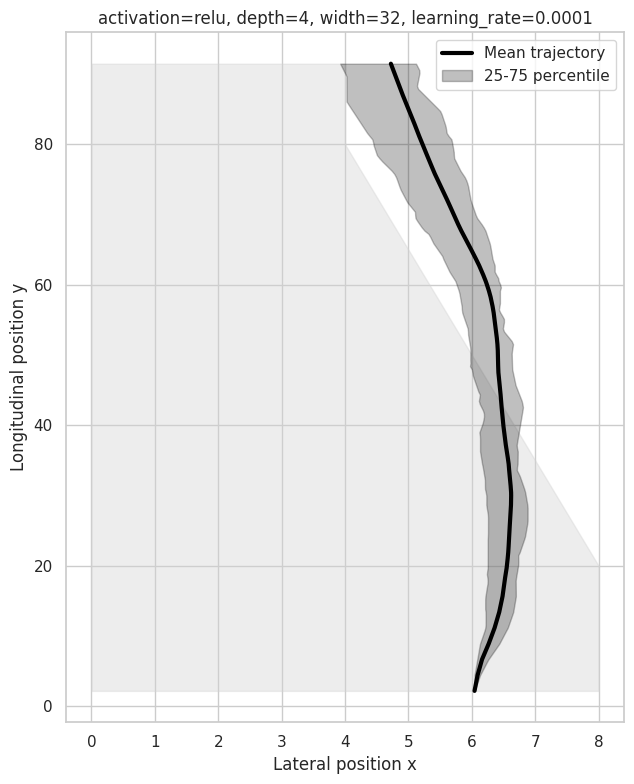

Plotting: {'activation': 'relu', 'depth': 4, 'width': 32, 'learning_rate': 0.001}


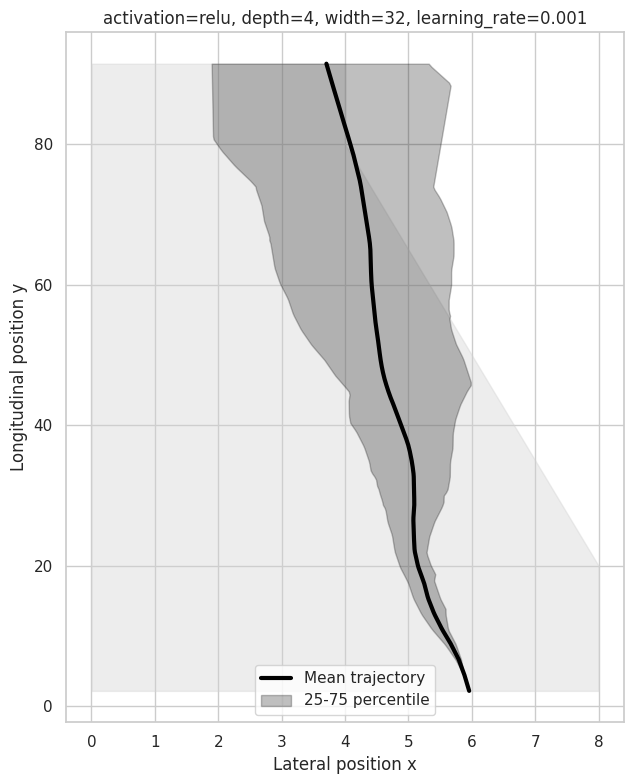

Plotting: {'activation': 'relu', 'depth': 4, 'width': 32, 'learning_rate': 0.01}


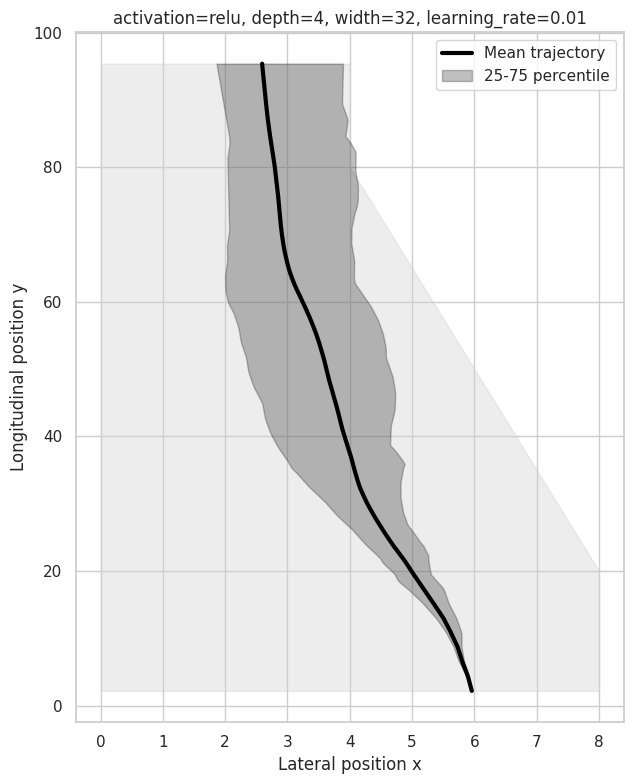

Plotting: {'activation': 'relu', 'depth': 4, 'width': 128, 'learning_rate': 0.0001}


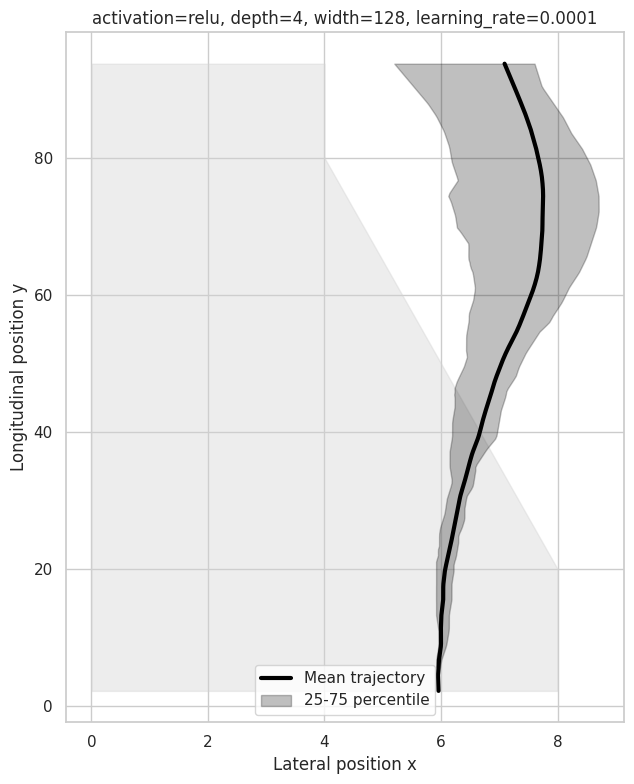

Plotting: {'activation': 'relu', 'depth': 4, 'width': 128, 'learning_rate': 0.001}


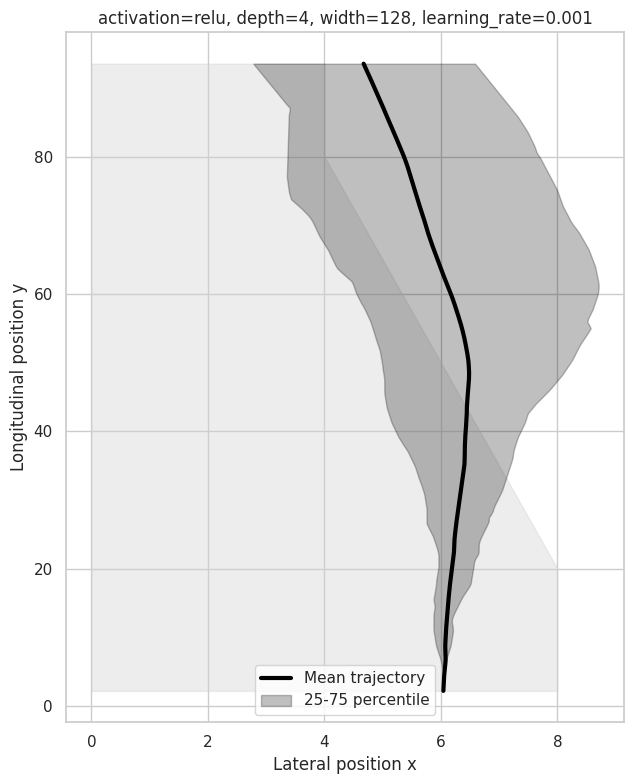

Plotting: {'activation': 'relu', 'depth': 4, 'width': 128, 'learning_rate': 0.01}


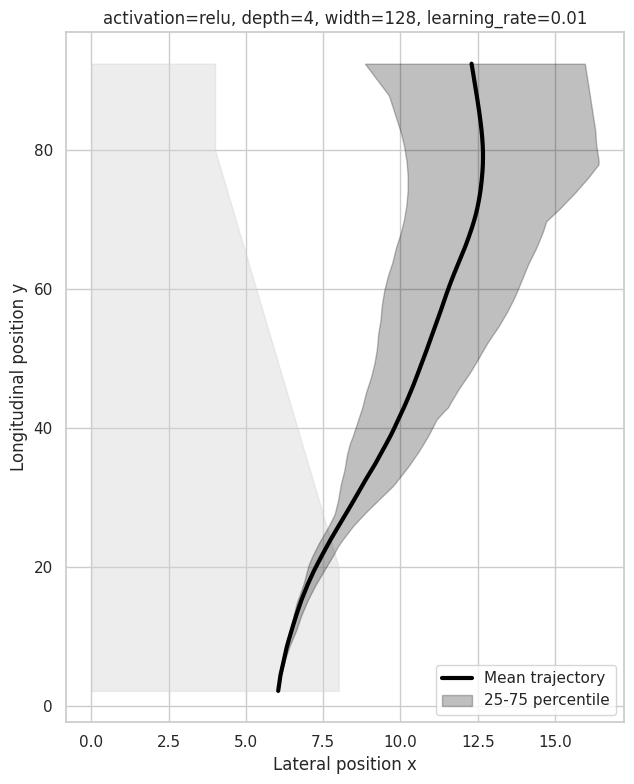

Plotting: {'activation': 'relu', 'depth': 4, 'width': 256, 'learning_rate': 0.0001}


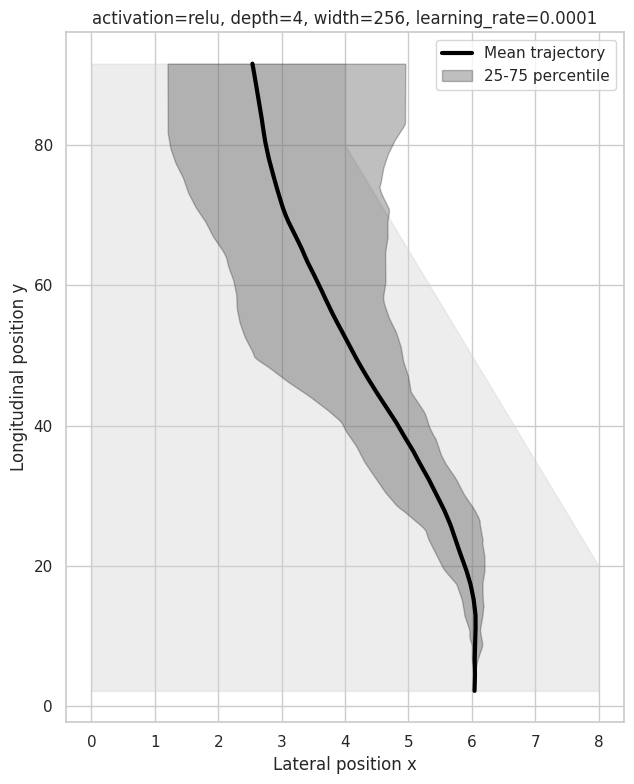

Plotting: {'activation': 'relu', 'depth': 4, 'width': 256, 'learning_rate': 0.001}


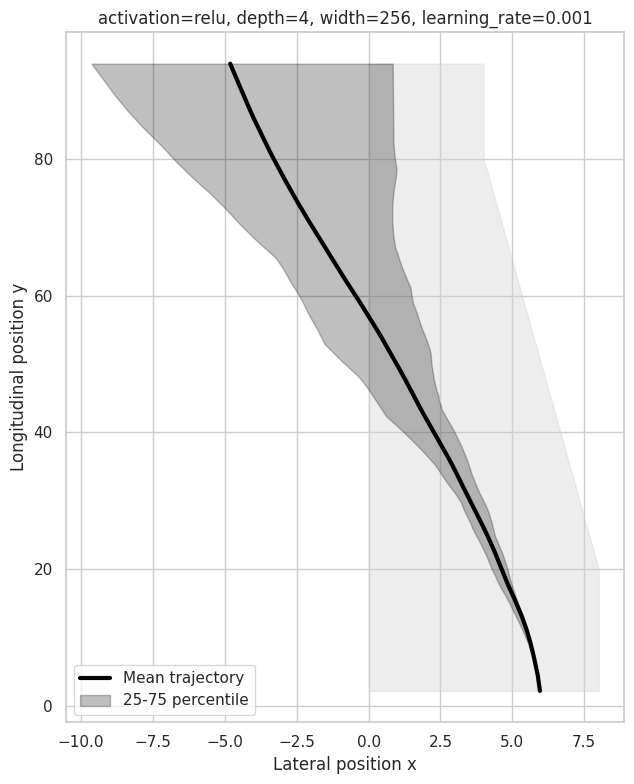

Plotting: {'activation': 'relu', 'depth': 4, 'width': 256, 'learning_rate': 0.01}


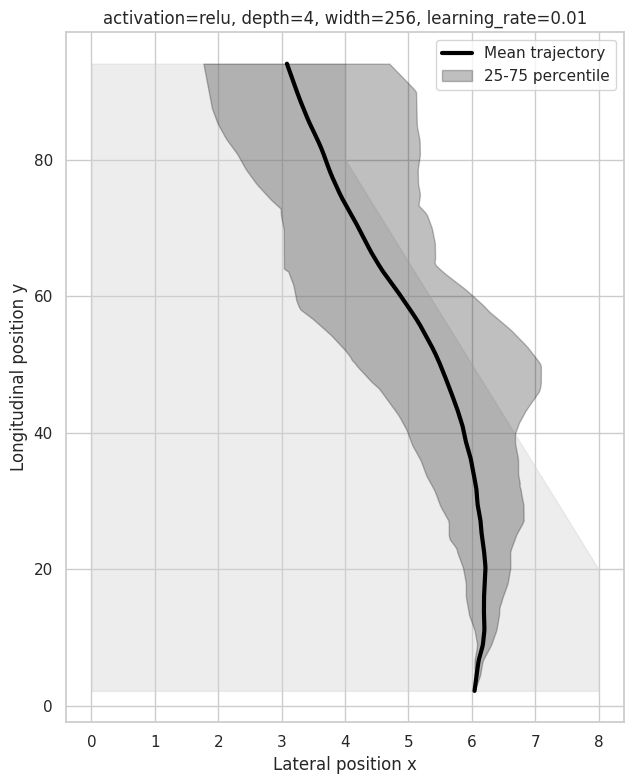

Plotting: {'activation': 'sigmoid', 'depth': 2, 'width': 32, 'learning_rate': 0.0001}


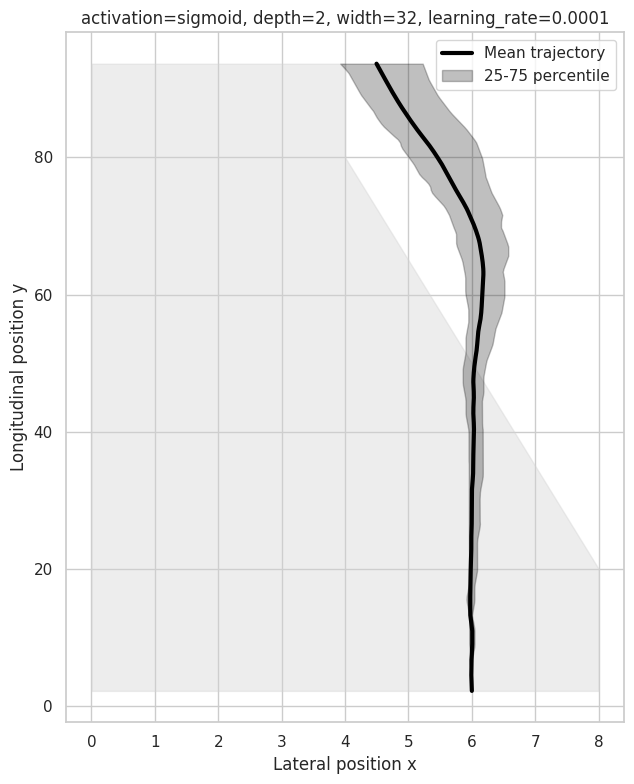

Plotting: {'activation': 'sigmoid', 'depth': 2, 'width': 32, 'learning_rate': 0.001}


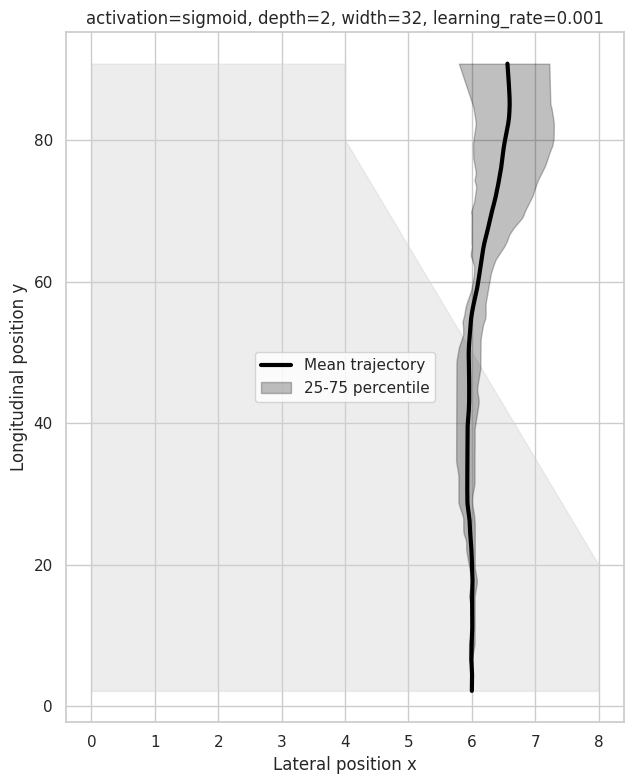

Plotting: {'activation': 'sigmoid', 'depth': 2, 'width': 32, 'learning_rate': 0.01}


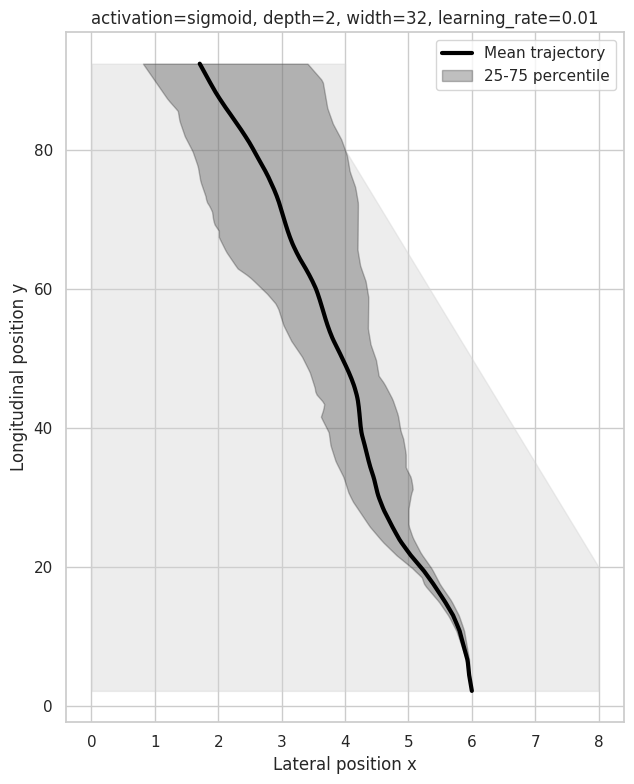

Plotting: {'activation': 'sigmoid', 'depth': 2, 'width': 128, 'learning_rate': 0.0001}


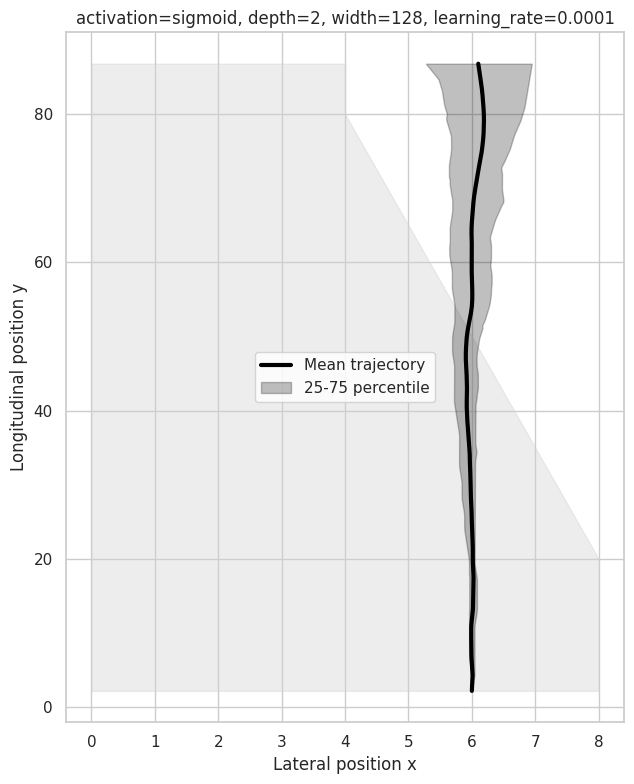

Plotting: {'activation': 'sigmoid', 'depth': 2, 'width': 128, 'learning_rate': 0.001}


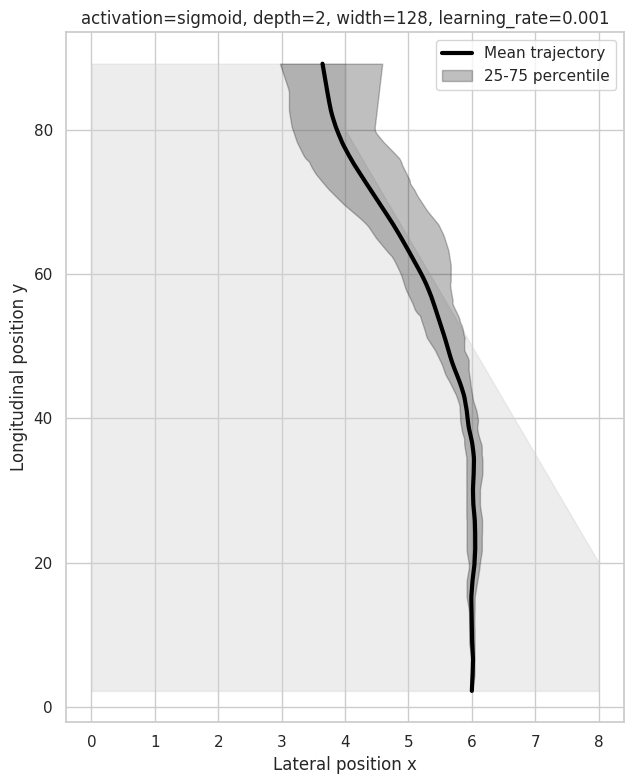

Plotting: {'activation': 'sigmoid', 'depth': 2, 'width': 128, 'learning_rate': 0.01}


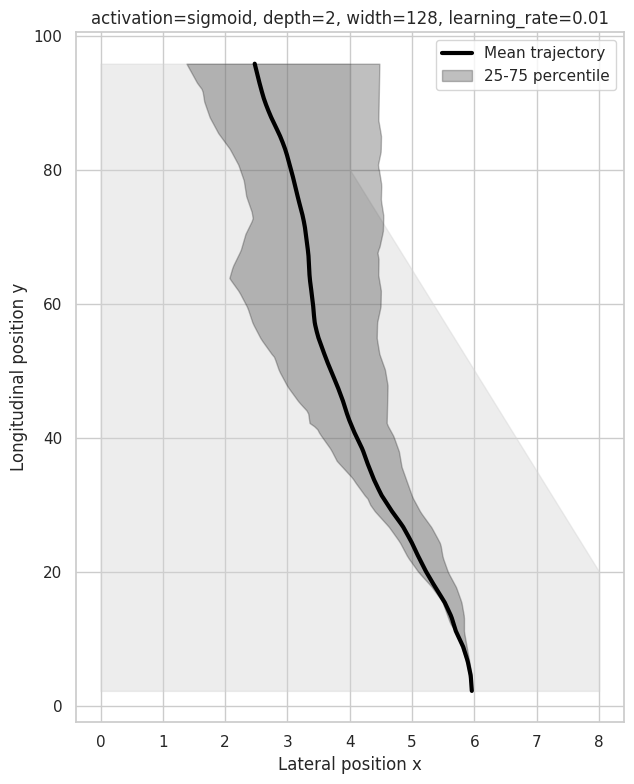

Plotting: {'activation': 'sigmoid', 'depth': 2, 'width': 256, 'learning_rate': 0.0001}


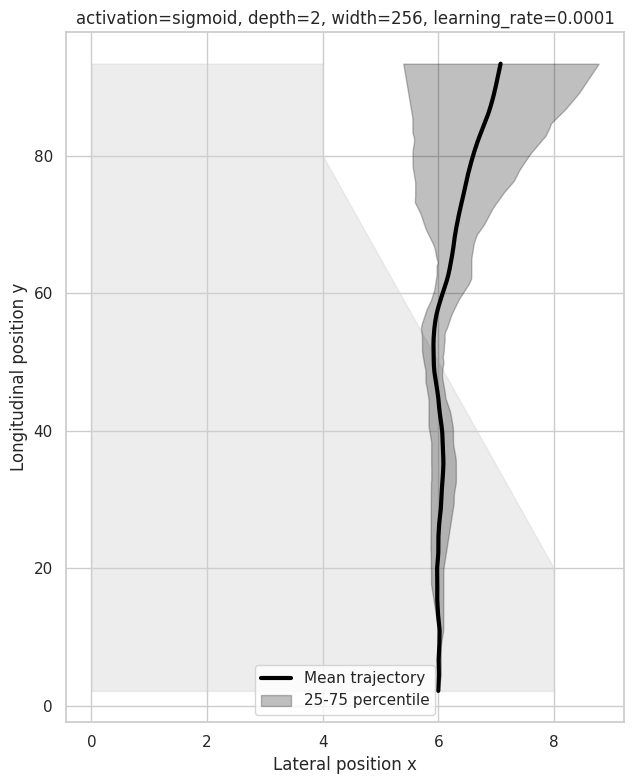

Plotting: {'activation': 'sigmoid', 'depth': 2, 'width': 256, 'learning_rate': 0.001}


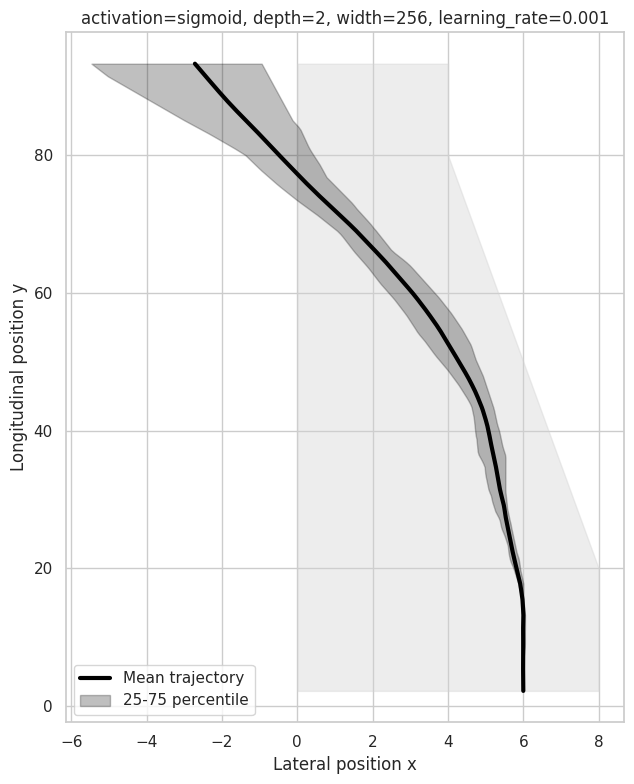

Plotting: {'activation': 'sigmoid', 'depth': 2, 'width': 256, 'learning_rate': 0.01}


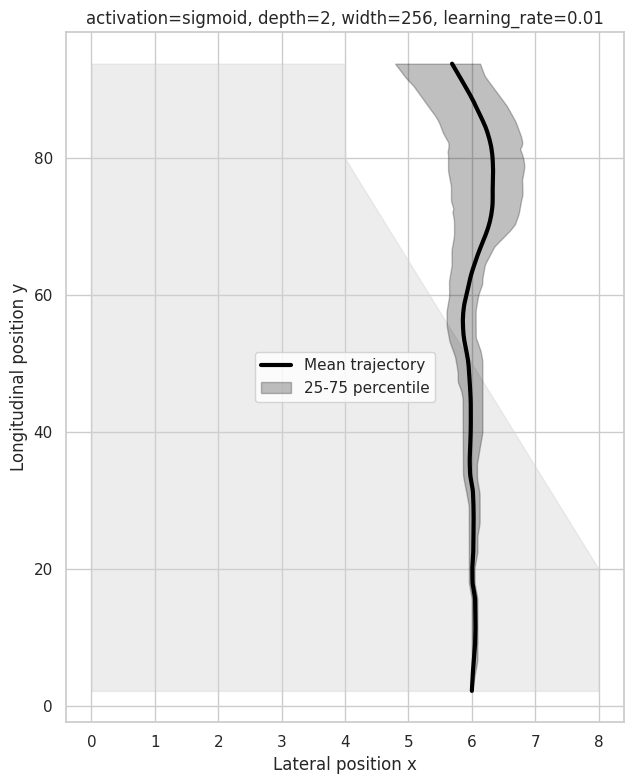

Plotting: {'activation': 'sigmoid', 'depth': 4, 'width': 32, 'learning_rate': 0.0001}


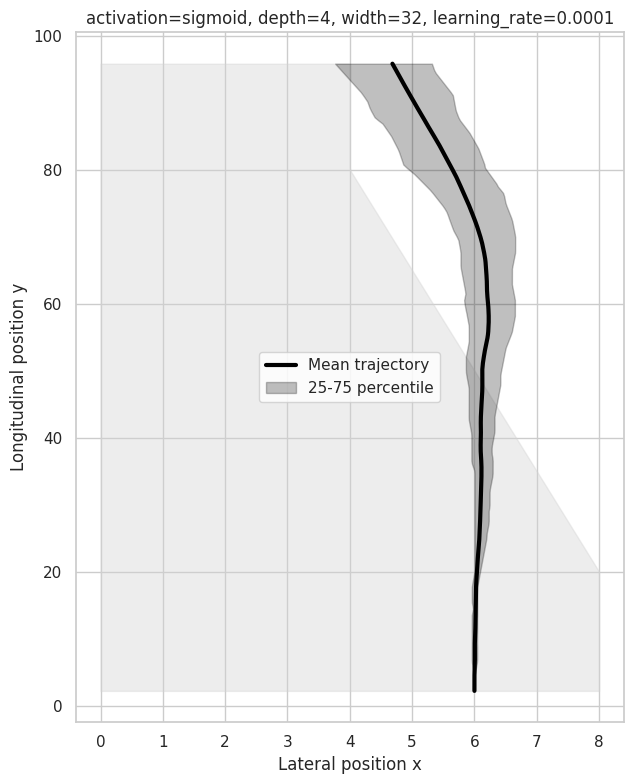

Plotting: {'activation': 'sigmoid', 'depth': 4, 'width': 32, 'learning_rate': 0.001}


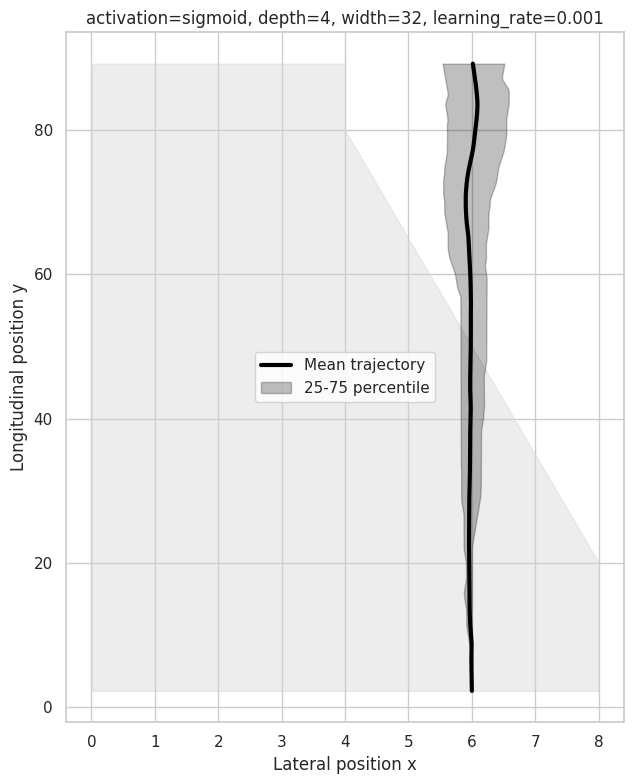

Plotting: {'activation': 'sigmoid', 'depth': 4, 'width': 32, 'learning_rate': 0.01}


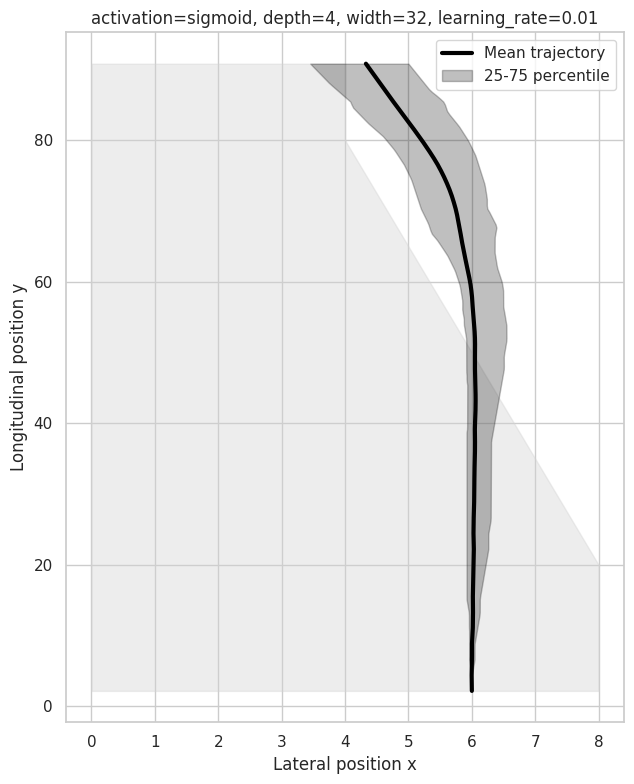

Plotting: {'activation': 'sigmoid', 'depth': 4, 'width': 128, 'learning_rate': 0.0001}


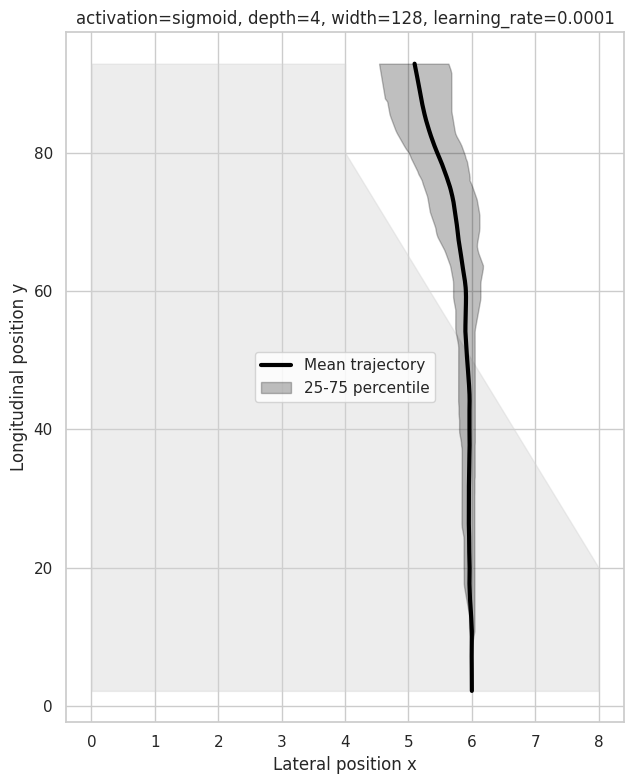

Plotting: {'activation': 'sigmoid', 'depth': 4, 'width': 128, 'learning_rate': 0.001}


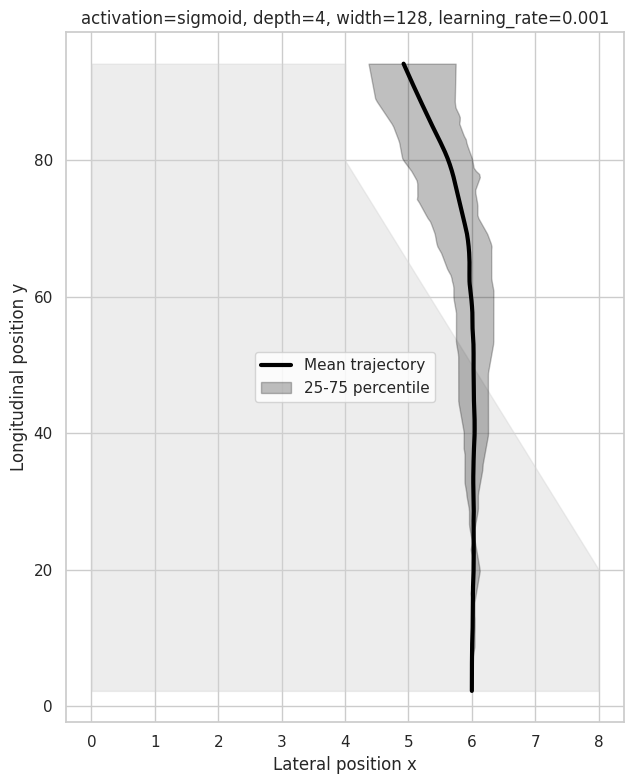

Plotting: {'activation': 'sigmoid', 'depth': 4, 'width': 128, 'learning_rate': 0.01}


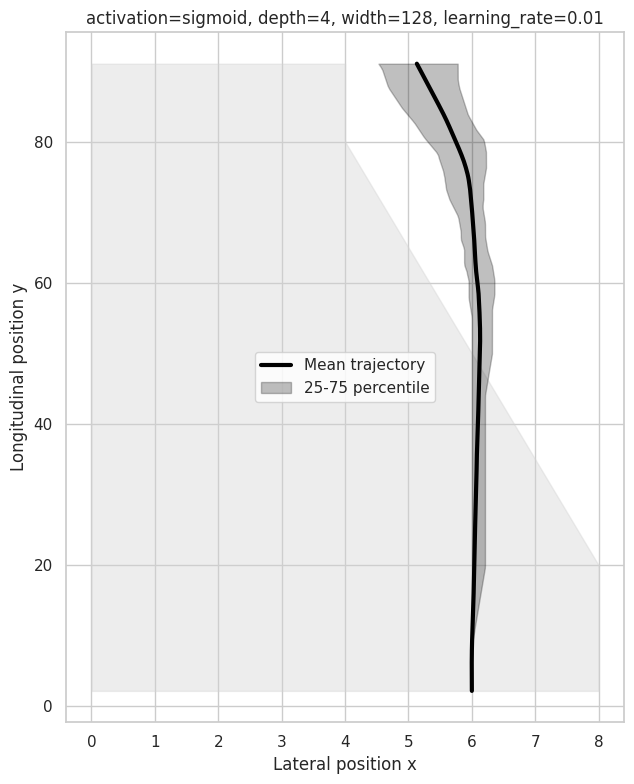

Plotting: {'activation': 'sigmoid', 'depth': 4, 'width': 256, 'learning_rate': 0.0001}


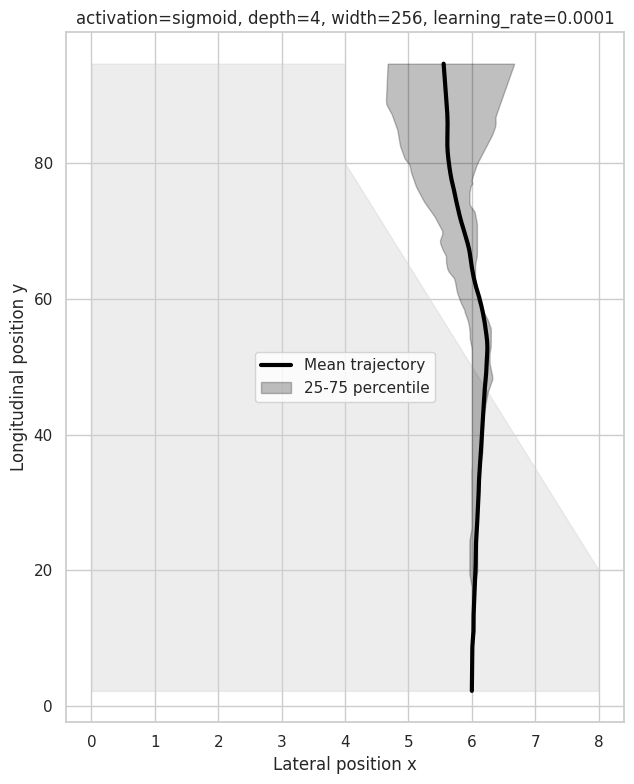

Plotting: {'activation': 'sigmoid', 'depth': 4, 'width': 256, 'learning_rate': 0.001}


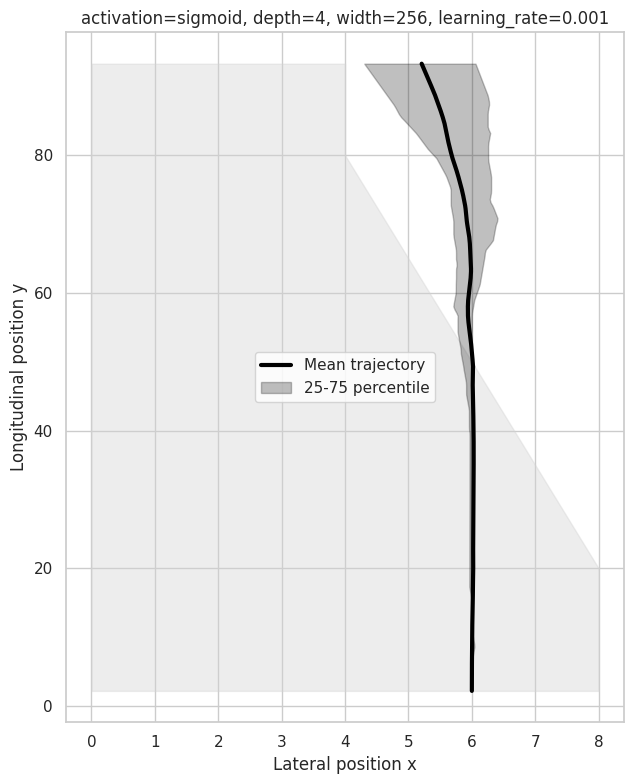

Plotting: {'activation': 'sigmoid', 'depth': 4, 'width': 256, 'learning_rate': 0.01}


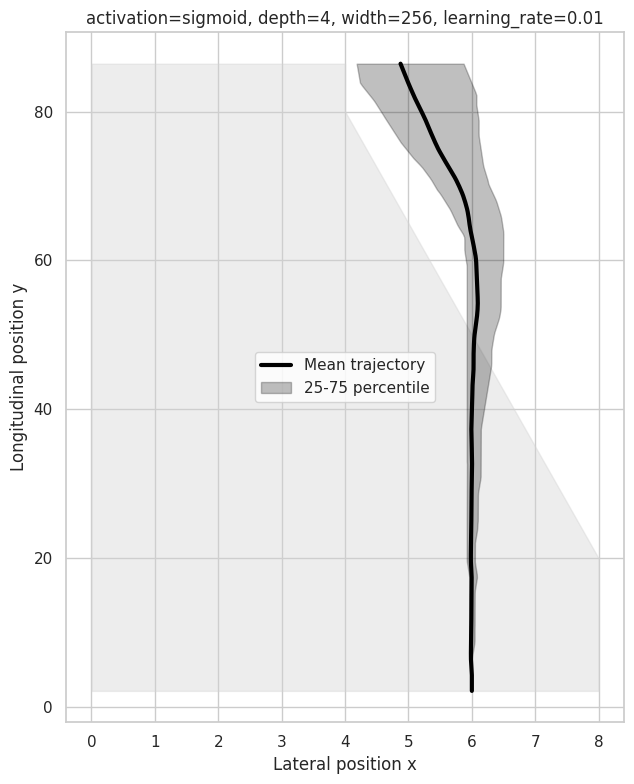

Plotting: {'activation': 'tanh', 'depth': 2, 'width': 32, 'learning_rate': 0.0001}


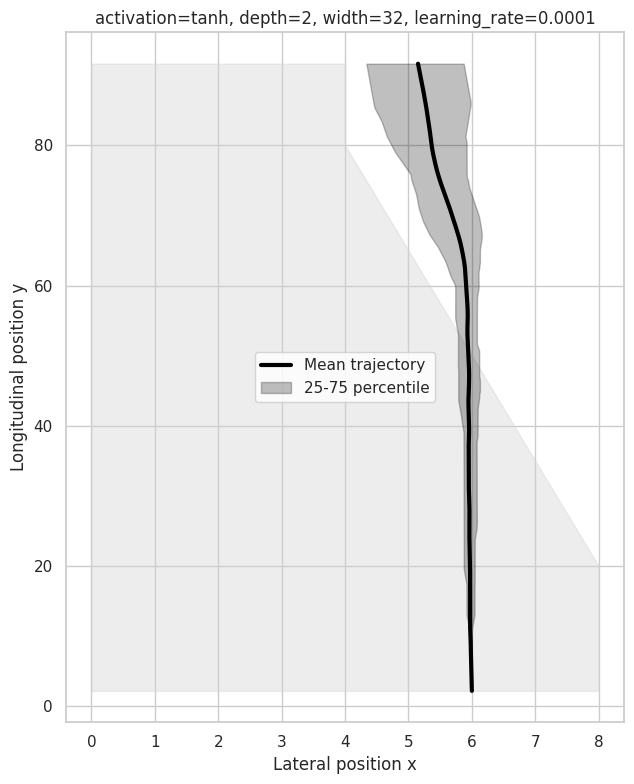

Plotting: {'activation': 'tanh', 'depth': 2, 'width': 32, 'learning_rate': 0.001}


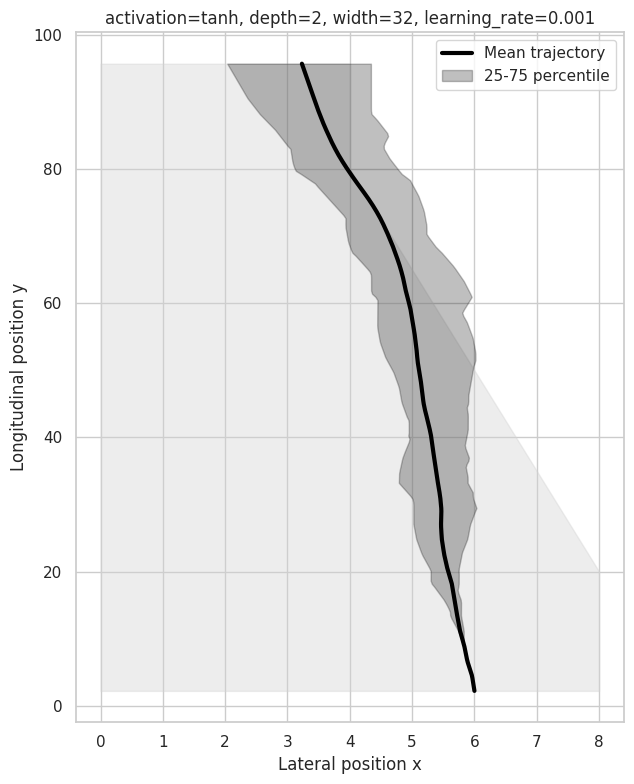

Plotting: {'activation': 'tanh', 'depth': 2, 'width': 32, 'learning_rate': 0.01}


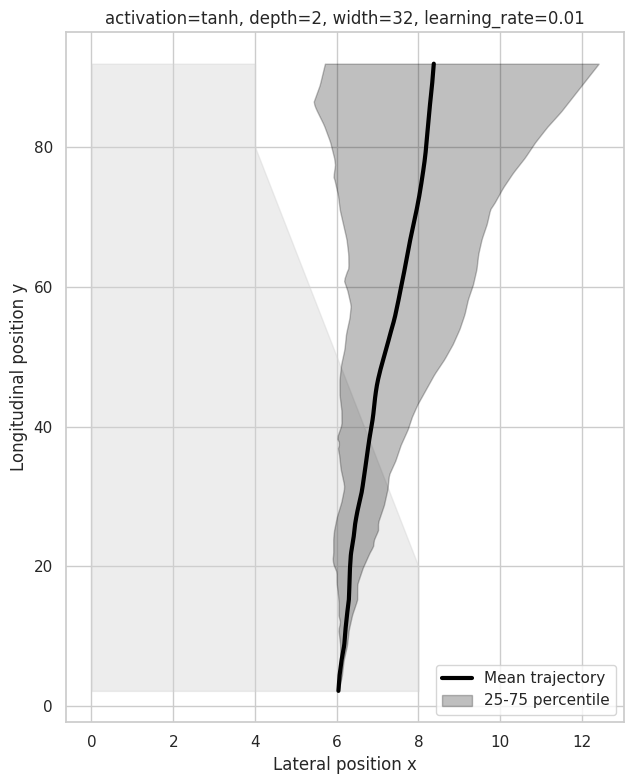

Plotting: {'activation': 'tanh', 'depth': 2, 'width': 128, 'learning_rate': 0.0001}


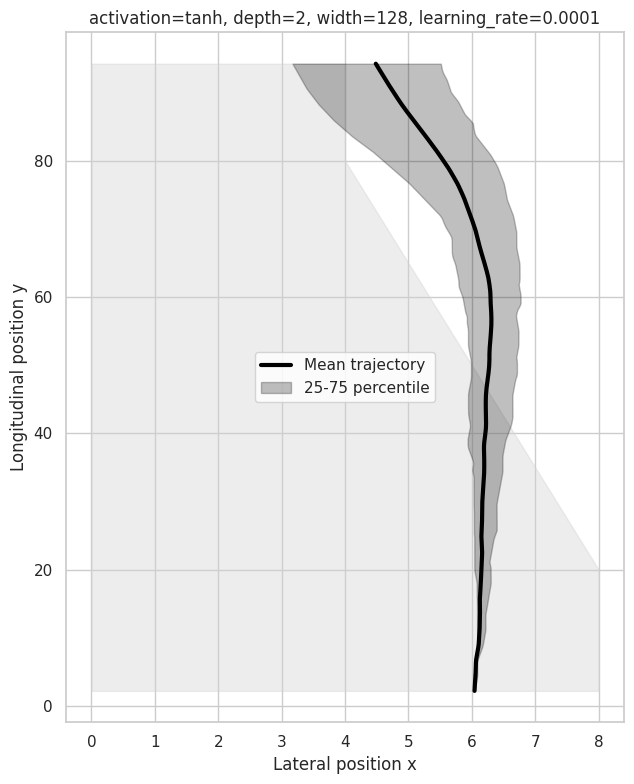

Plotting: {'activation': 'tanh', 'depth': 2, 'width': 128, 'learning_rate': 0.001}


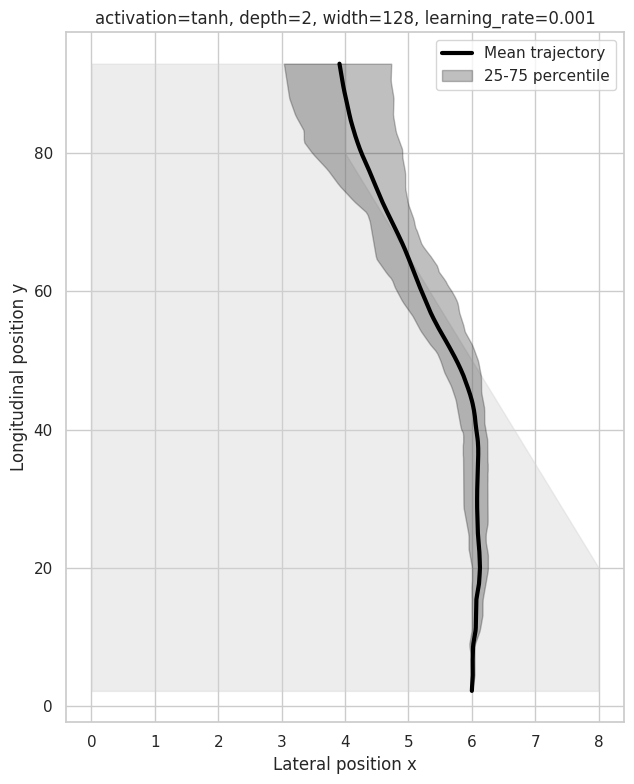

Plotting: {'activation': 'tanh', 'depth': 2, 'width': 128, 'learning_rate': 0.01}


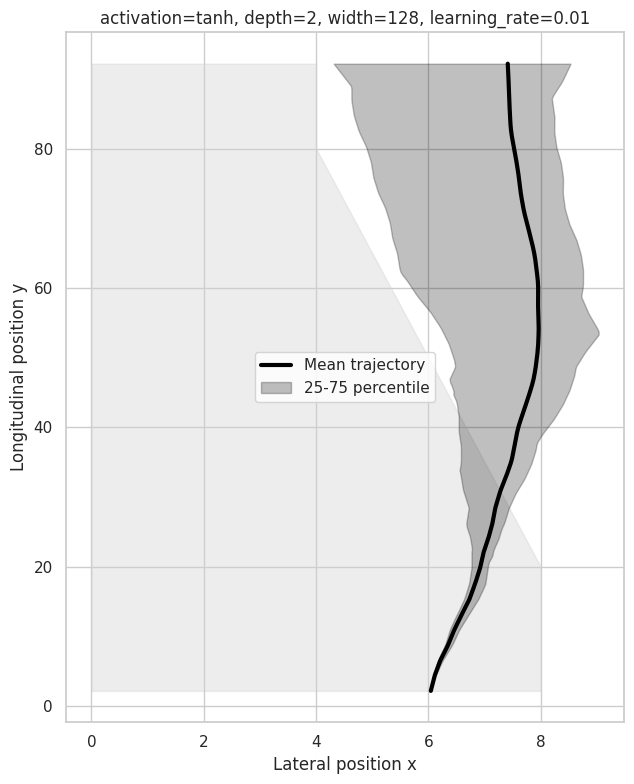

Plotting: {'activation': 'tanh', 'depth': 2, 'width': 256, 'learning_rate': 0.0001}


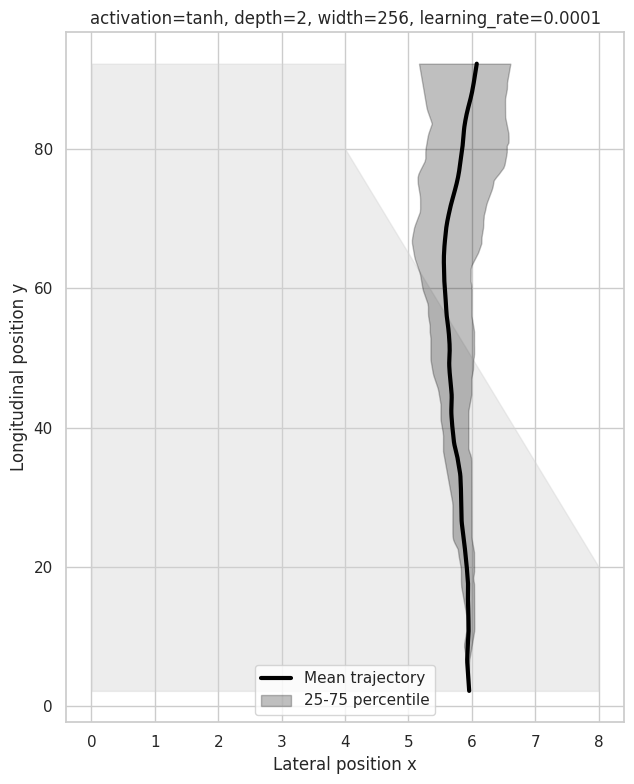

Plotting: {'activation': 'tanh', 'depth': 2, 'width': 256, 'learning_rate': 0.001}


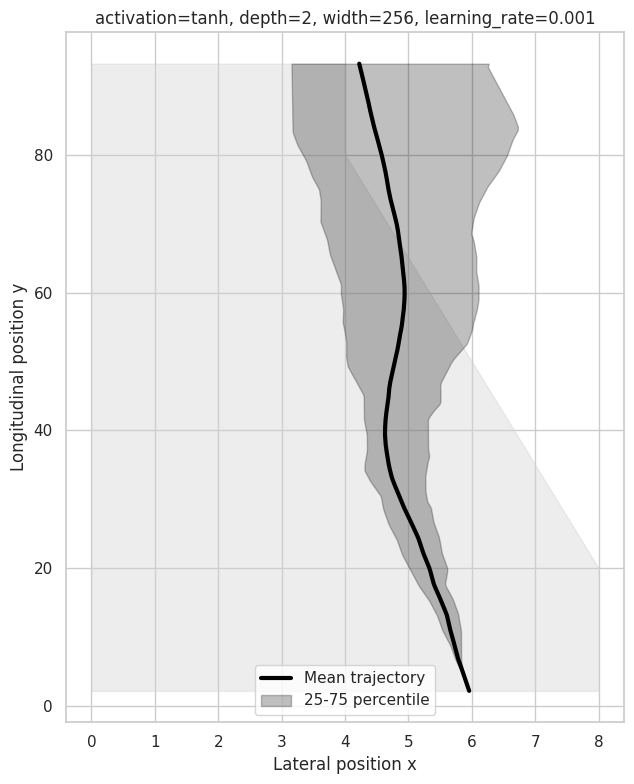

Plotting: {'activation': 'tanh', 'depth': 2, 'width': 256, 'learning_rate': 0.01}


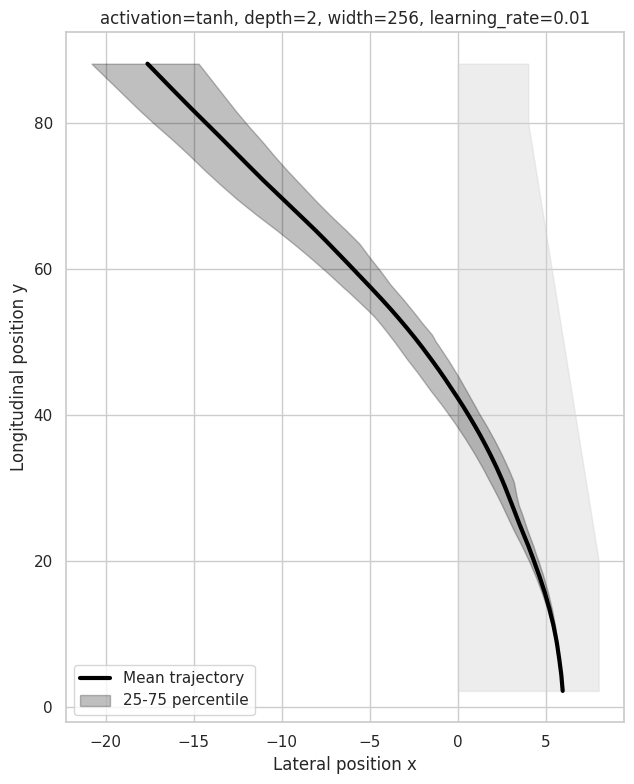

Plotting: {'activation': 'tanh', 'depth': 4, 'width': 32, 'learning_rate': 0.0001}


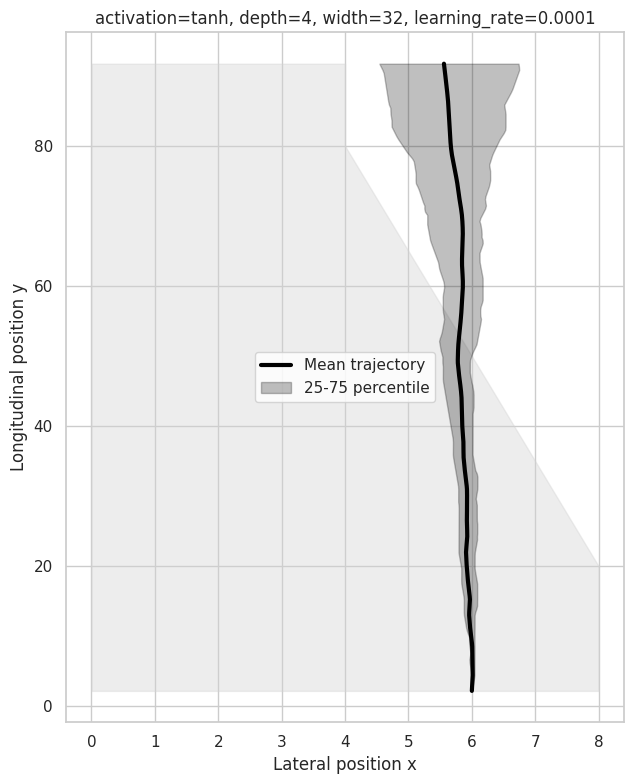

Plotting: {'activation': 'tanh', 'depth': 4, 'width': 32, 'learning_rate': 0.001}


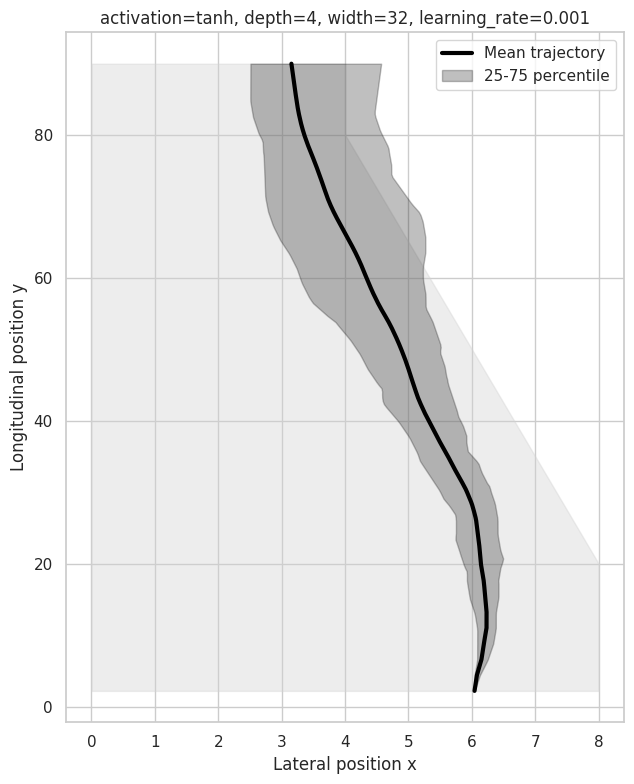

Plotting: {'activation': 'tanh', 'depth': 4, 'width': 32, 'learning_rate': 0.01}


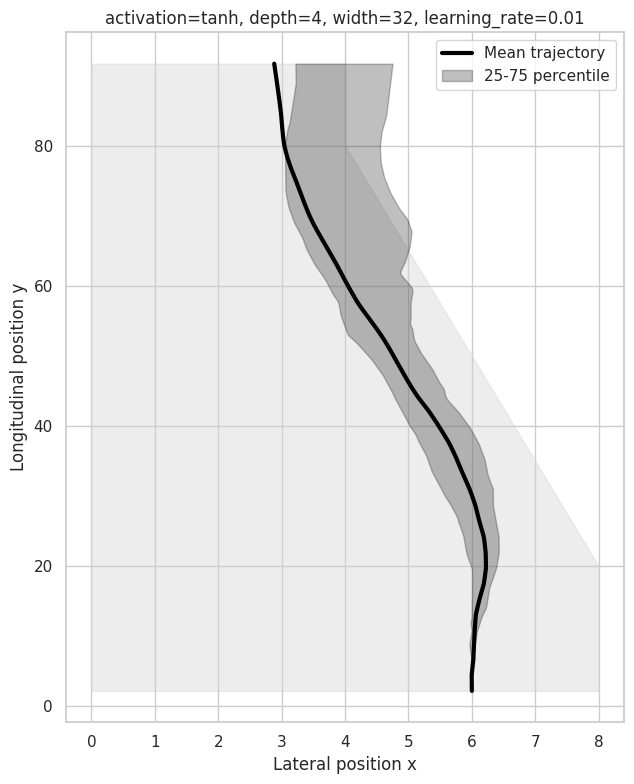

Plotting: {'activation': 'tanh', 'depth': 4, 'width': 128, 'learning_rate': 0.0001}


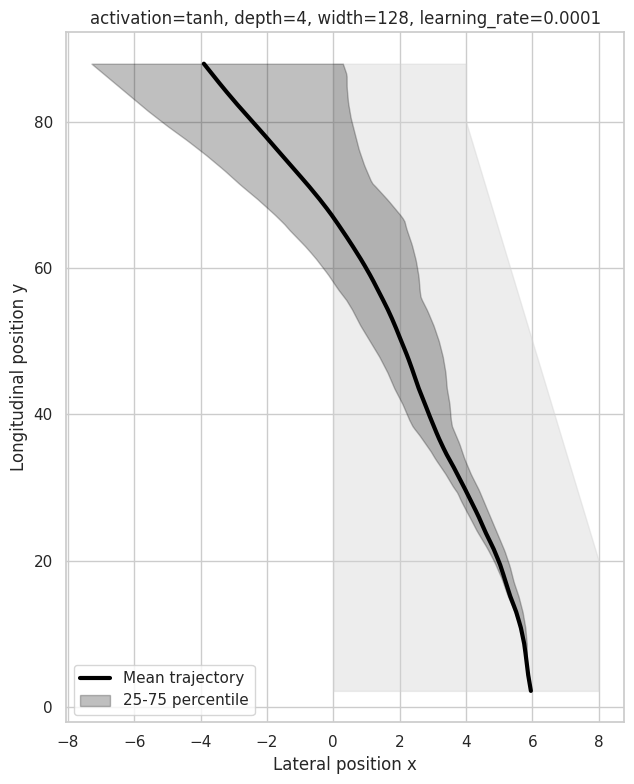

Plotting: {'activation': 'tanh', 'depth': 4, 'width': 128, 'learning_rate': 0.001}


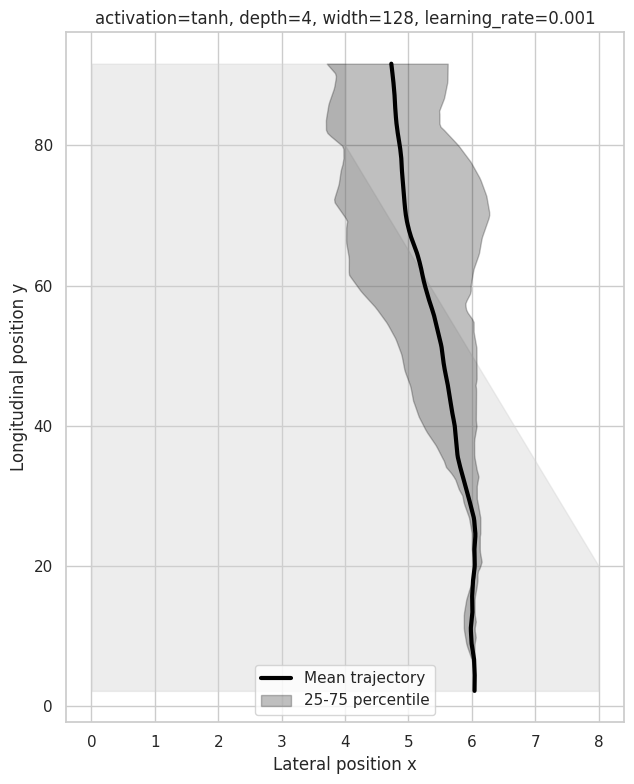

Plotting: {'activation': 'tanh', 'depth': 4, 'width': 128, 'learning_rate': 0.01}


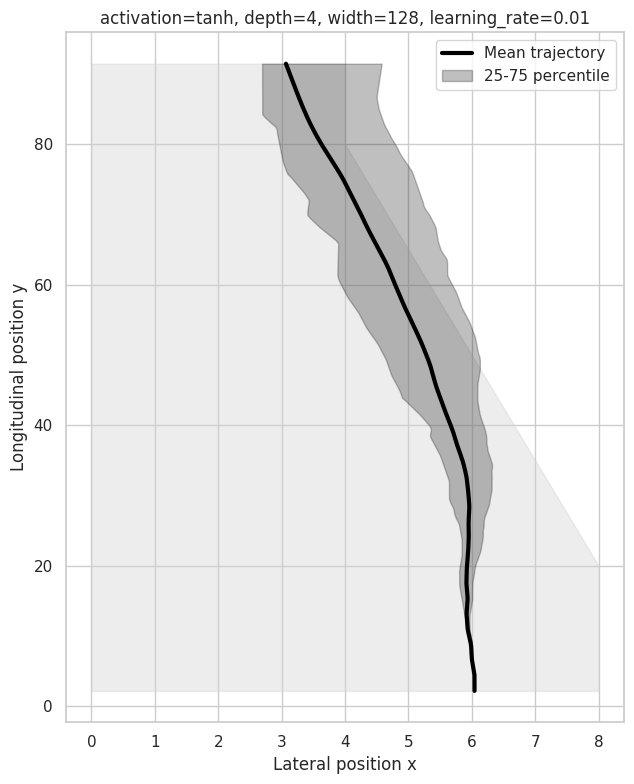

Plotting: {'activation': 'tanh', 'depth': 4, 'width': 256, 'learning_rate': 0.0001}


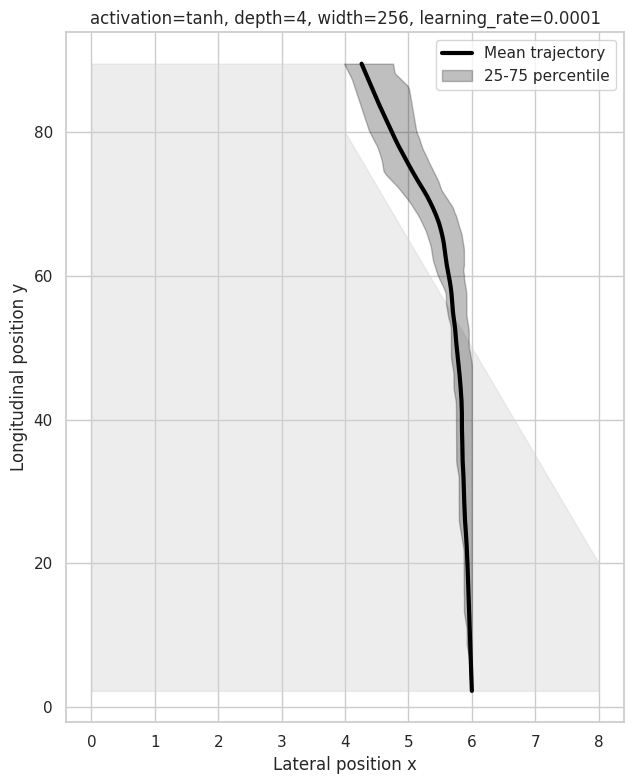

Plotting: {'activation': 'tanh', 'depth': 4, 'width': 256, 'learning_rate': 0.001}


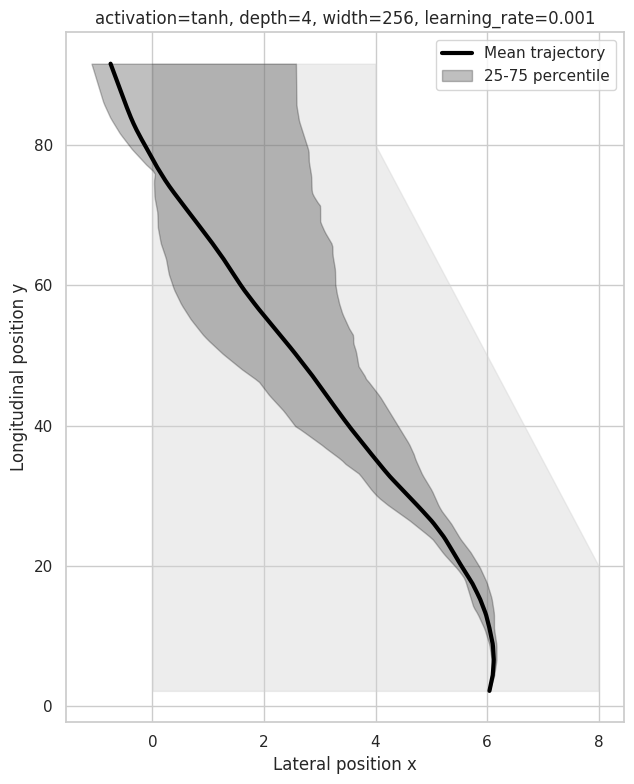

Plotting: {'activation': 'tanh', 'depth': 4, 'width': 256, 'learning_rate': 0.01}


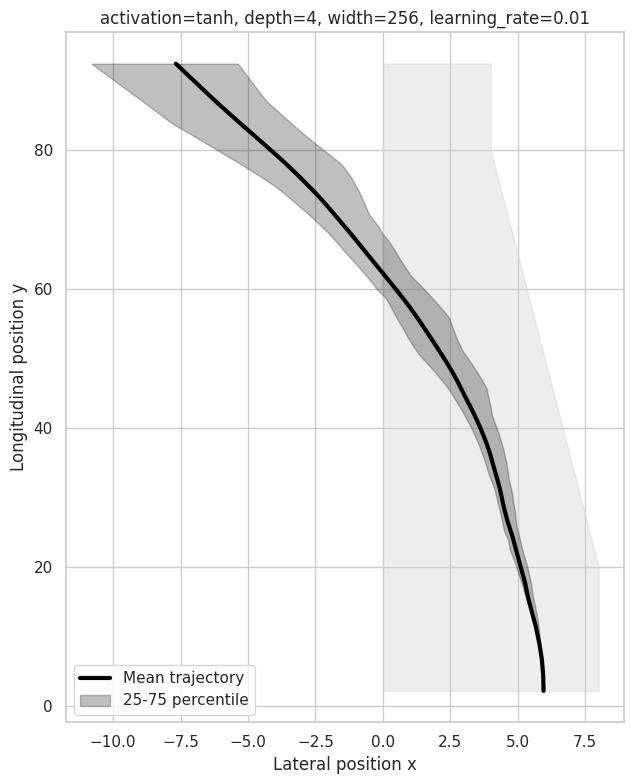

In [ ]:
def plot_mean_density_for_design_point(df, design_point):
    """
    design_point: dict with keys like
    {
        "activation": "sigmoid",
        "depth": 4,
        "width": 128,
        "learning_rate": 1e-3
    }
    """

    # ---- Filter dataframe ----
    subdf = df.copy()
    for k, v in design_point.items():
        subdf = subdf[subdf[k] == v]

    if subdf.empty:
        print(f"No data for {design_point}")
        return

    # ---- Common y-grid ----
    y_grid = np.linspace(
        subdf["def_y"].min(),
        subdf["def_y"].max(),
        200
    )

    trajs = []

    for (_, _), sub in subdf.groupby(["model", "instance"]):
        sub = sub.sort_values("def_y")
        if len(sub) < 5:
            continue

        f = interp1d(
            sub["def_y"],
            sub["def_x"],
            bounds_error=False,
            fill_value="extrapolate"
        )
        trajs.append(f(y_grid))

    if len(trajs) == 0:
        print(f"No valid trajectories for {design_point}")
        return

    trajs = np.vstack(trajs)

    mean_x = trajs.mean(axis=0)
    q10, q90 = np.percentile(trajs, [10, 90], axis=0)
    q25, q75 = np.percentile(trajs, [25, 75], axis=0)

    plt.figure(figsize=(6.5, 8))

    # ---- Road geometry ----
    rb = np.array([right_bound(y) for y in y_grid])
    plt.fill_betweenx(
        y_grid, L1, rb,
        color="lightgray", alpha=0.4
    )

    # ---- Mean + envelope ----
    plt.plot(mean_x, y_grid, color="black", lw=3, label="Mean trajectory")
    plt.fill_betweenx(
        y_grid, q25, q75,
        color="black", alpha=0.25,
        label="25-75 percentile"
    )

    title = ", ".join(f"{k}={v}" for k, v in design_point.items())
    plt.title(title)

    plt.xlabel("Lateral position x")
    plt.ylabel("Longitudinal position y")
    plt.legend()
    plt.tight_layout()
    plt.show()

for _, row in design_points.iterrows():
    design_point = {
        "activation": row["activation"],
        "depth": row["depth"],
        "width": row["width"],
        "learning_rate": row["learning_rate"],
    }

    print("Plotting:", design_point)
    plot_mean_density_for_design_point(df, design_point)


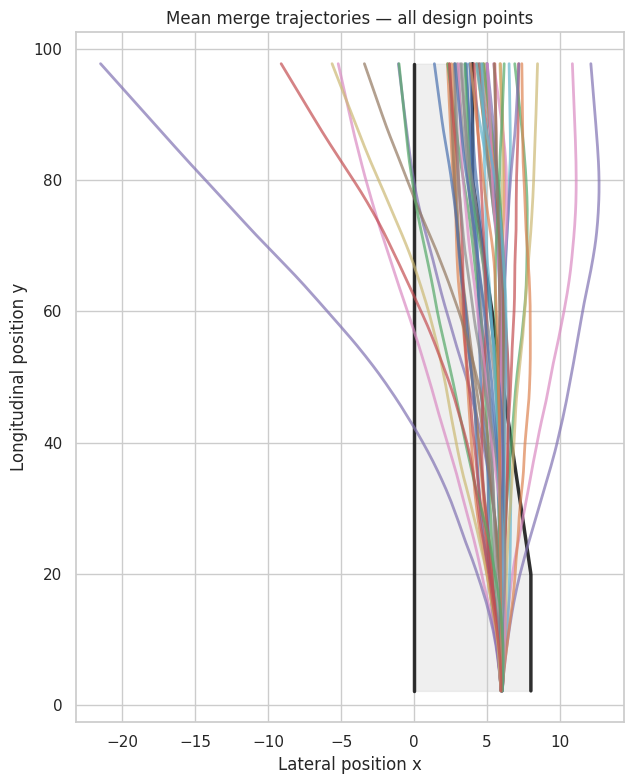

In [ ]:
def compute_mean_trajectory(df, design_point, y_grid):
    """
    Returns mean_x over y_grid for a given design point.
    """
    subdf = df.copy()
    for k, v in design_point.items():
        subdf = subdf[subdf[k] == v]

    trajs = []

    for (_, _), sub in subdf.groupby(["model", "instance"]):
        sub = sub.sort_values("def_y")
        if len(sub) < 5:
            continue

        f = interp1d(
            sub["def_y"],
            sub["def_x"],
            bounds_error=False,
            fill_value="extrapolate"
        )
        trajs.append(f(y_grid))

    if len(trajs) == 0:
        return None

    trajs = np.vstack(trajs)
    return trajs.mean(axis=0)

y_grid = np.linspace(
    df["def_y"].min(),
    df["def_y"].max(),
    250
)

design_points = (
    episode_df[
        ["depth", "width", "activation", "learning_rate"]
    ]
    .drop_duplicates()
    .sort_values(["activation", "depth", "width", "learning_rate"])
)

mean_trajs = []

for _, row in design_points.iterrows():
    design_point = {
        "activation": row["activation"],
        "depth": row["depth"],
        "width": row["width"],
        "learning_rate": row["learning_rate"],
    }

    mean_x = compute_mean_trajectory(df, design_point, y_grid)
    if mean_x is None:
        continue

    mean_trajs.append({
        **design_point,
        "mean_x": mean_x
    })

plt.figure(figsize=(6.5, 8))

# Road
# Precompute road once
rb = np.array([right_bound(y) for y in y_grid])

# --- Road fill ---
plt.fill_betweenx(
    y_grid,
    L1,
    rb,
    color="lightgray",
    alpha=0.35,
    zorder=0
)

# --- Road boundaries (strong visual anchor) ---
plt.plot(
    np.full_like(y_grid, L1),
    y_grid,
    color="black",
    lw=2.5,
    alpha=0.8,
    zorder=1,
    label="Road edge"
)

plt.plot(
    rb,
    y_grid,
    color="black",
    lw=2.5,
    alpha=0.8,
    zorder=1
)


for d in mean_trajs:
    plt.plot(
        d["mean_x"],
        y_grid,
        lw=2,
        alpha=0.7,
        zorder=3
    )


plt.xlabel("Lateral position x")
plt.ylabel("Longitudinal position y")
plt.title("Mean merge trajectories — all design points")
plt.tight_layout()
plt.show()


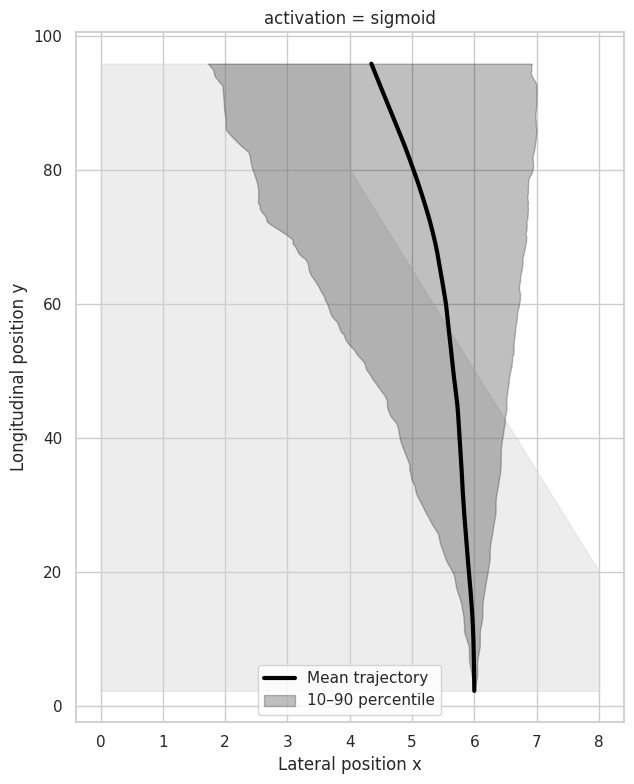

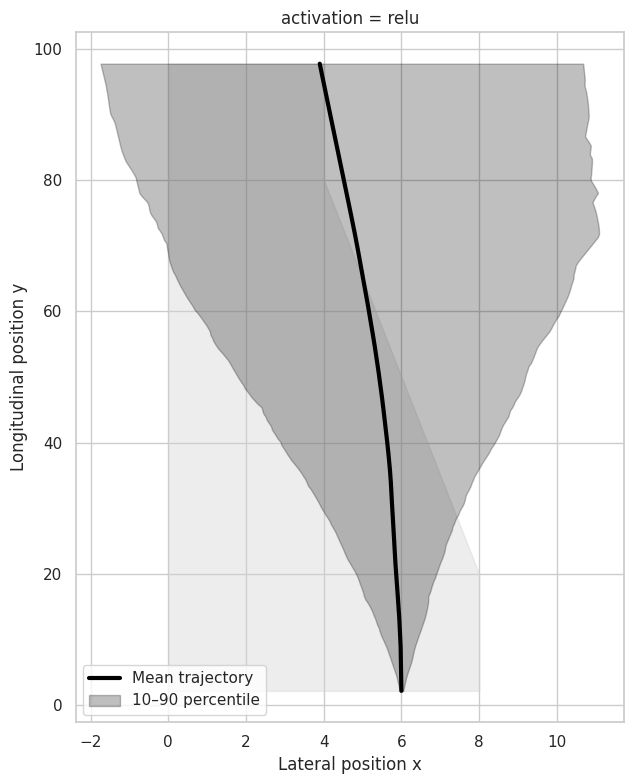

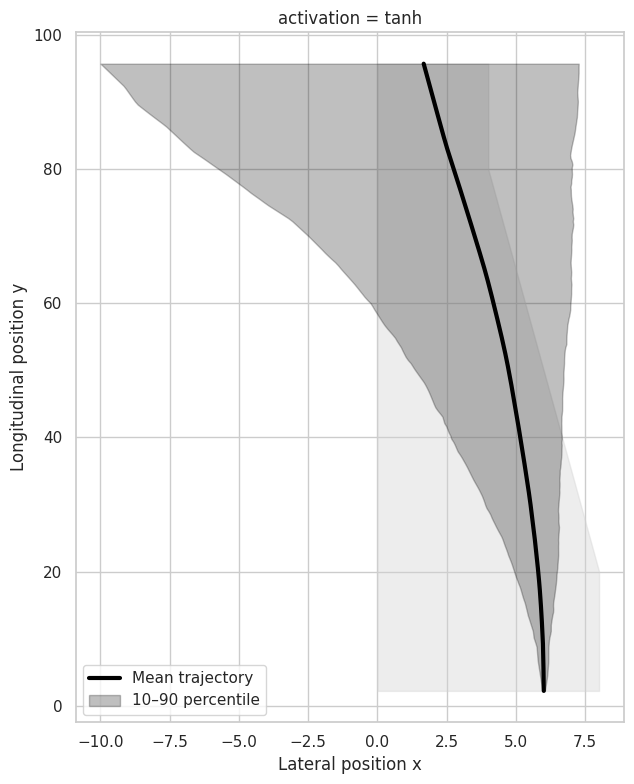

In [ ]:
def plot_mean_density_by_factor(df, factor, level):
    subdf = df[df[factor] == level]

    y_grid = np.linspace(
        subdf["def_y"].min(),
        subdf["def_y"].max(),
        200
    )

    trajs = []

    for (_, _), sub in subdf.groupby(["model", "instance"]):
        sub = sub.sort_values("def_y")
        if len(sub) < 5:
            continue
        f = interp1d(
            sub["def_y"], sub["def_x"],
            bounds_error=False,
            fill_value="extrapolate"
        )
        trajs.append(f(y_grid))

    trajs = np.vstack(trajs)

    mean_x = trajs.mean(axis=0)
    q10, q90 = np.percentile(trajs, [10, 90], axis=0)

    plt.figure(figsize=(6.5, 8))

    # Road
    rb = np.array([right_bound(y) for y in y_grid])
    plt.fill_betweenx(y_grid, L1, rb, color="lightgray", alpha=0.4)

    # Mean + envelope
    plt.plot(mean_x, y_grid, color="black", lw=3, label="Mean trajectory")
    plt.fill_betweenx(
        y_grid, q10, q90,
        color="black", alpha=0.25,
        label="10–90 percentile"
    )

    plt.xlabel("Lateral position x")
    plt.ylabel("Longitudinal position y")
    plt.title(f"{factor} = {level}")
    plt.legend()
    plt.tight_layout()
    plt.show()


plot_mean_density_by_factor(df, "activation", "sigmoid")
plot_mean_density_by_factor(df, "activation", "relu")
plot_mean_density_by_factor(df, "activation", "tanh")



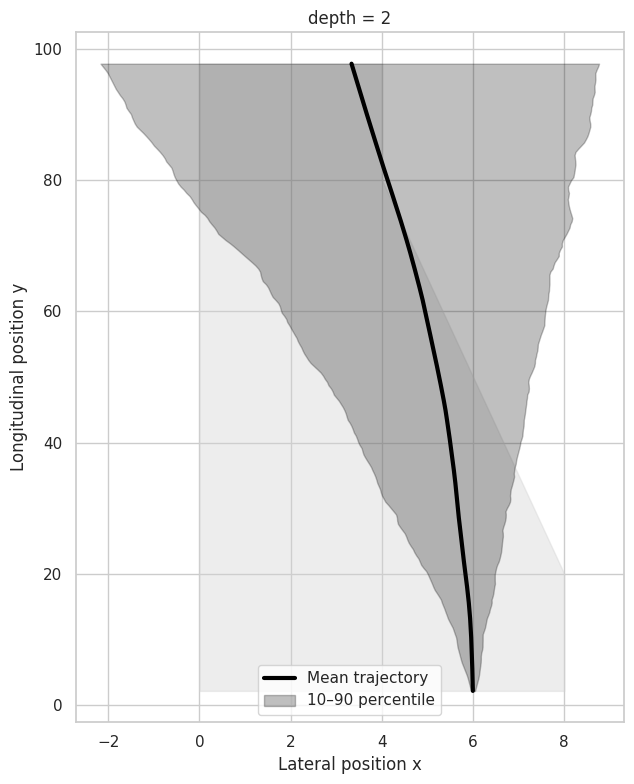

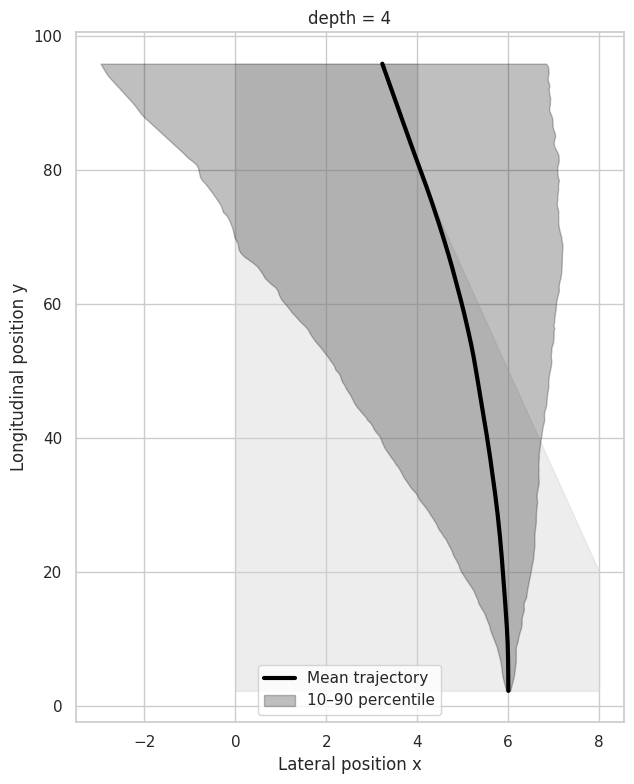

In [ ]:
plot_mean_density_by_factor(df, "depth", 2)
plot_mean_density_by_factor(df, "depth", 4)


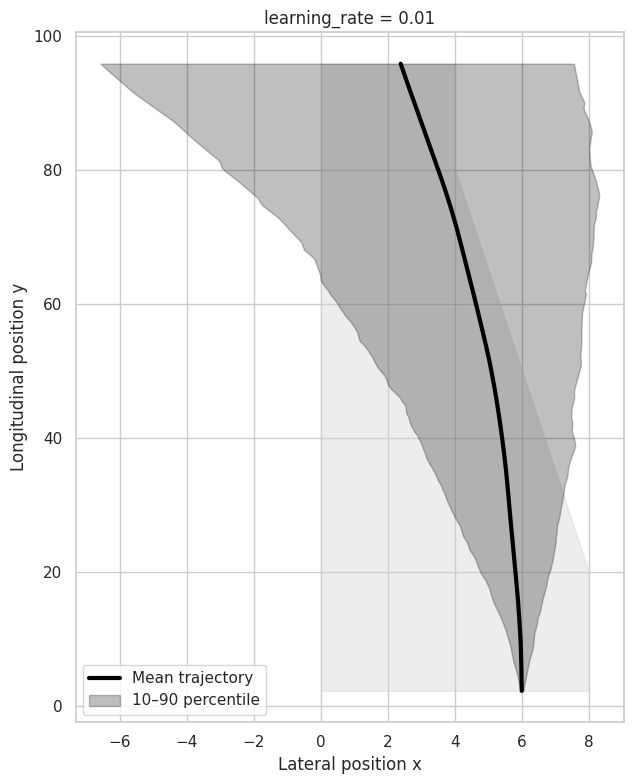

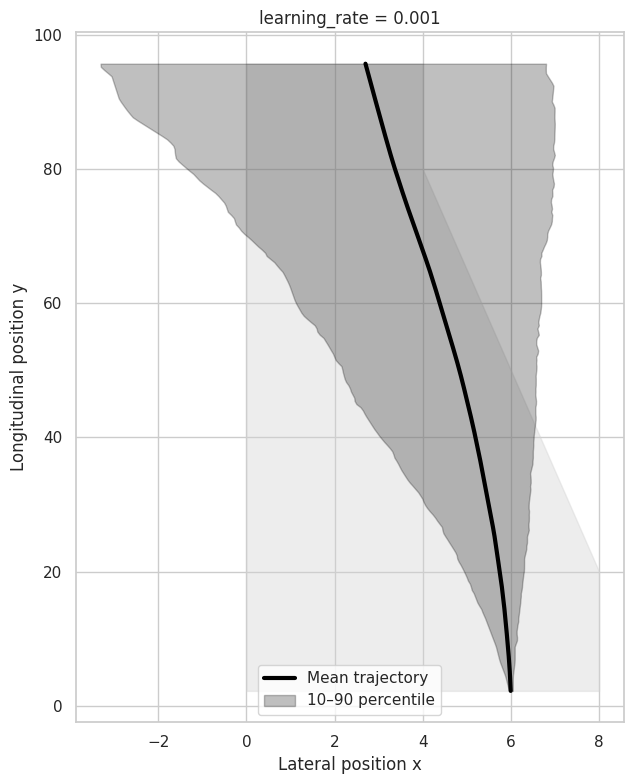

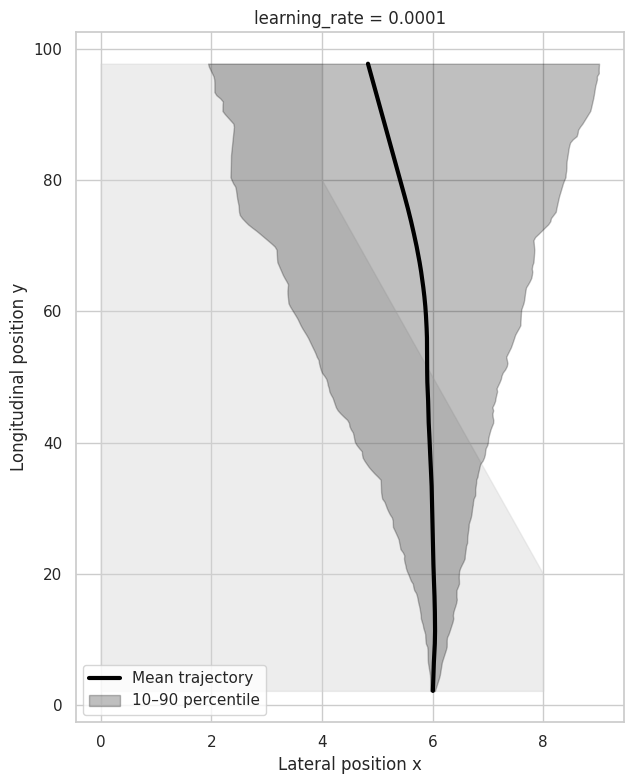

In [ ]:
plot_mean_density_by_factor(df, "learning_rate", 0.01)
plot_mean_density_by_factor(df, "learning_rate", 0.001)
plot_mean_density_by_factor(df, "learning_rate", 0.0001)


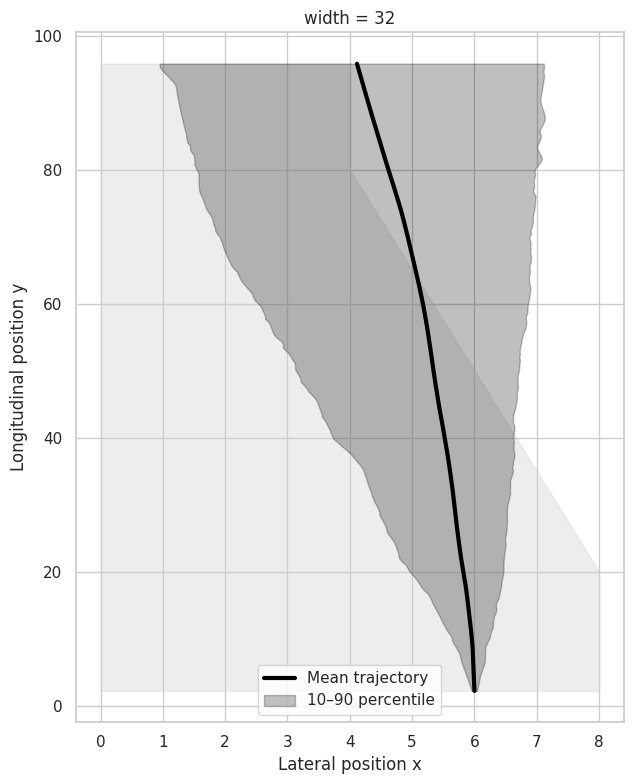

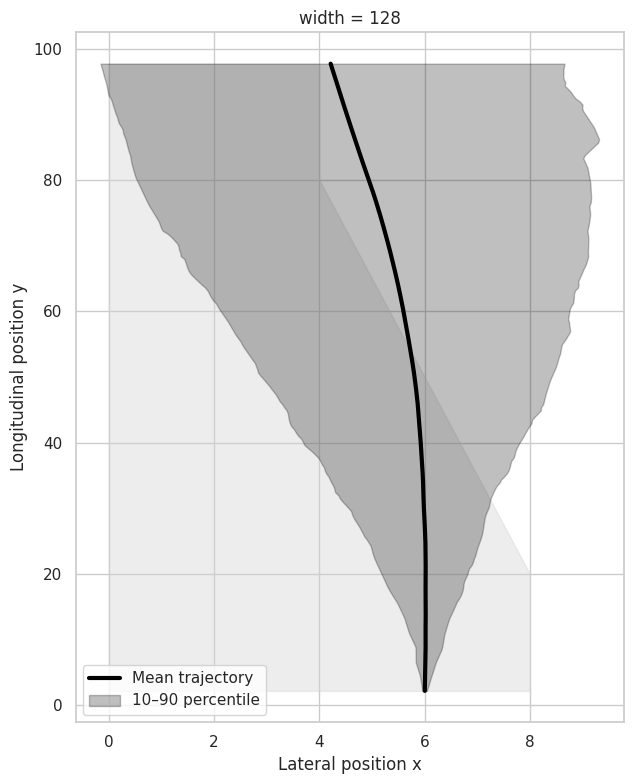

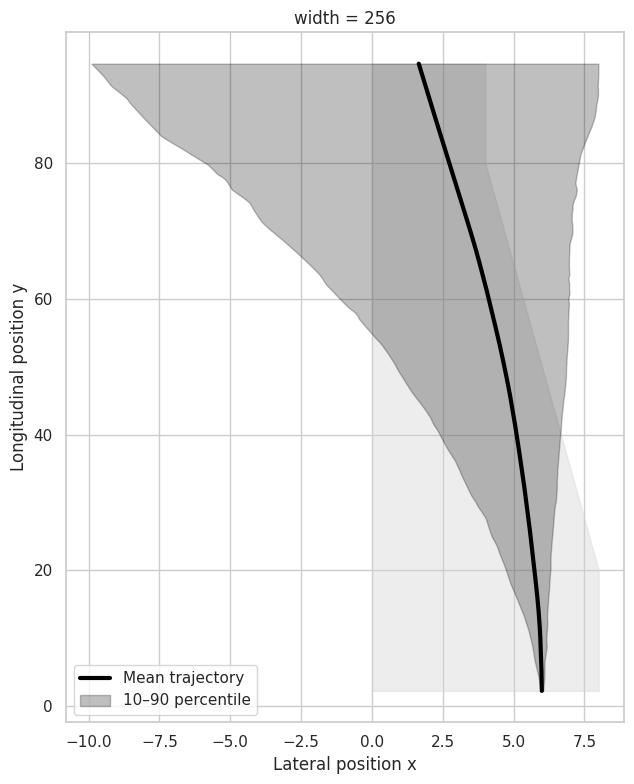

In [ ]:
plot_mean_density_by_factor(df, "width", 32)
plot_mean_density_by_factor(df, "width", 128)
plot_mean_density_by_factor(df, "width", 256)
